# Analysis for generated trees from 2wiki

In [398]:
import json
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
from pylab import rcParams

In [399]:
trees = json.load(open("results/test.json"))

i = 0
# add same index to all nodes in the same tree, to relate them afterwards easily
for tree in trees:
    for node in tree:
        node['example_index'] = i
    i += 1
trees

[[{'idx': 0,
   'question_text': "Who is the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?",
   'sons': [],
   'qd_logprob': None,
   'fa': 2,
   'question': "Who is the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?",
   'cb_answer': ['Michael Fay.',
    -0.13084118458345112,
    "The foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same is Michael Fay. Michael Fay is an American. So the answer is: Michael Fay."],
   'ob_answer': ['Michael P. Fay.',
    -0.05930674595103262,
    "The foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same is Michael P. Fay. So the answer is: Michael P. Fay."],
   'answer': ['Michael P. Fay.',
    -0.05930674595103262,
    "The foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same is Michael P. Fay. So the answer is: Michael P. Fay

In [400]:
# Initialize metrics
leaf_cb_probs, leaf_ob_probs = [], []
parent_probs = {"cb": [], "ob": [], "child": [], "max": []}
answer_type_count = Counter()
children_count_vs_prob = []
example_level_probs_for_parents = [] 
child_question_lengths = []
parent_question_lengths = []
children_count = []


for tree in trees:
    example_probs = {"cb_parent_probs": -100, "ob_parent_probs": -100, "child_parent_probs": -100}
    for node in tree:
        # If leaf node
        if len(node["sons"]) == 0:
            cb_prob = node["cb_answer"][1]
            ob_prob = node["ob_answer"][1]
            leaf_cb_probs.append(cb_prob)
            leaf_ob_probs.append(ob_prob)

            child_question_lengths.append(len(node["question"]))

            # Skip invalid probabilities
            if cb_prob < -10:
                print("Got -100 in child's answer cb! Answer got was: \n", node["cb_answer"][0], "\n")
            if ob_prob < -10:
                print("Got -100 in child's answer ob! Answer got was: \n", node["ob_answer"][0], "\n")
            
            # Track which answer is better
            if ob_prob > cb_prob:
                answer_type_count['ob_child'] += 1
            else:
                answer_type_count['cb_child'] += 1
        
        else:  # Parent node
            cb_prob = node["cb_answer"][1]
            ob_prob = node["ob_answer"][1]
            child_prob = node["child_answer"][1]

            parent_question_lengths.append(len(node["question"]))

            # Store probabilities per example
            example_probs["cb_parent_probs"] = cb_prob
            example_probs["ob_parent_probs"] = ob_prob
            example_probs["child_parent_probs"] = child_prob

            # Skip invalid probabilities
            if cb_prob < -10:
                print(f"Got {cb_prob} in parent's cb answer ! Answer got was: \n", node["cb_answer"][0], "\n")
            if ob_prob < -10:
                print(f"Got {ob_prob} in parent's ob answer ! Answer got was: \n", node["ob_answer"][0], "\n")
            if child_prob < -10:
                print(f"Got {child_prob} in parent's child answer ! Answer got was: \n", node["child_answer"][0], "\n")
            
            parent_probs["cb"].append(cb_prob)
            parent_probs["ob"].append(ob_prob)
            parent_probs["child"].append(child_prob)
            # Choose max probability
            max_prob = max(cb_prob, ob_prob, child_prob)
            parent_probs["max"].append(max_prob)

            if max_prob == cb_prob:
                answer_type_count['cb_parent'] += 1
            elif max_prob == ob_prob:
                answer_type_count['ob_parent'] += 1
            else:
                answer_type_count['child_parent'] += 1
            
            # Store children count vs max probability
            children_count_vs_prob.append((len(node["sons"]), max_prob))
            # Append per-example probabilities
            example_level_probs_for_parents.append(example_probs)
            # children_count for parent
            children_count.append(len(node["sons"]))


Got -100 in child's answer ob! Answer got was: 
 Unknown. 

Got -100 in child's answer ob! Answer got was: 
 Unknown. 

Got -100 in child's answer ob! Answer got was: 
 Unknown. 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in child's answer cb! Answer got was: 
 Please provide the question you'd like me to answer, and I'll respond in the same format. 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in child's answer cb! Answer got was: 
 Please provide the question, and I'll answer it in the same format.

(Please go ahead and provide the question) 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in child's answer ob! Answer got was: 
 Unknown. 

Got -100 in child's answer ob! Answer got was: 
 Unknown. 

Got -100 in parent's ob answer ! Answer got was: 
 Unknown. 

Got -100 in child's answ

In [401]:
print("Open book leaf count with unknown answers: ", len([p for p in leaf_ob_probs if p < -10]))
print("Closed book leaf count with unknown answers: ", len([p for p in leaf_cb_probs if p < -10]))

Open book leaf count with unknown answers:  10
Closed book leaf count with unknown answers:  6


In [402]:
for key, probs in parent_probs.items():
    print(f"{key.upper()} has (unknown) # of times : {len([p for p in probs if p < -10])}")

# This shows we never got the max answer in the parent to 

CB has (unknown) # of times : 0
OB has (unknown) # of times : 18
CHILD has (unknown) # of times : 2
MAX has (unknown) # of times : 0


In [403]:
# Compute statistics
print("### Leaf Node Analysis ###")
print(f"Average CB Answer Log Probability: {np.mean(leaf_cb_probs):.4f}")
print(f"Average OB Answer Log Probability: {np.mean(leaf_ob_probs):.4f}")
print(f"OB Better Than CB: {answer_type_count['ob_child']} times")
print(f"CB Better Than OB: {answer_type_count['cb_child']} times")

print("\n### Parent Node Analysis ###")
for key, probs in parent_probs.items():
    print(f"{key.upper()}, Avg Log Prob: {np.mean(probs):.4f}")

print("\n### Answer Type Distribution ###")
for answer_type, count in answer_type_count.items():
    print(f"{answer_type}: {count} times")

print("\n### Children Count vs Probabilities ###")
children_counts, max_parent_probs = zip(*children_count_vs_prob) if children_count_vs_prob else ([], [])
if children_counts:
    correlation = np.corrcoef(children_counts, max_parent_probs)[0, 1]
    print(f"Correlation Between Children Count and Max Probability: {correlation:.4f}")
else:
    print("No parent nodes with children to analyze.")


### Leaf Node Analysis ###
Average CB Answer Log Probability: -3.0666
Average OB Answer Log Probability: -4.9799
OB Better Than CB: 143 times
CB Better Than OB: 61 times

### Parent Node Analysis ###
CB, Avg Log Prob: -0.0912
OB, Avg Log Prob: -18.2423
CHILD, Avg Log Prob: -0.5688
MAX, Avg Log Prob: -0.0476

### Answer Type Distribution ###
ob_child: 143 times
child_parent: 41 times
cb_child: 61 times
ob_parent: 31 times
cb_parent: 27 times

### Children Count vs Probabilities ###
Correlation Between Children Count and Max Probability: -0.1121


In [404]:
# Filter out invalid probabilities
valid_leaf_cb_probs = [p for p in leaf_cb_probs if p > -10]
valid_leaf_ob_probs = [p for p in leaf_ob_probs if p > -10]

valid_parent_cb_probs = [p for p in parent_probs["cb"] if p > -10]
valid_parent_ob_probs = [p for p in parent_probs["ob"] if p > -10]
valid_parent_child_probs = [p for p in parent_probs["child"] if p > -10]

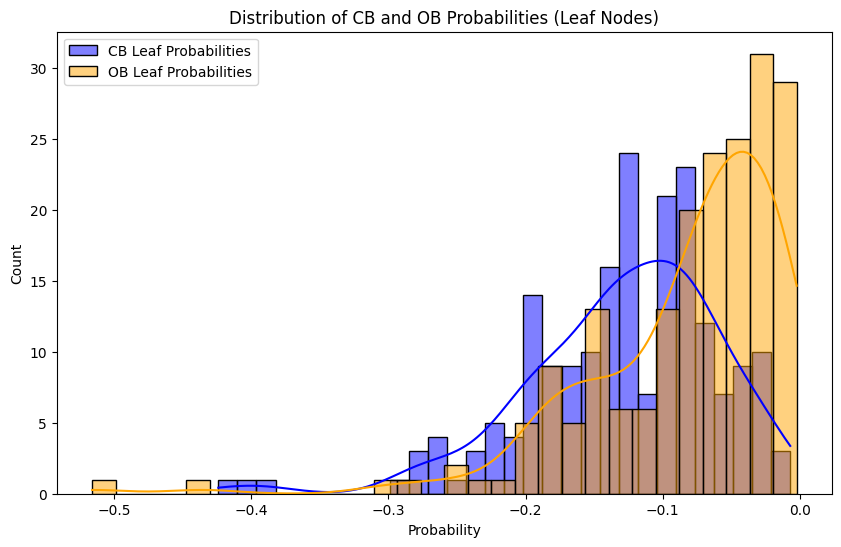

In [405]:
# 1. Distribution of Leaf Probabilities
plt.figure(figsize=(10, 6))
sns.histplot(valid_leaf_cb_probs, color="blue", label="CB Leaf Probabilities", kde=True, bins=30)
sns.histplot(valid_leaf_ob_probs, color="orange", label="OB Leaf Probabilities", kde=True, bins=30)
plt.title("Distribution of CB and OB Probabilities (Leaf Nodes)")
plt.xlabel("Probability")
plt.ylabel("Count")
plt.legend()
plt.show()

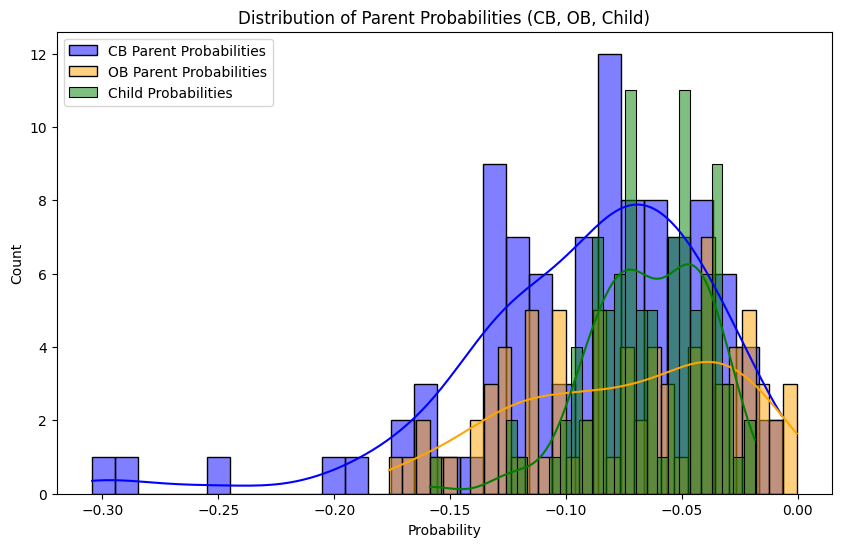

In [406]:
# 2. Parent Probabilities Visualization
plt.figure(figsize=(10, 6))
sns.histplot(valid_parent_cb_probs, color="blue", label="CB Parent Probabilities", kde=True, bins=30)
sns.histplot(valid_parent_ob_probs, color="orange", label="OB Parent Probabilities", kde=True, bins=30)
sns.histplot(valid_parent_child_probs, color="green", label="Child Probabilities", kde=True, bins=30)
plt.title("Distribution of Parent Probabilities (CB, OB, Child)")
plt.xlabel("Probability")
plt.ylabel("Count")
plt.legend()
plt.show()

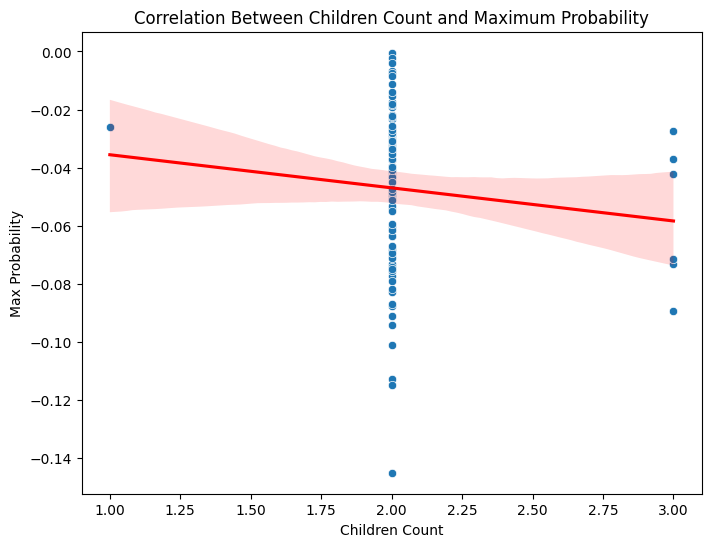

In [407]:
# 4. Correlation: Children Count vs Max Probability
valid_children_count_vs_prob = [
    (count, prob) for count, prob in children_count_vs_prob if prob > -10
]
if valid_children_count_vs_prob:
    children_counts, max_parent_probs = zip(*valid_children_count_vs_prob)
    children_counts = list(children_counts)
    max_parent_probs = list(max_parent_probs)

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=children_counts, y=max_parent_probs)
    sns.regplot(x=children_counts, y=max_parent_probs, scatter=False, color="red")
    plt.title("Correlation Between Children Count and Maximum Probability")
    plt.xlabel("Children Count")
    plt.ylabel("Max Probability")
    plt.show()

/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/684805155.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=answer_types, y=counts, palette="viridis")


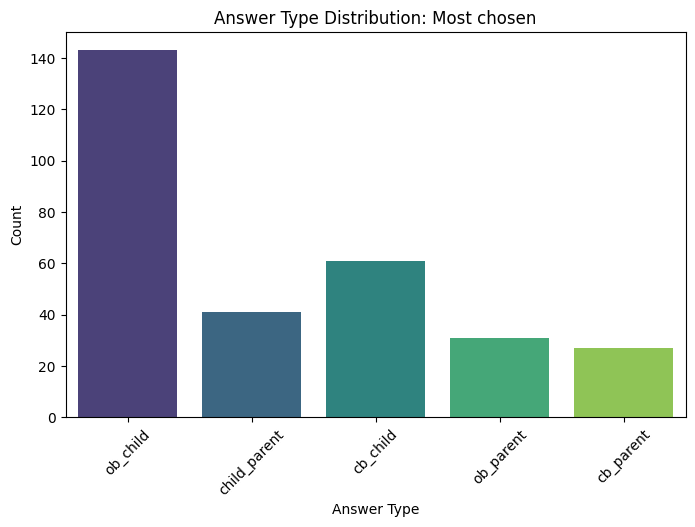

In [408]:
# 5. Bar Chart: Answer Type Distribution
plt.figure(figsize=(8, 5))
answer_types = list(answer_type_count.keys())
counts = list(answer_type_count.values())
sns.barplot(x=answer_types, y=counts, palette="viridis")
plt.title("Answer Type Distribution: Most chosen")
plt.xlabel("Answer Type")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

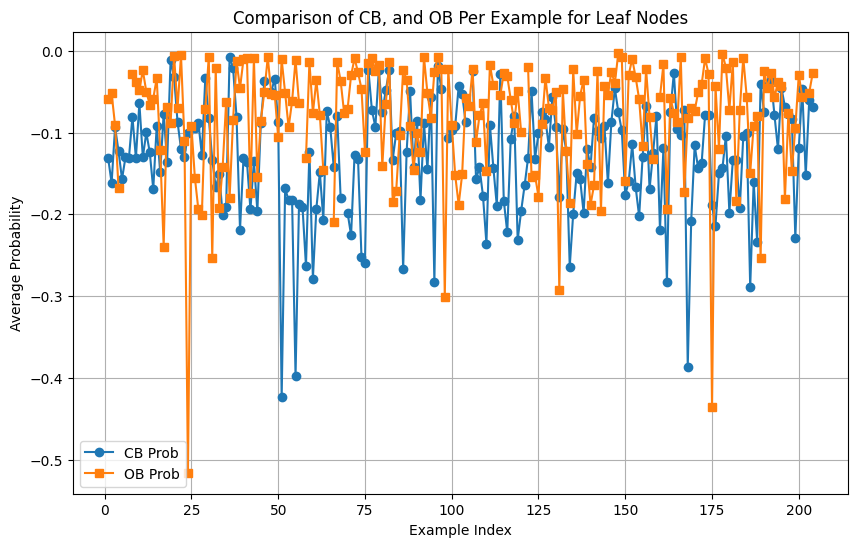

In [409]:
# Visualization of Probabilities Per Example for Leaf Nodes
example_indices = range(1, len(leaf_cb_probs) + 1)

# Replace -100 with NaN in ob_probs
leaf_ob_probs_without_unknown = [np.nan if prob < -10 else prob for prob in leaf_ob_probs]
leaf_cb_probs_without_unknown = [np.nan if prob < -10 else prob for prob in leaf_cb_probs]


# Now plot
plt.figure(figsize=(10, 6))
plt.plot(example_indices, leaf_cb_probs_without_unknown, label="CB Prob", marker="o")
plt.plot(example_indices, leaf_ob_probs_without_unknown, label="OB Prob", marker="s")

plt.xlabel("Example Index")
plt.ylabel("Average Probability")
plt.title("Comparison of CB, and OB Per Example for Leaf Nodes")
plt.legend()
plt.grid(True)
plt.show()

# Its obvious that the open-book probabilities are in general higher.
# One reason could be that leaf nodes are more specific and hence OB is more likely to have the answer.

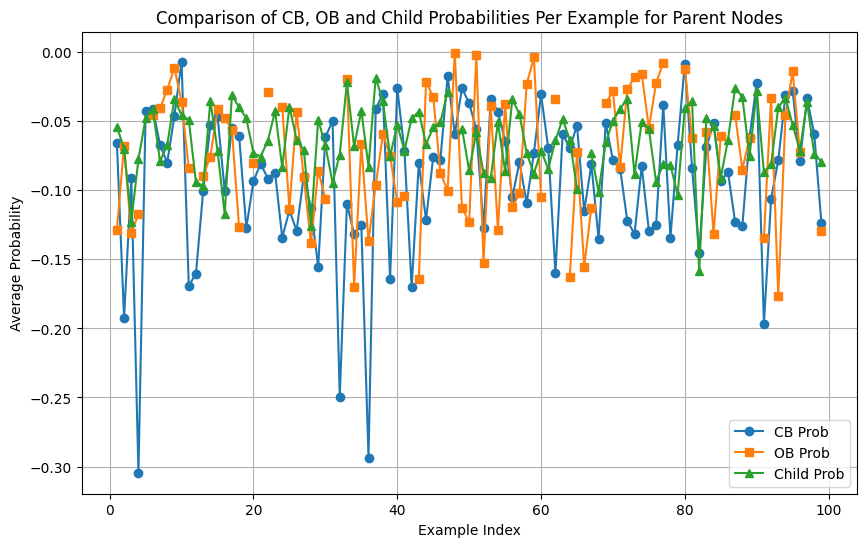

In [410]:
# Visualization of Probabilities Per Example for Parent Nodes
example_indices = range(1, len(example_level_probs_for_parents) + 1)
cb_probs = [e["cb_parent_probs"] for e in example_level_probs_for_parents]
ob_probs = [e["ob_parent_probs"] for e in example_level_probs_for_parents]
child_probs = [e["child_parent_probs"] for e in example_level_probs_for_parents]

# Replace -100 with NaN in ob_probs
ob_probs_without_unknown = [np.nan if prob < -10 else prob for prob in ob_probs]
cb_probs_without_unknown = [np.nan if prob < -10 else prob for prob in cb_probs]
child_probs_without_unknown = [np.nan if prob < -10 else prob for prob in child_probs]

# Now plot
plt.figure(figsize=(10, 6))
plt.plot(example_indices, cb_probs_without_unknown, label="CB Prob", marker="o")
plt.plot(example_indices, ob_probs_without_unknown, label="OB Prob", marker="s")
plt.plot(example_indices, child_probs_without_unknown, label="Child Prob", marker="^")

plt.xlabel("Example Index")
plt.ylabel("Average Probability")
plt.title("Comparison of CB, OB and Child Probabilities Per Example for Parent Nodes")
plt.legend()
plt.grid(True)
plt.show()

# Its obvious that the child probabilities are always the highest, which is not the case in the leaf nodes.
# In leaf nodes, the probabilities are more shifted into OB, One reason could be that leaf nodes are more specific and hence OB is more likely to have the answer.

child answer is max: 41/99
ob answer is max: 31/99
cb answer is max: 27/99


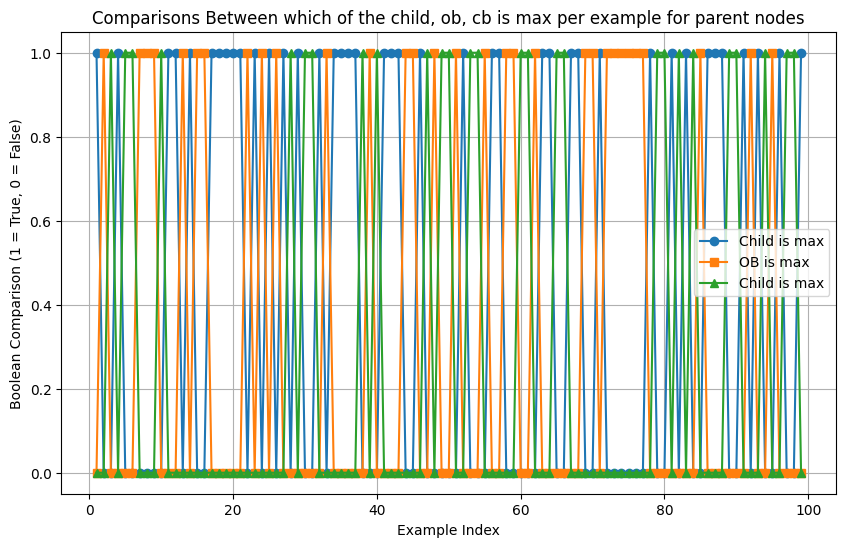

In [411]:
# Extract probabilities
example_indices = range(1, len(example_level_probs_for_parents) + 1)
max_probs = [max(e.values()) for e in example_level_probs_for_parents]

# Create pairwise comparisons
child_is_max = [child == max_ for child, max_ in zip(child_probs, max_probs)]
ob_is_max = [ob == max_ for ob, max_ in zip(ob_probs, max_probs)]
cb_is_max = [cb == max_ for cb, max_ in zip(cb_probs, max_probs)]

# Calculate percentages
child_is_max_count = sum(child_is_max)
ob_is_max_count = sum(ob_is_max)
cb_is_max_count = sum(cb_is_max)

# Print summary
print(f"child answer is max: {child_is_max_count}/{len(example_indices)}")
print(f"ob answer is max: {ob_is_max_count}/{len(example_indices)}")
print(f"cb answer is max: {cb_is_max_count}/{len(example_indices)}")

# Visualization
plt.figure(figsize=(10, 6))
plt.plot(example_indices, child_is_max, label="Child is max", marker="o")
plt.plot(example_indices, ob_is_max, label="OB is max", marker="s")
plt.plot(example_indices, cb_is_max, label="Child is max", marker="^")

plt.xlabel("Example Index")
plt.ylabel("Boolean Comparison (1 = True, 0 = False)")
plt.title("Comparisons Between which of the child, ob, cb is max per example for parent nodes")
plt.legend()
plt.grid(True)
plt.show()


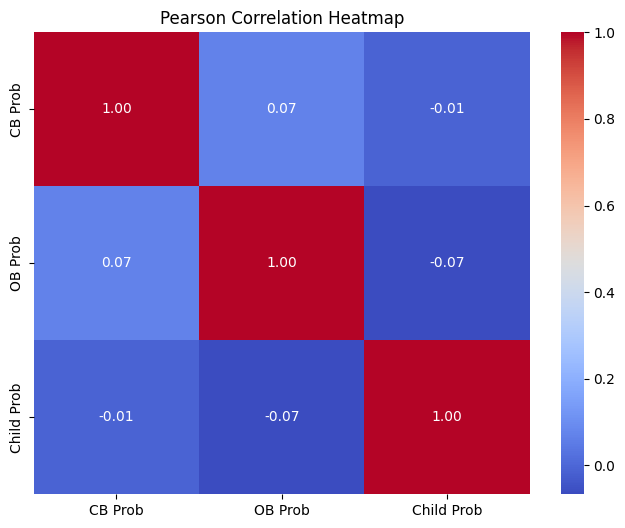

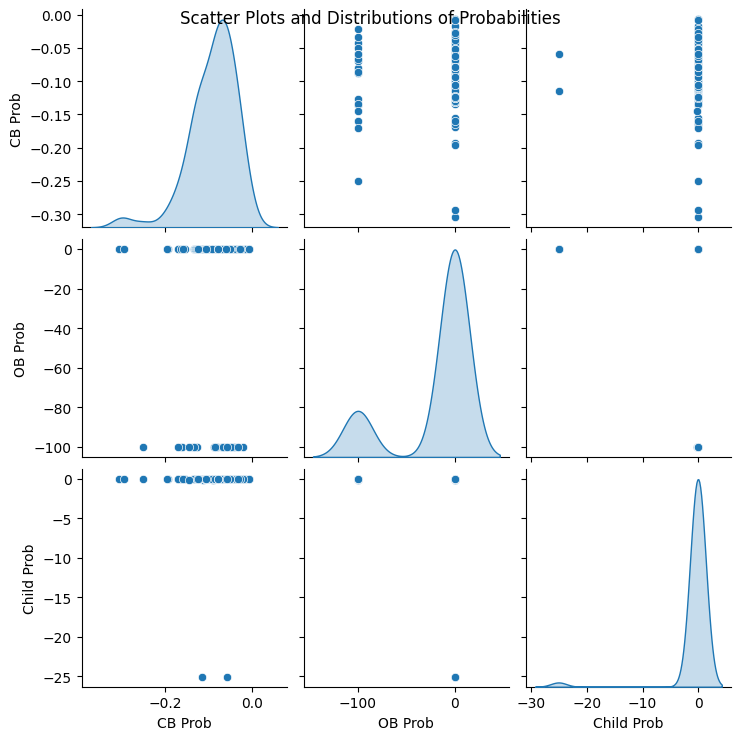

Pearson Correlation Matrix:
 [[ 1.          0.06679453 -0.00889855]
 [ 0.06679453  1.         -0.06654691]
 [-0.00889855 -0.06654691  1.        ]]
Spearman Correlation Matrix (approx):
 [[ 1.          0.11458256 -0.02230056]
 [ 0.11458256  1.          0.09278912]
 [-0.02230056  0.09278912  1.        ]]


In [412]:
# Extract probabilities
cb_probs = np.array(cb_probs)
ob_probs = np.array(ob_probs)
child_probs = np.array(child_probs)

# Combine probabilities into a matrix
data = np.vstack((cb_probs, ob_probs, child_probs)).T
labels = ["CB Prob", "OB Prob", "Child Prob"]

# Compute correlations
pearson_corr = np.corrcoef(data, rowvar=False)  # Pearson correlation
spearman_corr = np.corrcoef(np.argsort(data, axis=0), rowvar=False)  # Spearman approximation

# Display Pearson correlation as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(pearson_corr, annot=True, xticklabels=labels, yticklabels=labels, cmap="coolwarm", fmt=".2f")
plt.title("Pearson Correlation Heatmap")
plt.show()

# Pairwise scatter plots
sns.pairplot(pd.DataFrame(data, columns=labels), kind="scatter", diag_kind="kde")
plt.suptitle("Scatter Plots and Distributions of Probabilities")
plt.show()

# Print correlation values
print("Pearson Correlation Matrix:\n", pearson_corr)
print("Spearman Correlation Matrix (approx):\n", spearman_corr)


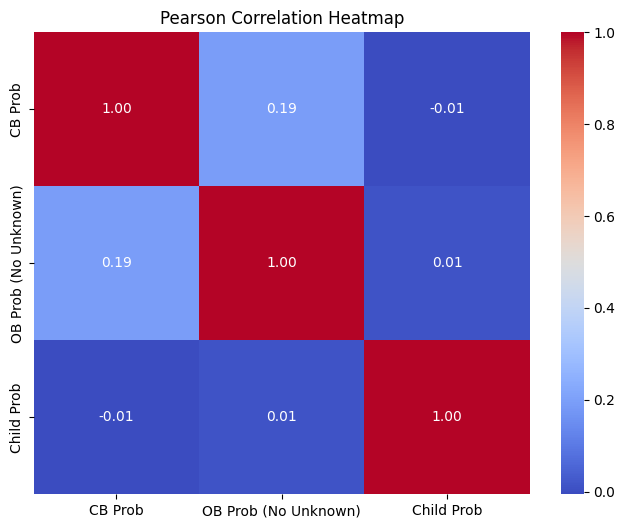

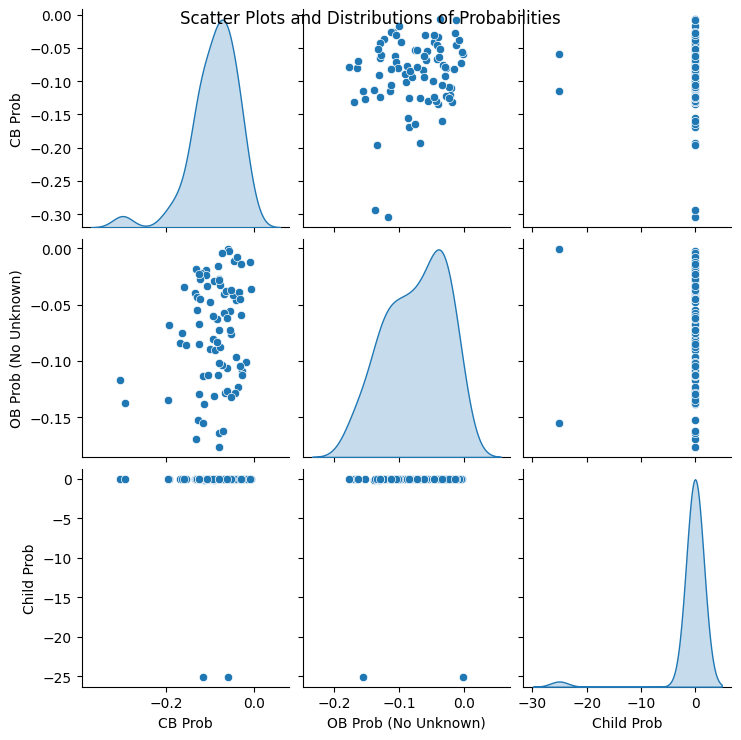

Pearson Correlation Matrix:
 [[ 1.          0.19123661 -0.00565857]
 [ 0.19123661  1.          0.01368159]
 [-0.00565857  0.01368159  1.        ]]
Spearman Correlation Matrix (approx):
 [[ 1.         -0.11391147  0.03123306]
 [-0.11391147  1.          0.17768744]
 [ 0.03123306  0.17768744  1.        ]]


In [413]:
# Doing the same but after removing the unknowns from ob_probs

# Extract probabilities
cb_probs = np.array(cb_probs)
ob_probs_without_unknown = np.array(ob_probs_without_unknown)
child_probs = np.array(child_probs)

# Combine probabilities into a matrix
data = np.vstack((cb_probs, ob_probs_without_unknown, child_probs)).T
labels = ["CB Prob", "OB Prob (No Unknown)", "Child Prob"]

# Remove rows where any value is NaN
valid_rows = ~np.isnan(data).any(axis=1)  # Identify rows with no NaN values
data_clean = data[valid_rows]

# Compute correlations
pearson_corr = np.corrcoef(data_clean, rowvar=False)  # Pearson correlation
spearman_corr = np.corrcoef(np.argsort(data_clean, axis=0), rowvar=False)  # Spearman approximation

# Display Pearson correlation as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(pearson_corr, annot=True, xticklabels=labels, yticklabels=labels, cmap="coolwarm", fmt=".2f")
plt.title("Pearson Correlation Heatmap")
plt.show()

# Pairwise scatter plots
sns.pairplot(pd.DataFrame(data_clean, columns=labels), kind="scatter", diag_kind="kde")
plt.suptitle("Scatter Plots and Distributions of Probabilities")
plt.show()

# Print correlation values
print("Pearson Correlation Matrix:\n", pearson_corr)
print("Spearman Correlation Matrix (approx):\n", spearman_corr)


# Checking Question Lengths with the answers ?

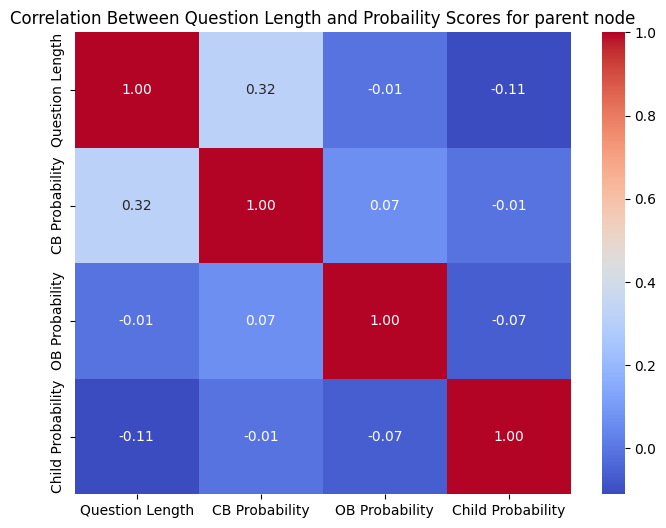

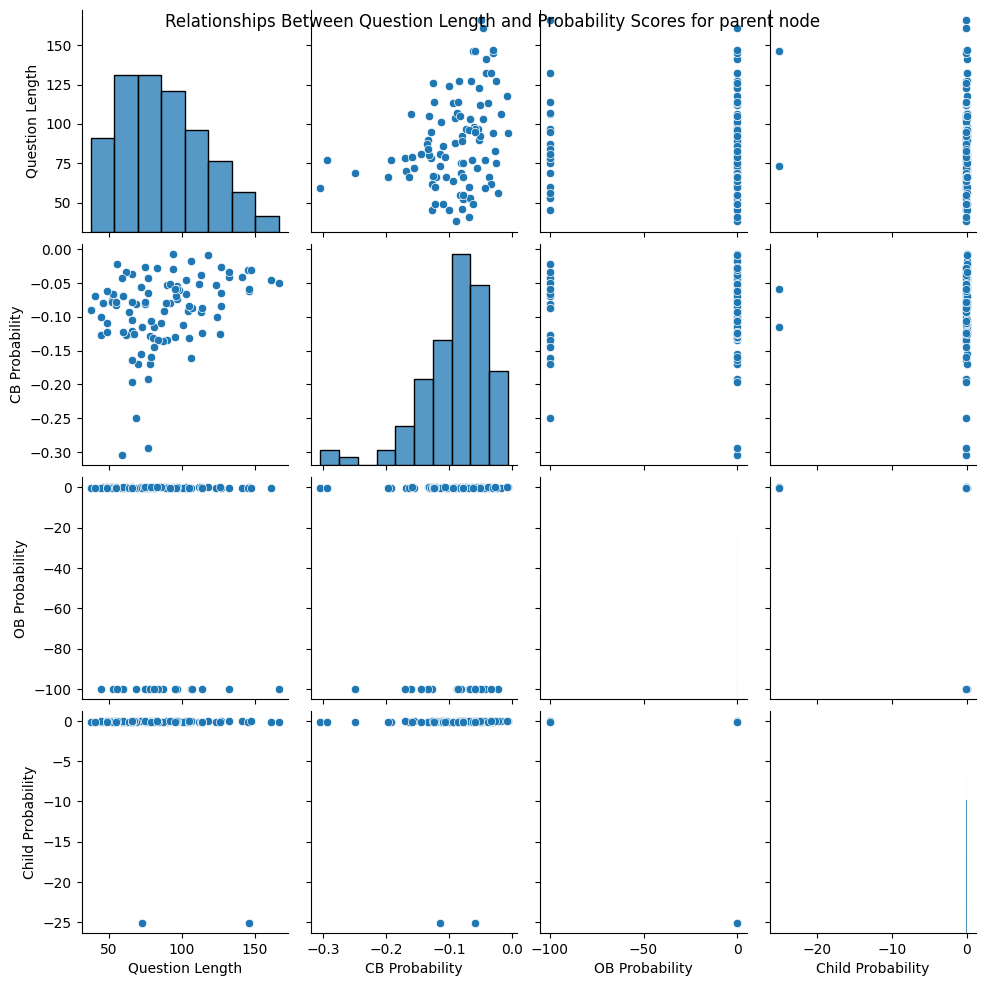

       Question Length  CB Probability  OB Probability  Child Probability
count        99.000000       99.000000       99.000000          99.000000
mean         87.323232       -0.091226      -18.242330          -0.568824
std          29.018231        0.054226       38.737097           3.533155
min          38.000000       -0.304458     -100.000000         -25.052780
25%          66.000000       -0.123616       -0.137645          -0.081574
50%          81.000000       -0.080276       -0.085698          -0.064066
75%         105.000000       -0.053948       -0.040176          -0.045286
max         166.000000       -0.006871       -0.000423          -0.018481


In [414]:
# Create a DataFrame
data = pd.DataFrame({
    "Question Length": parent_question_lengths,
    "CB Probability": cb_probs,
    "OB Probability": ob_probs,
    "Child Probability": child_probs
})

# Pairwise correlation matrix
correlation_matrix = data.corr()

# Correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Question Length and Probaility Scores for parent node")
plt.show()

# Scatter plots
sns.pairplot(data)
plt.suptitle("Relationships Between Question Length and Probability Scores for parent node")
plt.show()

# Summary statistics
print(data.describe())

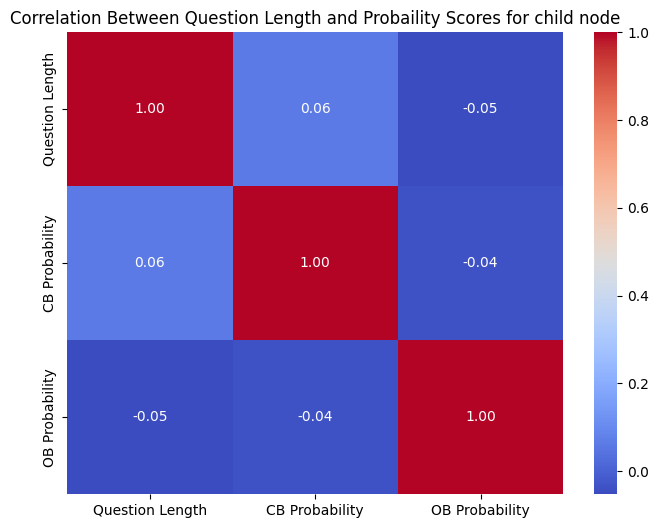

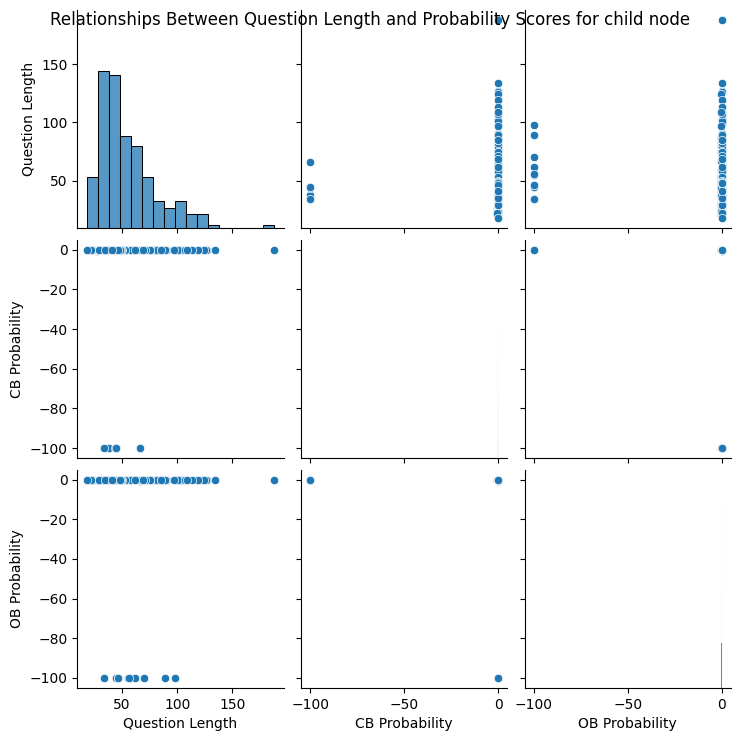

       Question Length  CB Probability  OB Probability
count       204.000000      204.000000      204.000000
mean         53.985294       -3.066595       -4.979923
std          26.222143       16.915593       21.626390
min          18.000000     -100.000000     -100.000000
25%          36.000000       -0.177621       -0.134337
50%          46.000000       -0.124904       -0.064512
75%          66.000000       -0.081481       -0.029367
max         188.000000       -0.007010       -0.002315


In [415]:
# Create a DataFrame
data = pd.DataFrame({
    "Question Length": child_question_lengths,
    "CB Probability": leaf_cb_probs,
    "OB Probability": leaf_ob_probs,
})

# Pairwise correlation matrix
correlation_matrix = data.corr()

# Correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Question Length and Probaility Scores for child node")
plt.show()

# Scatter plots
sns.pairplot(data)
plt.suptitle("Relationships Between Question Length and Probability Scores for child node")
plt.show()

# Summary statistics
print(data.describe())

# Number of Children ? 

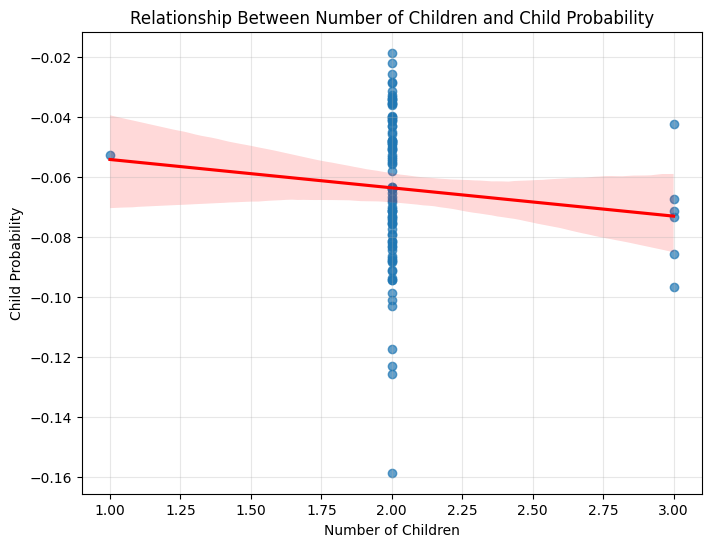

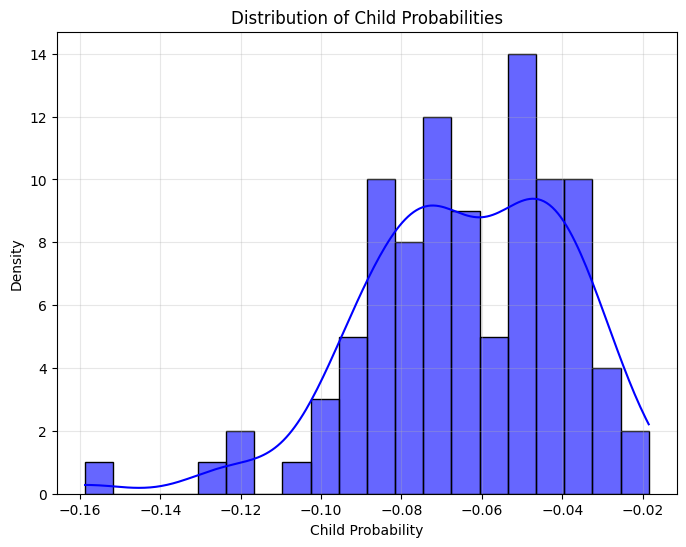

In [416]:
# Filter case in child_probs where probability is < -1, note children_count is corresponding to child_probs
child_probs_filtered = [p for p in child_probs if p > -10]
children_count_filtered = [c for c, p in zip(children_count, child_probs) if p > -10]

# Create a DataFrame
data = pd.DataFrame({
    "Number of children": children_count_filtered,
    "Child Probability": child_probs_filtered
})

plt.figure(figsize=(8, 6))
sns.regplot(
    x="Number of children", 
    y="Child Probability", 
    data=data, 
    scatter_kws={"alpha": 0.7}, 
    line_kws={"color": "red"}
)
plt.title("Relationship Between Number of Children and Child Probability")
plt.xlabel("Number of Children")
plt.ylabel("Child Probability")
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(8, 6))
sns.histplot(data["Child Probability"], kde=True, bins=20, color="blue", alpha=0.6)
plt.title("Distribution of Child Probabilities")
plt.xlabel("Child Probability")
plt.ylabel("Density")
plt.grid(alpha=0.3)
plt.show()


# Agreement/Disagreement Across Predictions (CB, OB, and Final Answers)

In [417]:
# DataFrame for easier manipulation
all_nodes_merged = np.concatenate(trees, axis=0 )
df = pd.DataFrame(all_nodes_merged)

# Extract the JSON data from the first column
df = pd.json_normalize(df.iloc[:, 0])
df

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer
0,0,Who is the foreign born victim of Singapore's ...,[],NaN,2.0,Who is the foreign born victim of Singapore's ...,"[Michael Fay., -0.13084118458345112, The forei...","[Michael P. Fay., -0.05930674595103262, The fo...","[Michael P. Fay., -0.05930674595103262, The fo...",0,NaN
1,1,What is the nationality of <1>?,[],NaN,2.0,What is the nationality of Michael P. Fay.?,"[American., -0.16180472025348555, Michael P. F...","[United States., -0.05192142181429908, The nat...","[United States., -0.05192142181429908, The nat...",0,NaN
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co..."
3,0,Which 1970 international hit song is Murray He...,[],NaN,2.0,Which 1970 international hit song is Murray He...,"[Jesus Christ Superstar., -0.0934109261805143,...","[Superstar., -0.09109426803993789, Murray Head...","[Superstar., -0.09109426803993789, Murray Head...",1,NaN
4,1,Who wrote <1>?,[],NaN,2.0,Who wrote Superstar.?,"[Bonnie Bramlett, Leon Russell, and Delaney Br...","[Unknown., -0.16777198651664987, The question ...","[Bonnie Bramlett, Leon Russell, and Delaney Br...",1,NaN
...,...,...,...,...,...,...,...,...,...,...,...
298,1,Typically how many pages were in <1>?,[],NaN,2.0,Typically how many pages were in Weird Tales.?,"[128., -0.15241830499214412, Weird Tales was a...","[Unknown., -100, Unknown.]","[128., -0.15241830499214412, Weird Tales was a...",98,NaN
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ..."
300,0,What multi-sport event did the OCA announce ma...,[],NaN,2.0,What multi-sport event did the OCA announce ma...,"[Asian Games., -0.060506334834164816, The OCA ...","[Asian Games., -0.05117876257346, The OCA anno...","[Asian Games., -0.05117876257346, The OCA anno...",99,NaN
301,1,In what city did <1> take place?,[],NaN,2.0,In what city did Asian Games. take place?,"[Incheon, South Korea., -0.06844435525578267, ...","[Kathmandu, Nepal., -0.02748896957585874, The ...","[Kathmandu, Nepal., -0.02748896957585874, The ...",99,NaN


In [418]:
import re
import string

def normalize_answer(s):

    def remove_articles(text):
        return re.sub(r'\b(a|an|the)\b', ' ', text)

    def white_space_fix(text):
        return ' '.join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return ''.join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

In [419]:
# Agreement count between the different answers for the same question
df['cb_ob_agreement'] = ((df['cb_answer'].apply(lambda x: normalize_answer(x[0])) == df['ob_answer'].apply(lambda x: normalize_answer(x[0])) )
                        & (df['cb_answer'].apply(lambda x: x[1]) > - 10) & (df['ob_answer'].apply(lambda x: x[1]) > - 10))     # Ensuring that we dont count unknown cases as agreement

df['cb_child_agreement'] = ((df['cb_answer'].apply(lambda x: normalize_answer(x[0])) == df['child_answer'].apply(lambda x: normalize_answer(x[0]) if isinstance(x, list) else None))
                            & (df['cb_answer'].apply(lambda x: x[1]) > - 10) & (df['child_answer'].apply(lambda x: x[1] if isinstance(x, list) else -1000) > - 10))  # Ensuring that we dont count unknown cases as agreement

df['ob_child_agreement'] = ((df['ob_answer'].apply(lambda x: normalize_answer(x[0])) == df['child_answer'].apply(lambda x: normalize_answer(x[0]) if isinstance(x, list) else None))
                            & (df['ob_answer'].apply(lambda x: x[1]) > - 10) & (df['child_answer'].apply(lambda x: x[1] if isinstance(x, list) else -1000) > - 10))  # Ensuring that we dont count unknown cases as agreement

agreement_freq_cb_ob = df['cb_ob_agreement'].mean()  # Calculate frequency of agreement
agreement_freq_cb_child = df['cb_child_agreement'].mean()  # Calculate frequency of agreement
agreement_freq_ob_child = df['ob_child_agreement'].mean()  # Calculate frequency of agreement

print(f"Agreement Frequency between cb and ob: {agreement_freq_cb_ob * 100:.2f}% , Total: {df['cb_ob_agreement'].sum()}")
print(f"Agreement Frequency between cb and child: {agreement_freq_cb_child * 100:.2f}%, Total: {df['cb_child_agreement'].sum()}")
print(f"Agreement Frequency between child and ob: {agreement_freq_ob_child * 100:.2f}%, Total: {df['ob_child_agreement'].sum()}")

Agreement Frequency between cb and ob: 32.01% , Total: 97
Agreement Frequency between cb and child: 14.19%, Total: 43
Agreement Frequency between child and ob: 11.22%, Total: 34


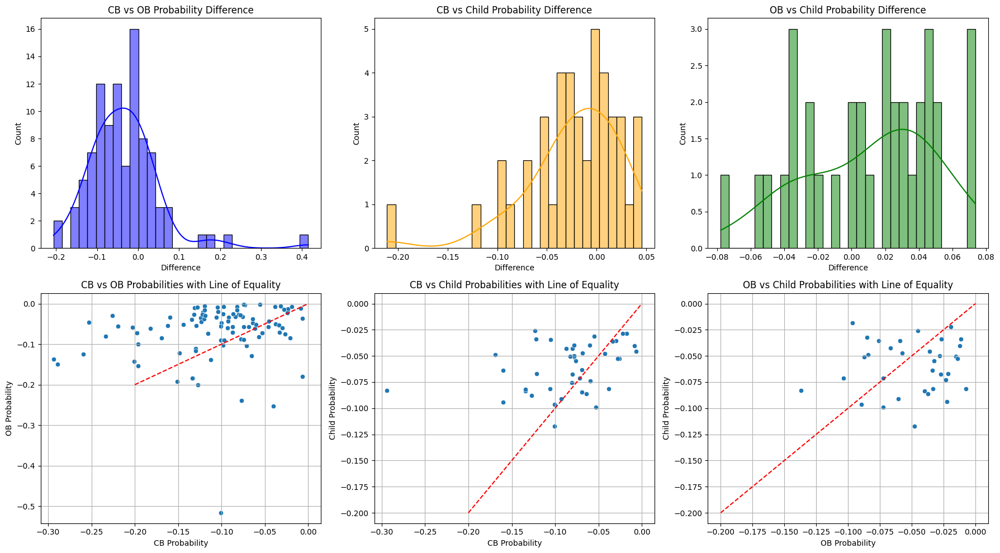

In [420]:
# 1. Create the DataFrame for each type of agreement comparison

# CB and OB probabilities
cb_ob_agreement_indices = df[df['cb_ob_agreement']].index
cb_probs_cb_ob_agreement = df.loc[cb_ob_agreement_indices, 'cb_answer'].apply(lambda x: x[1])
ob_probs_cb_ob_agreement = df.loc[cb_ob_agreement_indices, 'ob_answer'].apply(lambda x: x[1])

# CB and Child probabilities
cb_child_agreement_indices = df[df['cb_child_agreement']].index
cb_probs_cb_child_agreement = df.loc[cb_child_agreement_indices, 'cb_answer'].apply(lambda x: x[1])
child_probs_cb_child_agreement = df.loc[cb_child_agreement_indices, 'child_answer'].apply(lambda x: x[1] if isinstance(x, list) else None)

# OB and Child probabilities
ob_child_agreement_indices = df[df['ob_child_agreement']].index
ob_probs_ob_child_agreement = df.loc[ob_child_agreement_indices, 'ob_answer'].apply(lambda x: x[1])
child_probs_ob_child_agreement = df.loc[ob_child_agreement_indices, 'child_answer'].apply(lambda x: x[1] if isinstance(x, list) else None)

# Create DataFrame for each comparison
data_cb_ob = pd.DataFrame({
    "CB Probability": cb_probs_cb_ob_agreement,
    "OB Probability": ob_probs_cb_ob_agreement,
    "Difference": cb_probs_cb_ob_agreement - ob_probs_cb_ob_agreement
})

data_cb_child = pd.DataFrame({
    "CB Probability": cb_probs_cb_child_agreement,
    "Child Probability": child_probs_cb_child_agreement,
    "Difference": cb_probs_cb_child_agreement - child_probs_cb_child_agreement
})

data_ob_child = pd.DataFrame({
    "OB Probability": ob_probs_ob_child_agreement,
    "Child Probability": child_probs_ob_child_agreement,
    "Difference": ob_probs_ob_child_agreement - child_probs_ob_child_agreement
})

# 2. Create the subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# First row: Distribution of Differences
# CB vs OB Probability Difference
sns.histplot(data_cb_ob["Difference"], kde=True, color="blue", bins=30, ax=axes[0, 0])
axes[0, 0].set_title("CB vs OB Probability Difference")
axes[0, 0].set_xlabel("Difference")
axes[0, 0].set_ylabel("Count")

# CB vs Child Probability Difference
sns.histplot(data_cb_child["Difference"], kde=True, color="orange", bins=30, ax=axes[0, 1])
axes[0, 1].set_title("CB vs Child Probability Difference")
axes[0, 1].set_xlabel("Difference")
axes[0, 1].set_ylabel("Count")

# OB vs Child Probability Difference
sns.histplot(data_ob_child["Difference"], kde=True, color="green", bins=30, ax=axes[0, 2])
axes[0, 2].set_title("OB vs Child Probability Difference")
axes[0, 2].set_xlabel("Difference")
axes[0, 2].set_ylabel("Count")

# Second row: Scatter Plots
# CB vs OB Scatter Plot
sns.scatterplot(x="CB Probability", y="OB Probability", data=data_cb_ob, ax=axes[1, 0])
axes[1, 0].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 0].set_title("CB vs OB Probabilities with Line of Equality")
axes[1, 0].set_xlabel("CB Probability")
axes[1, 0].set_ylabel("OB Probability")
axes[1, 0].grid(True)

# CB vs Child Scatter Plot
sns.scatterplot(x="CB Probability", y="Child Probability", data=data_cb_child, ax=axes[1, 1])
axes[1, 1].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 1].set_title("CB vs Child Probabilities with Line of Equality")
axes[1, 1].set_xlabel("CB Probability")
axes[1, 1].set_ylabel("Child Probability")
axes[1, 1].grid(True)

# OB vs Child Scatter Plot
sns.scatterplot(x="OB Probability", y="Child Probability", data=data_ob_child, ax=axes[1, 2])
axes[1, 2].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 2].set_title("OB vs Child Probabilities with Line of Equality")
axes[1, 2].set_xlabel("OB Probability")
axes[1, 2].set_ylabel("Child Probability")
axes[1, 2].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Confidence measure is not reliable !!!!

It's weird that even if we got the same answers, the COT probability measured for different types differ 
The main reason is because we are using an llm which is conditioned on the input (prompt in our case) and prompts for different types differ.

CB-OB : When they agree on the same answer, sometimes cb > ob and sometimes viceversa
CB-CHILD: Child probability is at most of the times larger than the cb when they agree on the same answer
OB-CHILD: Child probability is at most of the times larger than the ob when they agree on the same answer

In [421]:
# I want to print them side by side to see if there is a pattern, why one cot is better than the other
# for i in range(10):
#     print("CB Answer: ", data.iloc[i]['CB COT Answer'])
#     print("OB Answer: ", data.iloc[i]['OB COT Answer'])
#     print("Difference: ", data.iloc[i]['difference'])
#     print("\n")

Disagreement Frequency between cb and ob: 56.77% , Total: 172
Disagreement Frequency between cb and child: 17.82%, Total: 54
Disagreement Frequency between child and ob: 14.85%, Total: 45


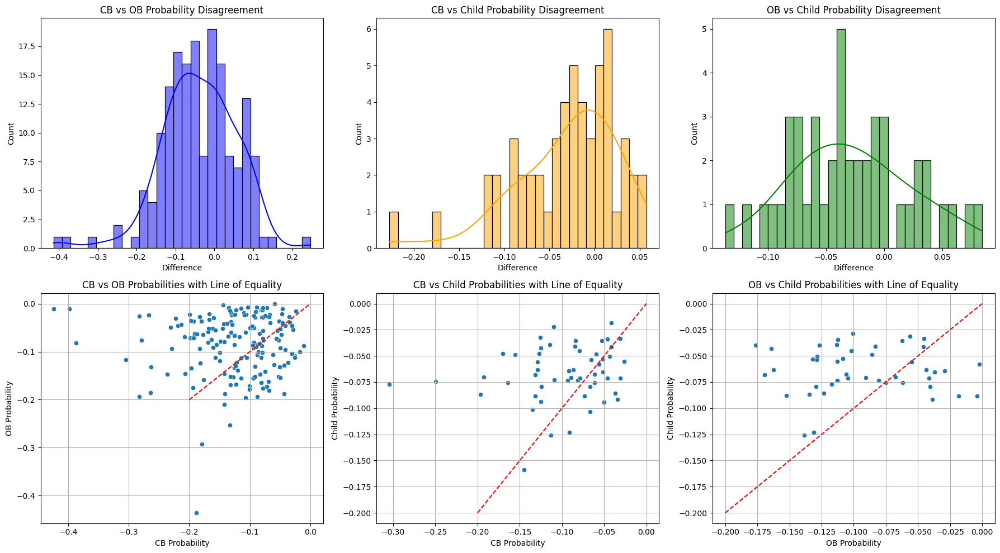

In [422]:
# Disagreement count between the different answers for the same question, can we get them from agreement df['cb_ob_agreement']
df['cb_ob_disagreement'] = ((df['cb_answer'].apply(lambda x: normalize_answer(x[0])) != df['ob_answer'].apply(lambda x: normalize_answer(x[0])))
                        & (df['cb_answer'].apply(lambda x: x[1]) > - 10) & (df['ob_answer'].apply(lambda x: x[1]) > - 10))     # Ensuring that we dont count unknown cases as disagreement

df['cb_child_disagreement'] = ((df['cb_answer'].apply(lambda x: normalize_answer(x[0])) != df['child_answer'].apply(lambda x: normalize_answer(x[0]) if isinstance(x, list) else None))
                            & (df['cb_answer'].apply(lambda x: x[1]) > - 10) & (df['child_answer'].apply(lambda x: x[1] if isinstance(x, list) else -1000) > - 10))  # Ensuring that we dont count unknown cases as disagreement

df['ob_child_disagreement'] = ((df['ob_answer'].apply(lambda x: normalize_answer(x[0])) != df['child_answer'].apply(lambda x: normalize_answer(x[0]) if isinstance(x, list) else None))
                            & (df['ob_answer'].apply(lambda x: x[1]) > - 10) & (df['child_answer'].apply(lambda x: x[1] if isinstance(x, list) else -1000) > - 10))  # Ensuring that we dont count unknown cases as disagreement


disagreement_freq_cb_ob = df['cb_ob_disagreement'].mean()  # Calculate frequency of disagreement
disagreement_freq_cb_child = df['cb_child_disagreement'].mean()  # Calculate frequency of disagreement
disagreement_freq_ob_child = df['ob_child_disagreement'].mean()  # Calculate frequency of disagreement

print(f"Disagreement Frequency between cb and ob: {disagreement_freq_cb_ob * 100:.2f}% , Total: {df['cb_ob_disagreement'].sum()}")
print(f"Disagreement Frequency between cb and child: {disagreement_freq_cb_child * 100:.2f}%, Total: {df['cb_child_disagreement'].sum()}")
print(f"Disagreement Frequency between child and ob: {disagreement_freq_ob_child * 100:.2f}%, Total: {df['ob_child_disagreement'].sum()}")

# 1. Create the DataFrame for each type of disagreement comparison

# CB and OB probabilities
cb_ob_disagreement_indices = df[df['cb_ob_disagreement']].index
cb_probs_cb_ob_disagreement = df.loc[cb_ob_disagreement_indices, 'cb_answer'].apply(lambda x: x[1])
ob_probs_cb_ob_disagreement = df.loc[cb_ob_disagreement_indices, 'ob_answer'].apply(lambda x: x[1])

# CB and Child probabilities
cb_child_disagreement_indices = df[df['cb_child_disagreement']].index
cb_probs_cb_child_disagreement = df.loc[cb_child_disagreement_indices, 'cb_answer'].apply(lambda x: x[1])
child_probs_cb_child_disagreement = df.loc[cb_child_disagreement_indices, 'child_answer'].apply(lambda x: x[1] if isinstance(x, list) else None)

# OB and Child probabilities
ob_child_disagreement_indices = df[df['ob_child_disagreement']].index
ob_probs_ob_child_disagreement = df.loc[ob_child_disagreement_indices, 'ob_answer'].apply(lambda x: x[1])
child_probs_ob_child_disagreement = df.loc[ob_child_disagreement_indices, 'child_answer'].apply(lambda x: x[1] if isinstance(x, list) else None)

# Create DataFrame for each disagreement comparison
data_cb_ob_disagreement = pd.DataFrame({
    "CB Probability": cb_probs_cb_ob_disagreement,
    "OB Probability": ob_probs_cb_ob_disagreement,
    "Difference": cb_probs_cb_ob_disagreement - ob_probs_cb_ob_disagreement
})

data_cb_child_disagreement = pd.DataFrame({
    "CB Probability": cb_probs_cb_child_disagreement,
    "Child Probability": child_probs_cb_child_disagreement,
    "Difference": cb_probs_cb_child_disagreement - child_probs_cb_child_disagreement
})

data_ob_child_disagreement = pd.DataFrame({
    "OB Probability": ob_probs_ob_child_disagreement,
    "Child Probability": child_probs_ob_child_disagreement,
    "Difference": ob_probs_ob_child_disagreement - child_probs_ob_child_disagreement
})

# 2. Create the subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# First row: Distribution of Differences
# CB vs OB Probability Difference
sns.histplot(data_cb_ob_disagreement["Difference"], kde=True, color="blue", bins=30, ax=axes[0, 0])
axes[0, 0].set_title("CB vs OB Probability Disagreement")
axes[0, 0].set_xlabel("Difference")
axes[0, 0].set_ylabel("Count")

# CB vs Child Probability Difference
sns.histplot(data_cb_child_disagreement["Difference"], kde=True, color="orange", bins=30, ax=axes[0, 1])
axes[0, 1].set_title("CB vs Child Probability Disagreement")
axes[0, 1].set_xlabel("Difference")
axes[0, 1].set_ylabel("Count")

# OB vs Child Probability Difference
sns.histplot(data_ob_child_disagreement["Difference"], kde=True, color="green", bins=30, ax=axes[0, 2])
axes[0, 2].set_title("OB vs Child Probability Disagreement")
axes[0, 2].set_xlabel("Difference")
axes[0, 2].set_ylabel("Count")

# Second row: Scatter Plots
# CB vs OB Scatter Plot
sns.scatterplot(x="CB Probability", y="OB Probability", data=data_cb_ob_disagreement, ax=axes[1, 0])
axes[1, 0].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 0].set_title("CB vs OB Probabilities with Line of Equality")
axes[1, 0].set_xlabel("CB Probability")
axes[1, 0].set_ylabel("OB Probability")
axes[1, 0].grid(True)

# CB vs Child Scatter Plot
sns.scatterplot(x="CB Probability", y="Child Probability", data=data_cb_child_disagreement, ax=axes[1, 1])
axes[1, 1].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 1].set_title("CB vs Child Probabilities with Line of Equality")
axes[1, 1].set_xlabel("CB Probability")
axes[1, 1].set_ylabel("Child Probability")
axes[1, 1].grid(True)

# OB vs Child Scatter Plot
sns.scatterplot(x="OB Probability", y="Child Probability", data=data_ob_child_disagreement, ax=axes[1, 2])
axes[1, 2].plot([-0.2, 0], [-0.2, 0], color="red", linestyle="--")
axes[1, 2].set_title("OB vs Child Probabilities with Line of Equality")
axes[1, 2].set_xlabel("OB Probability")
axes[1, 2].set_ylabel("Child Probability")
axes[1, 2].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Unknown cases

In [423]:
unknown_cases_ob = df[df['ob_answer'].apply(lambda x: 'unknown' in (normalize_answer(x[0])) or (x[1] < -10))]
unknown_cases_cb = df[df['cb_answer'].apply(lambda x: 'unknown' in (normalize_answer(x[0])) or (x[1] < -10))]
unknown_cases_child = df[df['child_answer'].apply(lambda x: isinstance(x, list) and ('unknown' in normalize_answer(x[0]) or (x[1] < -10)))]

# Most of the unknowns are from ob !
print(unknown_cases_ob.shape[0], unknown_cases_cb.shape[0], unknown_cases_child.shape[0])
unknown_cases_all = pd.concat([unknown_cases_ob, unknown_cases_cb, unknown_cases_child])
unknown_cases_all

76 6 9


,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement
4,1,Who wrote <1>?,[],NaN,2.0,Who wrote Superstar.?,"[Bonnie Bramlett, Leon Russell, and Delaney Br...","[Unknown., -0.16777198651664987, The question ...","[Bonnie Bramlett, Leon Russell, and Delaney Br...",1,NaN,False,False,False,True,False,False
6,0,Where was the match held where Chicharito scor...,[],NaN,2.0,Where was the match held where Chicharito scor...,"[Rustenburg, South Africa., -0.156935670487859...","[Unknown., -100, Unknown.]","[Rustenburg, South Africa., -0.156935670487859...",2,NaN,False,False,False,False,False,False
7,1,Who scored goals along with Chicharito and Ant...,[],NaN,2.0,Who scored goals along with Chicharito and Ant...,"[Miroslav Klose., -0.1301065581912234, The mat...","[Unknown., -100, Unknown.]","[Miroslav Klose., -0.1301065581912234, The mat...",2,NaN,False,False,False,False,False,False
9,0,Who is Nexon who was composed by Adam Gubman?,[],NaN,2.0,Who is Nexon who was composed by Adam Gubman?,"[Nexon., -0.13060976934181265, Nexon is a Sout...","[Unknown., -100, Unknown.]","[Nexon., -0.13060976934181265, Nexon is a Sout...",3,NaN,False,False,False,False,False,False
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,"[Tokyo, Japan., -0.07738642932345194, Nexon wa...",False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,2,"When will Flicker, created by a member of One ...","[0, 1]",-0.034327,NaN,"When will Flicker, created by a member of One ...","[May 30, 2016., -0.2494832694850249, Flicker i...","[Unknown., -100, Unknown.]","[May 30, 2016., -0.2494832694850249, Flicker i...",31,"[Unknown., -0.07423746909393311, There is no r...",False,False,False,False,True,False
145,2,"How long did The Shire of Flinders, which enco...","[0, 1]",-0.066123,NaN,"How long did The Shire of Flinders, which enco...","[100 years., -0.0593239598873262, The Shire of...","[120 years., -0.000422842813791875, The Shire ...","[120 years., -0.000422842813791875, The Shire ...",47,"[Unknown., -25.045625805366278, Context: What ...",False,False,False,True,False,False
155,2,"Forest Hill, Texas is a suburb of which fifth-...","[0, 1]",-0.041769,NaN,"Forest Hill, Texas is a suburb of which fifth-...","[Fort Worth., -0.05589633076312407, Forest Hil...","[Fort Worth., -0.0023392936088925003, Forest H...","[Fort Worth., -0.0023392936088925003, Forest H...",50,"[Unknown., -0.05790958571110147, Forest Hill, ...",True,False,False,False,True,True
201,2,"Where is the American Hockey League, that Dan ...","[0, 1]",-0.086975,NaN,"Where is the American Hockey League, that Dan ...","[United States and Canada., -0.114980628052987...","[Unknown., -0.15521406347343167, The American ...","[United States and Canada., -0.114980628052987...",66,"[Unknown., -25.052779638277997, Unknown.]",False,False,False,True,False,False


## Since ob has almost all of the unknown cases, We will focus on these cases only and see how cb and child act on such cases

In [424]:
# Investigate this more! maybe check correlation with this and unknown with respect to the probability ?

# Extract probabilities for 'unknown' cases
unknown_probs_ob = unknown_cases_all[['ob_answer']].apply(lambda x: x['ob_answer'][1], axis=1)
unknown_probs_cb = unknown_cases_all[['cb_answer']].apply(lambda x: x['cb_answer'][1], axis=1)
unknown_probs_child = unknown_cases_all[['child_answer']].apply(lambda x: x['child_answer'][1] if isinstance(x, list) else None, axis=1)

# Combine into a single DataFrame for analysis
unknown_case_probabilities = pd.DataFrame({
    'ob_probability': unknown_probs_ob,
    'cb_probability': unknown_probs_cb,
    'child_probability': unknown_probs_child
})

unknown_case_probabilities

# Note some of the ob_probability contains numbers not equal -100, this means they did some cot to the answer. (unknown)

,ob_probability,cb_probability,child_probability
4,-0.167772,-0.122872,None
6,-100.000000,-0.156936,None
7,-100.000000,-0.130107,None
9,-100.000000,-0.130610,None
11,-0.117182,-0.304458,None
...,...,...,...
97,-100.000000,-0.249483,None
145,-0.000423,-0.059324,None
155,-0.002339,-0.055896,None
201,-0.155214,-0.114981,None


In [425]:
# Found out child_probability is None in all of them, which means we got that in leaf nodes only and not in parent nodes
# That makes sense, since for parent node, we already some of the answers of children and use them in the parent ob.
# While for children, its more prune since it needs direct facts

unknown_probs_child.isna().sum()

91

## Checking how CB behaves when OB is known vs unknown

In [426]:
unknown_case_probabilities

,ob_probability,cb_probability,child_probability
4,-0.167772,-0.122872,None
6,-100.000000,-0.156936,None
7,-100.000000,-0.130107,None
9,-100.000000,-0.130610,None
11,-0.117182,-0.304458,None
...,...,...,...
97,-100.000000,-0.249483,None
145,-0.000423,-0.059324,None
155,-0.002339,-0.055896,None
201,-0.155214,-0.114981,None


In [427]:
# Filter for unknown ob_answer but known cb_answer
unknown_ob_known_cb_index = df[
    df['ob_answer'].apply(lambda x: 'unknown' in normalize_answer(x[0]) or x[1] < -10) & 
    ~df['cb_answer'].apply(lambda x: 'unknown' in normalize_answer(x[0]) or x[1] < -10)
].index

# Filter rows where cb is known and ob is unknown, to get meaningful numbers (dont damage the distribution)
unknown_ob_known_cb_probabilities = unknown_case_probabilities.loc[unknown_ob_known_cb_index]

# Display the filtered DataFrame
unknown_ob_known_cb_probabilities

,ob_probability,cb_probability,child_probability
4,-0.167772,-0.122872,None
6,-100.000000,-0.156936,None
7,-100.000000,-0.130107,None
9,-100.000000,-0.130610,None
11,-0.117182,-0.304458,None
...,...,...,...
290,-0.181217,-0.068312,None
296,-100.000000,-0.033524,None
298,-100.000000,-0.152418,None
299,-100.000000,-0.059305,None


In [428]:
# Drop rows from the DataFrame where both ob_answer and cb_answer are either 'unknown' or have -100 probability
combined_unknown_indices_from_cb_ob = unknown_cases_ob.index.union(unknown_cases_cb.index)

# Drop rows where either ob_answer or cb_answer is 'unknown' or has a probability of -100
df_ob_cb_known = df.drop(combined_unknown_indices_from_cb_ob)
df_ob_cb_known


,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement
0,0,Who is the foreign born victim of Singapore's ...,[],NaN,2.0,Who is the foreign born victim of Singapore's ...,"[Michael Fay., -0.13084118458345112, The forei...","[Michael P. Fay., -0.05930674595103262, The fo...","[Michael P. Fay., -0.05930674595103262, The fo...",0,NaN,False,False,False,True,False,False
1,1,What is the nationality of <1>?,[],NaN,2.0,What is the nationality of Michael P. Fay.?,"[American., -0.16180472025348555, Michael P. F...","[United States., -0.05192142181429908, The nat...","[United States., -0.05192142181429908, The nat...",0,NaN,False,False,False,True,False,False
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True
3,0,Which 1970 international hit song is Murray He...,[],NaN,2.0,Which 1970 international hit song is Murray He...,"[Jesus Christ Superstar., -0.0934109261805143,...","[Superstar., -0.09109426803993789, Murray Head...","[Superstar., -0.09109426803993789, Murray Head...",1,NaN,False,False,False,True,False,False
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,"[Bonnie Bramlett, Leon Russell, and Delaney Br...",False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,0,Who won the London Riders' Championship in 1953?,[],NaN,2.0,Who won the London Riders' Championship in 1953?,"[Freddie Williams., -0.2286403427387537, The L...","[Jack Young., -0.09386686495187598, According ...","[Jack Young., -0.09386686495187598, According ...",97,NaN,False,False,False,True,False,False
295,1,How many points did <1> score in the 1952 Indi...,[],NaN,2.0,How many points did Jack Young. score in the 1...,"[14., -0.11886380605115311, Jack Young won the...","[14., -0.02941298484743312, Jack Young scored ...","[14., -0.02941298484743312, Jack Young scored ...",97,NaN,True,False,False,False,False,False
297,0,In which fiction magazine did Robert E. Howard...,[],NaN,2.0,In which fiction magazine did Robert E. Howard...,"[Weird Tales., -0.046348392483297224, Robert E...","[Weird Tales., -0.056609919376126305, Robert E...","[Weird Tales., -0.046348392483297224, Robert E...",98,NaN,True,False,False,False,False,False
300,0,What multi-sport event did the OCA announce ma...,[],NaN,2.0,What multi-sport event did the OCA announce ma...,"[Asian Games., -0.060506334834164816, The OCA ...","[Asian Games., -0.05117876257346, The OCA anno...","[Asian Games., -0.05117876257346, The OCA anno...",99,NaN,True,False,False,False,False,False


/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/601879343.py:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cb_probs_ob_unknown, label="Unknown OB Cases", shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/601879343.py:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cb_probs_ob_cb_known, label="Known OB Cases", shade=True, color="blue")


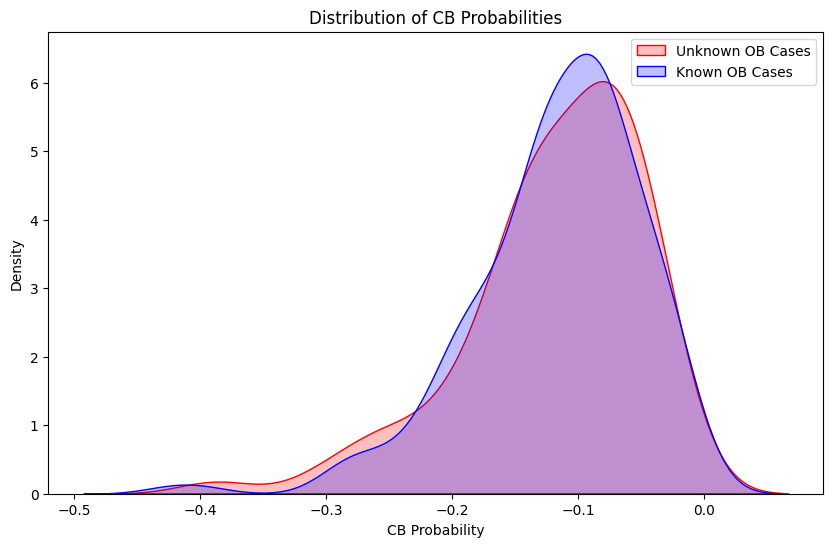

In [429]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract cb_probability for both groups
cb_probs_ob_unknown = unknown_ob_known_cb_probabilities['cb_probability']
cb_probs_ob_cb_known = df_ob_cb_known['cb_answer'].apply(lambda x: x[1])

# Plot the distributions
plt.figure(figsize=(10, 6))
sns.kdeplot(cb_probs_ob_unknown, label="Unknown OB Cases", shade=True, color="red")
sns.kdeplot(cb_probs_ob_cb_known, label="Known OB Cases", shade=True, color="blue")
plt.xlabel("CB Probability")
plt.ylabel("Density")
plt.title("Distribution of CB Probabilities")
plt.legend()
plt.show()

In [430]:
from scipy.stats import ks_2samp, mannwhitneyu

# Kolmogorov-Smirnov Test
ks_stat, ks_pval = ks_2samp(cb_probs_ob_unknown, cb_probs_ob_cb_known)
print(f"KS Test: Statistic = {ks_stat}, p-value = {ks_pval}")

# Mann-Whitney U Test
mw_stat, mw_pval = mannwhitneyu(cb_probs_ob_unknown, cb_probs_ob_cb_known, alternative='two-sided')
print(f"Mann-Whitney U Test: Statistic = {mw_stat}, p-value = {mw_pval}")


KS Test: Statistic = 0.05751905751905752, p-value = 0.9839108000976807
Mann-Whitney U Test: Statistic = 8674.0, p-value = 0.9812364307102078


1. Kolmogorov-Smirnov (KS) Test
Statistic: 0.0781
p-value: 0.7514

Interpretation:
The KS Test is used to compare the distributions of two samples. It measures the maximum difference between the empirical cumulative distribution functions (ECDF) of the two datasets. The null hypothesis for the KS test is that the two samples come from the same distribution.
In this case, the p-value is 0.7514, which is much higher than a typical significance threshold like 0.05. This means that there is no significant difference between the distributions of cb_probs_ob_unknown and cb_probs_ob_cb_known at the 5% significance level.
In simpler terms, the KS test suggests that the two samples (unknown cases and known cases) are likely drawn from the same distribution.


2. Mann-Whitney U Test
Statistic: 9090.0
p-value: 0.4616

Interpretation:
The Mann-Whitney U Test (also known as the Wilcoxon rank-sum test) is a non-parametric test used to compare whether two independent samples come from the same distribution. The null hypothesis is that the two samples have the same distribution, and the alternative is that they differ in some way (the direction is determined by the alternative argument).
The p-value is 0.4616, which again is much higher than 0.05. This suggests that there is no significant difference between the two samples, meaning the distributions of cb_probs_ob_unknown and cb_probs_ob_cb_known are statistically similar.
A higher Mann-Whitney U statistic (9090.0) further supports that the observed values do not significantly differ between the two groups.


Therefore, This means that either when ob is known or unknown --> This doesnt affect the cb answer we got from the llm. (I was hoping maybe there is some differences in confidence but no :)

## Checking Distribution of cb vs ob answers ?

/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/71566090.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ob_probs_ob_cb_known, label="OB", shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/71566090.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cb_probs_ob_cb_known, label="CB", shade=True, color="blue")


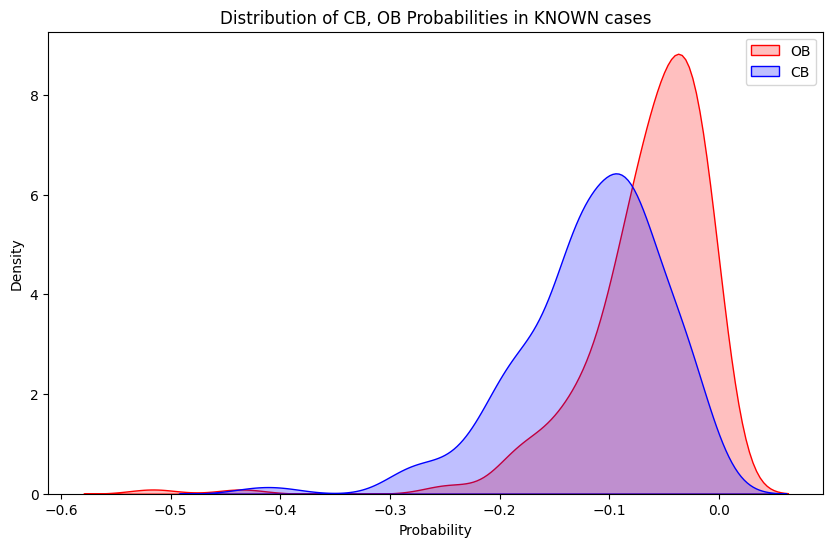

In [431]:
cb_probs_ob_cb_known = df_ob_cb_known['cb_answer'].apply(lambda x: x[1])
ob_probs_ob_cb_known = df_ob_cb_known['ob_answer'].apply(lambda x: x[1])

plt.figure(figsize=(10, 6))
sns.kdeplot(ob_probs_ob_cb_known, label="OB", shade=True, color="red")
sns.kdeplot(cb_probs_ob_cb_known, label="CB", shade=True, color="blue")
plt.xlabel("Probability")
plt.ylabel("Density")
plt.title("Distribution of CB, OB Probabilities in KNOWN cases")
plt.legend()
plt.show()


In [432]:
# Kolmogorov-Smirnov Test
ks_stat, ks_pval = ks_2samp(ob_probs_ob_cb_known, cb_probs_ob_cb_known)
print(f"KS Test: Statistic = {ks_stat}, p-value = {ks_pval}")

# Mann-Whitney U Test
mw_stat, mw_pval = mannwhitneyu(ob_probs_ob_cb_known, cb_probs_ob_cb_known, alternative='two-sided')
print(f"Mann-Whitney U Test: Statistic = {mw_stat}, p-value = {mw_pval}")


KS Test: Statistic = 0.42792792792792794, p-value = 1.2786166619149106e-18
Mann-Whitney U Test: Statistic = 37023.0, p-value = 5.2917736184297825e-20


1. Kolmogorov-Smirnov (KS) Test:
Statistic = 0.2517: The KS statistic measures the maximum difference between the cumulative distribution functions (CDF) of the two groups. A value closer to 0 indicates that the two distributions are more similar, while a value closer to 1 indicates they are more different. Here, 0.2517 suggests a moderate difference between the two distributions.
p-value = 0.000217: The p-value is very small, which suggests that the observed difference between the distributions is statistically significant. In other words, the probability distributions of the closed-book and open-book answers are likely different, and this difference is unlikely to be due to random chance.

2. Mann-Whitney U Test:
Statistic = 13101.0: The Mann-Whitney U test compares the ranks of the two distributions. A higher U statistic suggests that one group tends to have higher ranks (i.e., higher values) than the other. This statistic suggests a noticeable difference in the ranks between the two distributions.
p-value = 3.91e-05: The p-value is extremely small, indicating that the difference between the closed-book and open-book answer probabilities is statistically significant. This suggests that the two sets of probabilities come from different distributions, and it's highly unlikely that the difference is due to random chance.

## Investigating child result

### First investigating cb vs child

In [433]:
# get parent nodes where child is known
parent_nodes_child_known = df[df['child_answer'].apply(lambda x: isinstance(x, list) and not('unknown' in normalize_answer(x[0]) or (x[1] < -10)))]

# Drop rows from the DataFrame where both any answer from cb or child is either 'unknown' or have -100 probability
combined_unknown_indices_from_cb_child = unknown_cases_cb.index.union(unknown_cases_child.index)

valid_indices_to_drop = combined_unknown_indices_from_cb_child[combined_unknown_indices_from_cb_child.isin(parent_nodes_child_known.index)]

df_cb_child_known = parent_nodes_child_known.drop(valid_indices_to_drop)
df_cb_child_known

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,"[Bonnie Bramlett, Leon Russell, and Delaney Br...",False,False,False,True,True,True
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,"[Tokyo, Japan., -0.07738642932345194, Nexon wa...",False,False,False,True,True,True
14,2,What event in 1920 was established by the dire...,"[0, 1]",-0.042069,NaN,What event in 1920 was established by the dire...,"[Salzburg Festival., -0.04248591718358276, The...","[Unknown., -100, Unknown.]","[Salzburg Festival., -0.04248591718358276, The...",4,"[the Salzburg Festival., -0.047863765396011046...",False,True,False,False,False,False
17,2,Chun Woo-hee's notable films include a South K...,"[0, 1]",-0.054772,NaN,Chun Woo-hee's notable films include a South K...,"[The Wailing., -0.04124424865125466, Chun Woo-...","[illnesses., -0.045539554016637444, Chun Woo-h...","[The Wailing., -0.04124424865125466, Chun Woo-...",5,"[and the series of mysterious killings., -0.04...",False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,2,"Church of All Saints, Doddinghurst is part of ...","[0, 1]",-0.060022,NaN,"Church of All Saints, Doddinghurst is part of ...","[the Archbishop of Canterbury., -0.02795690929...","[the Archbishop of Canterbury., -0.01398886103...","[the Archbishop of Canterbury., -0.01398886103...",95,"[The Archbishop of Canterbury., -0.05261515896...",True,True,True,False,False,False
293,3,What ingredient is in both Cosmopolitan and Cu...,"[0, 1, 2]",-0.083395,NaN,What ingredient is in both Cosmopolitan and Cu...,"[lime juice., -0.07879318066112002, The Cosmop...","[Lime., -0.07238001482832428, Lime is an ingre...","[lime., -0.07146499051249203, Lime is common t...",96,"[lime., -0.07146499051249203, Lime is common t...",False,False,True,True,True,False
296,2,The winner of the the London Riders' Champions...,"[0, 1]",-0.010564,NaN,The winner of the the London Riders' Champions...,"[14., -0.03352437528148936, The winner of the ...","[Unknown., -100, Unknown.]","[14., -0.03352437528148936, The winner of the ...",97,"[14., -0.03600321799532445, The winner of the ...",False,True,False,False,False,False
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ...",False,True,False,False,False,False


/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2013906384.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cb_probs_child_cb_known, label="CB", shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2013906384.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(child_probs_child_cb_known, label="Child", shade=True, color="blue")


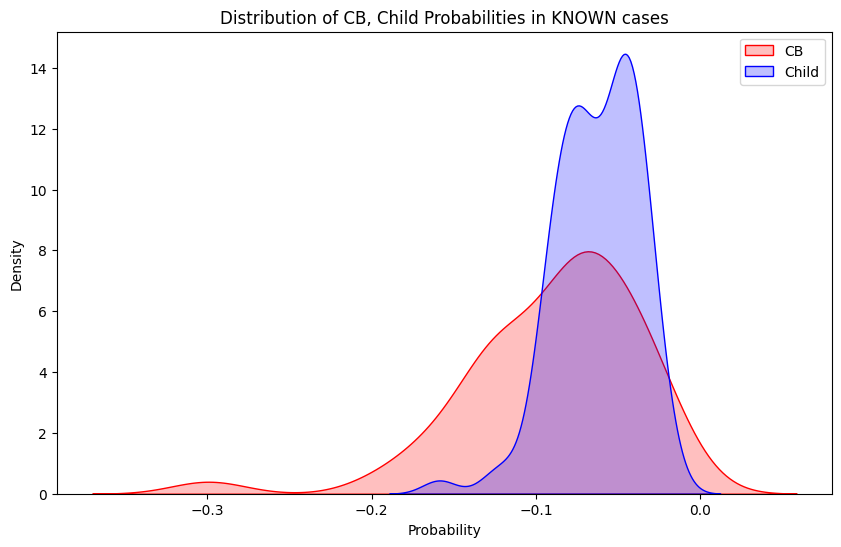

In [434]:
cb_probs_child_cb_known = df_cb_child_known['cb_answer'].apply(lambda x: x[1])
child_probs_child_cb_known = df_cb_child_known['child_answer'].apply(lambda x: x[1])

plt.figure(figsize=(10, 6))
sns.kdeplot(cb_probs_child_cb_known, label="CB", shade=True, color="red")
sns.kdeplot(child_probs_child_cb_known, label="Child", shade=True, color="blue")
plt.xlabel("Probability")
plt.ylabel("Density")
plt.title("Distribution of CB, Child Probabilities in KNOWN cases")
plt.legend()
plt.show()


# Checking the errors ?

In [435]:
raw_data = [json.loads(line.strip()) for line in open('../../../released_data/hotpotqa__v2_test_random_500.jsonl')]
q2dq = json.load(open("../Tree_Generation/question_decompositions.json"))
q2gold = {}
for item in raw_data:
    try:
        question = item['question_text'].strip()
        question = list(q2dq[question].keys())[0]
        # add it later after running tree decomposition
        # question = re.sub(r'\s+', ' ', question)
        gold = item['answers_objects'][0]['spans'][0]
        q_type = item["type"]
        q2gold[question] = (gold, q_type)
    except Exception as e:
        # If question not found in question_decompositions, this means something went wrong in the proccess maybe in json parsing in prev steps of tree generation
        print("Question not found: ", e)

q2gold

Question not found:  'Dorian Gray is the main character of what philosophical novel whose editor feared the story was indecent, and deleted roughly five hundred words before publication?'
Question not found:  'This annual event held in several major cities in Finland is one of many all-night arts festival whose name is given to areas of high latitude in the weeks around what?'
Question not found:  "What other country does the league that Taylor Eric Kemp played in represents the sport's highest level besides the United States?"
Question not found:  'What English-American actor known for his role in "Raiders of the Lost Ark" starred in The Lodger?'
Question not found:  'Which industrialist established a museum in Heckscher Park that features "First Friday" concerts?'
Question not found:  '"Lesbian Request Denied" is the third episode of the first season of a series created by who?'
Question not found:  "Who was the artist that recorded a duet in 1985 for the CBS TV series 'Dallas' with 

{"What is the nationality of the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?": ('American',
  'bridge'),
 'Who wrote the 1970 international hit song Murray Head is most recognized for?': ('Andrew Lloyd Webber and Tim Rice',
  'bridge'),
 'Where was the match held where Chicharito scored goals along with Antonio Valencia and Dimitar Berbatov?': ('Wembley Stadium',
  'bridge'),
 'Where was Nexon who was composed by Adam Gubman located at?': ('South Korea',
  'bridge'),
 'What event in 1920 was established by the director of the play "The Miracle"?': ('Salzburg Festival',
  'bridge'),
 "Chun Woo-hee's notable films include a South Korean horror film about  a policeman who investigates a series of mysterious killings and what?": ('illnesses',
  'bridge'),
 'What team had Tony Roberts replaced by an American sportscaster from Buffalo, New York when he retired?': ('Notre Dame Fighting Irish football',
  'bridge'),
 'Are Catasetum and Origa

In [436]:
parent_nodes = df[df['sons'].apply(lambda x: len(x) != 0)]
child_nodes = df[~df['sons'].apply(lambda x: len(x) != 0)]

parent_nodes

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,"[Bonnie Bramlett, Leon Russell, and Delaney Br...",False,False,False,True,True,True
8,2,Where was the match held where Chicharito scor...,"[0, 1]",-0.107892,NaN,Where was the match held where Chicharito scor...,"[Old Trafford., -0.09128976998533359, The matc...","[Wembley Stadium, London., -0.1312105056753764...","[Old Trafford., -0.09128976998533359, The matc...",2,"[Unknown., -0.12298485157352596, The context s...",False,False,False,True,True,True
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,"[Tokyo, Japan., -0.07738642932345194, Nexon wa...",False,False,False,True,True,True
14,2,What event in 1920 was established by the dire...,"[0, 1]",-0.042069,NaN,What event in 1920 was established by the dire...,"[Salzburg Festival., -0.04248591718358276, The...","[Unknown., -100, Unknown.]","[Salzburg Festival., -0.04248591718358276, The...",4,"[the Salzburg Festival., -0.047863765396011046...",False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,2,"Church of All Saints, Doddinghurst is part of ...","[0, 1]",-0.060022,NaN,"Church of All Saints, Doddinghurst is part of ...","[the Archbishop of Canterbury., -0.02795690929...","[the Archbishop of Canterbury., -0.01398886103...","[the Archbishop of Canterbury., -0.01398886103...",95,"[The Archbishop of Canterbury., -0.05261515896...",True,True,True,False,False,False
293,3,What ingredient is in both Cosmopolitan and Cu...,"[0, 1, 2]",-0.083395,NaN,What ingredient is in both Cosmopolitan and Cu...,"[lime juice., -0.07879318066112002, The Cosmop...","[Lime., -0.07238001482832428, Lime is an ingre...","[lime., -0.07146499051249203, Lime is common t...",96,"[lime., -0.07146499051249203, Lime is common t...",False,False,True,True,True,False
296,2,The winner of the the London Riders' Champions...,"[0, 1]",-0.010564,NaN,The winner of the the London Riders' Champions...,"[14., -0.03352437528148936, The winner of the ...","[Unknown., -100, Unknown.]","[14., -0.03352437528148936, The winner of the ...",97,"[14., -0.03600321799532445, The winner of the ...",False,True,False,False,False,False
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ...",False,True,False,False,False,False


In [437]:
parent_nodes['gold'] = parent_nodes['question_text'].apply(lambda question: q2gold[question][0] if question in q2gold else 'NOT FOUND!!')
parent_nodes['question_type'] = parent_nodes['question_text'].apply(lambda question: q2gold[question][1] if question in q2gold else 'NOT FOUND!!')
parent_nodes['prediction'] = parent_nodes['answer'].apply(lambda x: x[0])
parent_nodes

/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2953401523.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  parent_nodes['gold'] = parent_nodes['question_text'].apply(lambda question: q2gold[question][0] if question in q2gold else 'NOT FOUND!!')
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2953401523.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  parent_nodes['question_type'] = parent_nodes['question_text'].apply(lambda question: q2gold[question][1] if question i

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement,gold,question_type,prediction
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True,American,bridge,United States.
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,"[Bonnie Bramlett, Leon Russell, and Delaney Br...",False,False,False,True,True,True,Andrew Lloyd Webber and Tim Rice,bridge,"The writers of ""Jesus Christ Superstar""."
8,2,Where was the match held where Chicharito scor...,"[0, 1]",-0.107892,NaN,Where was the match held where Chicharito scor...,"[Old Trafford., -0.09128976998533359, The matc...","[Wembley Stadium, London., -0.1312105056753764...","[Old Trafford., -0.09128976998533359, The matc...",2,"[Unknown., -0.12298485157352596, The context s...",False,False,False,True,True,True,Wembley Stadium,bridge,Old Trafford.
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,"[Tokyo, Japan., -0.07738642932345194, Nexon wa...",False,False,False,True,True,True,South Korea,bridge,"Tokyo, Japan."
14,2,What event in 1920 was established by the dire...,"[0, 1]",-0.042069,NaN,What event in 1920 was established by the dire...,"[Salzburg Festival., -0.04248591718358276, The...","[Unknown., -100, Unknown.]","[Salzburg Festival., -0.04248591718358276, The...",4,"[the Salzburg Festival., -0.047863765396011046...",False,True,False,False,False,False,Salzburg Festival,bridge,Salzburg Festival.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,2,"Church of All Saints, Doddinghurst is part of ...","[0, 1]",-0.060022,NaN,"Church of All Saints, Doddinghurst is part of ...","[the Archbishop of Canterbury., -0.02795690929...","[the Archbishop of Canterbury., -0.01398886103...","[the Archbishop of Canterbury., -0.01398886103...",95,"[The Archbishop of Canterbury., -0.05261515896...",True,True,True,False,False,False,Archbishop of Canterbury,bridge,the Archbishop of Canterbury.
293,3,What ingredient is in both Cosmopolitan and Cu...,"[0, 1, 2]",-0.083395,NaN,What ingredient is in both Cosmopolitan and Cu...,"[lime juice., -0.07879318066112002, The Cosmop...","[Lime., -0.07238001482832428, Lime is an ingre...","[lime., -0.07146499051249203, Lime is common t...",96,"[lime., -0.07146499051249203, Lime is common t...",False,False,True,True,True,False,lime,comparison,lime.
296,2,The winner of the the London Riders' Champions...,"[0, 1]",-0.010564,NaN,The winner of the the London Riders' Champions...,"[14., -0.03352437528148936, The winner of the ...","[Unknown., -100, Unknown.]","[14., -0.03352437528148936, The winner of the ...",97,"[14., -0.03600321799532445, The winner of the ...",False,True,False,False,False,False,14,bridge,14.
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ...",False,True,False,False,False,False,128 pages,bridge,128.


In [438]:
# Since here we have parent nodes to be original questions and also subquestions can be parent nodes (multi-hop)
# we already set gold to be NOT FOUND!! for subquestions, so we can filter them out
root_parent_nodes = parent_nodes[parent_nodes['gold'] != 'NOT FOUND!!']
non_root_parent_nodes = parent_nodes[parent_nodes['gold'] == 'NOT FOUND!!']

root_parent_nodes

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement,gold,question_type,prediction
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True,American,bridge,United States.
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,"[Bonnie Bramlett, Leon Russell, and Delaney Br...",False,False,False,True,True,True,Andrew Lloyd Webber and Tim Rice,bridge,"The writers of ""Jesus Christ Superstar""."
8,2,Where was the match held where Chicharito scor...,"[0, 1]",-0.107892,NaN,Where was the match held where Chicharito scor...,"[Old Trafford., -0.09128976998533359, The matc...","[Wembley Stadium, London., -0.1312105056753764...","[Old Trafford., -0.09128976998533359, The matc...",2,"[Unknown., -0.12298485157352596, The context s...",False,False,False,True,True,True,Wembley Stadium,bridge,Old Trafford.
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,"[Tokyo, Japan., -0.07738642932345194, Nexon wa...",False,False,False,True,True,True,South Korea,bridge,"Tokyo, Japan."
14,2,What event in 1920 was established by the dire...,"[0, 1]",-0.042069,NaN,What event in 1920 was established by the dire...,"[Salzburg Festival., -0.04248591718358276, The...","[Unknown., -100, Unknown.]","[Salzburg Festival., -0.04248591718358276, The...",4,"[the Salzburg Festival., -0.047863765396011046...",False,True,False,False,False,False,Salzburg Festival,bridge,Salzburg Festival.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,2,"Church of All Saints, Doddinghurst is part of ...","[0, 1]",-0.060022,NaN,"Church of All Saints, Doddinghurst is part of ...","[the Archbishop of Canterbury., -0.02795690929...","[the Archbishop of Canterbury., -0.01398886103...","[the Archbishop of Canterbury., -0.01398886103...",95,"[The Archbishop of Canterbury., -0.05261515896...",True,True,True,False,False,False,Archbishop of Canterbury,bridge,the Archbishop of Canterbury.
293,3,What ingredient is in both Cosmopolitan and Cu...,"[0, 1, 2]",-0.083395,NaN,What ingredient is in both Cosmopolitan and Cu...,"[lime juice., -0.07879318066112002, The Cosmop...","[Lime., -0.07238001482832428, Lime is an ingre...","[lime., -0.07146499051249203, Lime is common t...",96,"[lime., -0.07146499051249203, Lime is common t...",False,False,True,True,True,False,lime,comparison,lime.
296,2,The winner of the the London Riders' Champions...,"[0, 1]",-0.010564,NaN,The winner of the the London Riders' Champions...,"[14., -0.03352437528148936, The winner of the ...","[Unknown., -100, Unknown.]","[14., -0.03352437528148936, The winner of the ...",97,"[14., -0.03600321799532445, The winner of the ...",False,True,False,False,False,False,14,bridge,14.
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ...",False,True,False,False,False,False,128 pages,bridge,128.


In [439]:
def normalize_answer(s):

    def remove_articles(text):
        return re.sub(r'\b(a|an|the)\b', ' ', text)

    def white_space_fix(text):
        return ' '.join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return ''.join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))


def f1_score(prediction, ground_truth):
    normalized_prediction = normalize_answer(prediction)
    normalized_ground_truth = normalize_answer(ground_truth)

    ZERO_METRIC = (0, 0, 0)

    if normalized_prediction in ['yes', 'no', 'noanswer'] and normalized_prediction != normalized_ground_truth:
        return ZERO_METRIC
    if normalized_ground_truth in ['yes', 'no', 'noanswer'] and normalized_prediction != normalized_ground_truth:
        return ZERO_METRIC

    prediction_tokens = normalized_prediction.split()
    ground_truth_tokens = normalized_ground_truth.split()
    common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
    num_same = sum(common.values())
    if num_same == 0:
        return ZERO_METRIC
    precision = 1.0 * num_same / len(prediction_tokens)
    recall = 1.0 * num_same / len(ground_truth_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1, precision, recall


def exact_match_score(prediction, ground_truth):
    return (normalize_answer(prediction) == normalize_answer(ground_truth))

In [440]:
# Check if the predicted 'answer' matches the 'gold' answer
root_parent_nodes['exact_match'] = root_parent_nodes.apply(lambda x: exact_match_score(x['prediction'], x['gold']), axis=1)

# Calculate the accuracy of predictions
accuracy = root_parent_nodes['exact_match'].mean()
print(f"Overall accuracy of all parent nodes answer: {accuracy * 100:.2f}%")

Overall accuracy of all parent nodes answer: 49.49%


In [441]:
non_root_parent_nodes

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement,gold,question_type,prediction


In [442]:
def get_max_ans(x):
    if x['cb_answer'][1] > x['ob_answer'][1] and x['cb_answer'][1] > x['child_answer'][1]: return "cb"
    if x['ob_answer'][1] > x['cb_answer'][1] and x['ob_answer'][1] > x['child_answer'][1]: return "ob"
    if x['child_answer'][1] > x['ob_answer'][1] and x['child_answer'][1] > x['cb_answer'][1]: return "child"

root_parent_nodes['chosen_answer'] = root_parent_nodes.apply(lambda x: get_max_ans(x), axis=1)
# non_root_parent_nodes['chosen_answer'] = non_root_parent_nodes.apply(lambda x: get_max_ans(x), axis=1)

root_parent_nodes

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,...,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement,gold,question_type,prediction,exact_match,chosen_answer
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,...,False,False,False,True,True,American,bridge,United States.,False,child
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,...,False,False,True,True,True,Andrew Lloyd Webber and Tim Rice,bridge,"The writers of ""Jesus Christ Superstar"".",False,ob
8,2,Where was the match held where Chicharito scor...,"[0, 1]",-0.107892,NaN,Where was the match held where Chicharito scor...,"[Old Trafford., -0.09128976998533359, The matc...","[Wembley Stadium, London., -0.1312105056753764...","[Old Trafford., -0.09128976998533359, The matc...",2,...,False,False,True,True,True,Wembley Stadium,bridge,Old Trafford.,False,cb
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,...,False,False,True,True,True,South Korea,bridge,"Tokyo, Japan.",False,child
14,2,What event in 1920 was established by the dire...,"[0, 1]",-0.042069,NaN,What event in 1920 was established by the dire...,"[Salzburg Festival., -0.04248591718358276, The...","[Unknown., -100, Unknown.]","[Salzburg Festival., -0.04248591718358276, The...",4,...,True,False,False,False,False,Salzburg Festival,bridge,Salzburg Festival.,True,cb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,2,"Church of All Saints, Doddinghurst is part of ...","[0, 1]",-0.060022,NaN,"Church of All Saints, Doddinghurst is part of ...","[the Archbishop of Canterbury., -0.02795690929...","[the Archbishop of Canterbury., -0.01398886103...","[the Archbishop of Canterbury., -0.01398886103...",95,...,True,True,False,False,False,Archbishop of Canterbury,bridge,the Archbishop of Canterbury.,True,ob
293,3,What ingredient is in both Cosmopolitan and Cu...,"[0, 1, 2]",-0.083395,NaN,What ingredient is in both Cosmopolitan and Cu...,"[lime juice., -0.07879318066112002, The Cosmop...","[Lime., -0.07238001482832428, Lime is an ingre...","[lime., -0.07146499051249203, Lime is common t...",96,...,False,True,True,True,False,lime,comparison,lime.,True,child
296,2,The winner of the the London Riders' Champions...,"[0, 1]",-0.010564,NaN,The winner of the the London Riders' Champions...,"[14., -0.03352437528148936, The winner of the ...","[Unknown., -100, Unknown.]","[14., -0.03352437528148936, The winner of the ...",97,...,True,False,False,False,False,14,bridge,14.,True,cb
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,...,True,False,False,False,False,128 pages,bridge,128.,False,cb


In [443]:
# Check the distribution of the 'chosen_answer' (i.e., which source is most frequently the chosen one)
answer_source_distribution = root_parent_nodes['chosen_answer'].value_counts(normalize=True)
print("Distribution of answer sources (cb, ob, child):")
print(answer_source_distribution)

Distribution of answer sources (cb, ob, child):
child    0.414141
ob       0.313131
cb       0.272727
Name: chosen_answer, dtype: float64


In [444]:
# Filter out rows where the answer is incorrect
incorrect_answers = root_parent_nodes[root_parent_nodes['exact_match'] == False]

# Check how often each source is involved in incorrect answers
incorrect_answer_sources = incorrect_answers['chosen_answer'].value_counts()
print("Distribution of incorrect answer sources:")
print(incorrect_answer_sources)

Distribution of incorrect answer sources:
child    21
cb       18
ob       11
Name: chosen_answer, dtype: int64


In [445]:
# Calculate accuracy per question type
accuracy_by_type = root_parent_nodes.groupby('question_type')['exact_match'].mean()
print("Accuracy by question type:")
print(accuracy_by_type)

Accuracy by question type:
question_type
bridge        0.448718
comparison    0.666667
Name: exact_match, dtype: float64


/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/1729913509.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(cb_probs, label="CB Answer", shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/1729913509.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ob_probs, label="OB Answer", shade=True, color="blue")


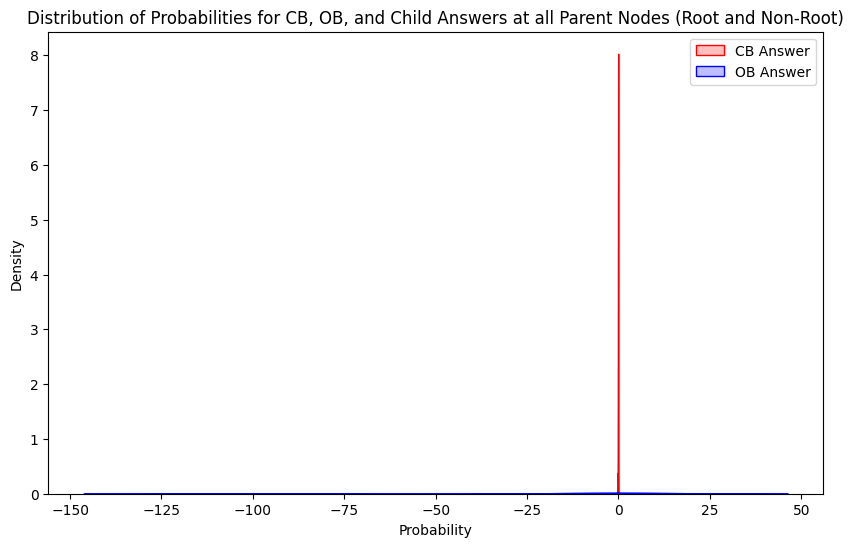

/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/1729913509.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(child_probs, label="Child Answer", shade=True, color="green")


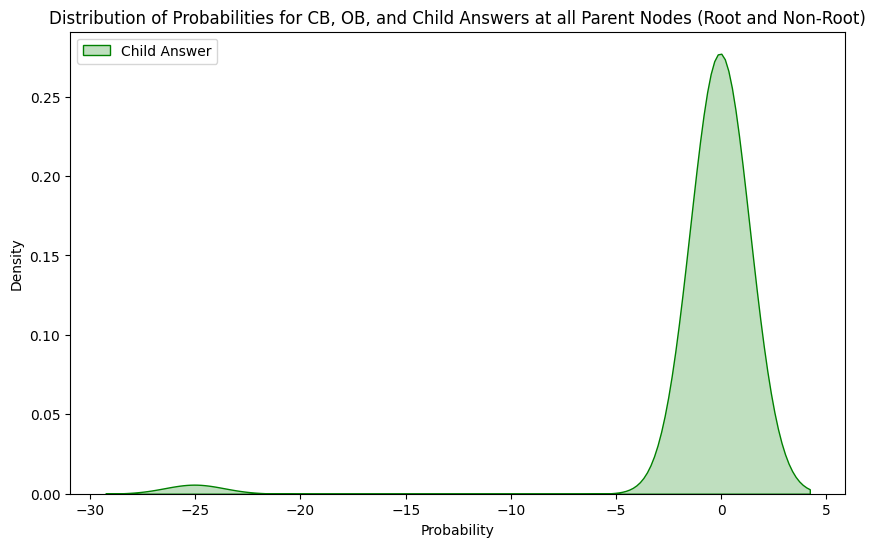

In [446]:
# Visualize the distribution of the probabilities for cb_answer, ob_answer, and child_answer to compare how confident the model is when it makes predictions.

# Assuming cb_answer, ob_answer, and child_answer have probability values
plt.figure(figsize=(10, 6))
sns.kdeplot(cb_probs, label="CB Answer", shade=True, color="red")
sns.kdeplot(ob_probs, label="OB Answer", shade=True, color="blue")
# sns.kdeplot(child_probs, label="Child Answer", shade=True, color="green")
plt.xlabel("Probability")
plt.ylabel("Density")
plt.title("Distribution of Probabilities for CB, OB, and Child Answers at all Parent Nodes (Root and Non-Root)")
plt.legend()
plt.show()


# Assuming cb_answer, ob_answer, and child_answer have probability values
plt.figure(figsize=(10, 6))
# sns.kdeplot(cb_probs, label="CB Answer", shade=True, color="red")
# sns.kdeplot(ob_probs, label="OB Answer", shade=True, color="blue")
sns.kdeplot(child_probs, label="Child Answer", shade=True, color="green")
plt.xlabel("Probability")
plt.ylabel("Density")
plt.title("Distribution of Probabilities for CB, OB, and Child Answers at all Parent Nodes (Root and Non-Root)")
plt.legend()
plt.show()



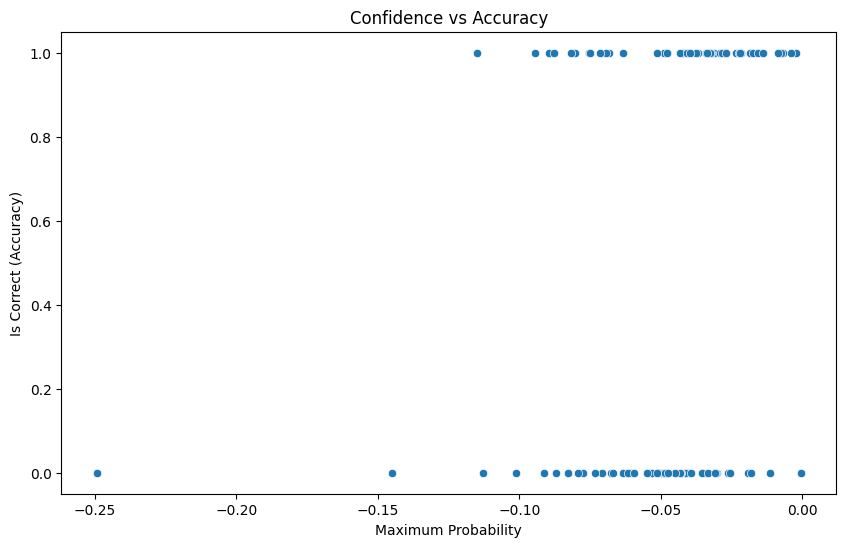

In [447]:
# Add a column for the maximum probability
root_parent_nodes['max_prob'] = root_parent_nodes['answer'].apply(lambda x: x[1])

# Plot confidence vs. accuracy
plt.figure(figsize=(10, 6))
sns.scatterplot(x=root_parent_nodes['max_prob'], y=root_parent_nodes['exact_match'])
plt.xlabel("Maximum Probability")
plt.ylabel("Is Correct (Accuracy)")
plt.title("Confidence vs Accuracy")
plt.show()


### Some analysis based on question type :)

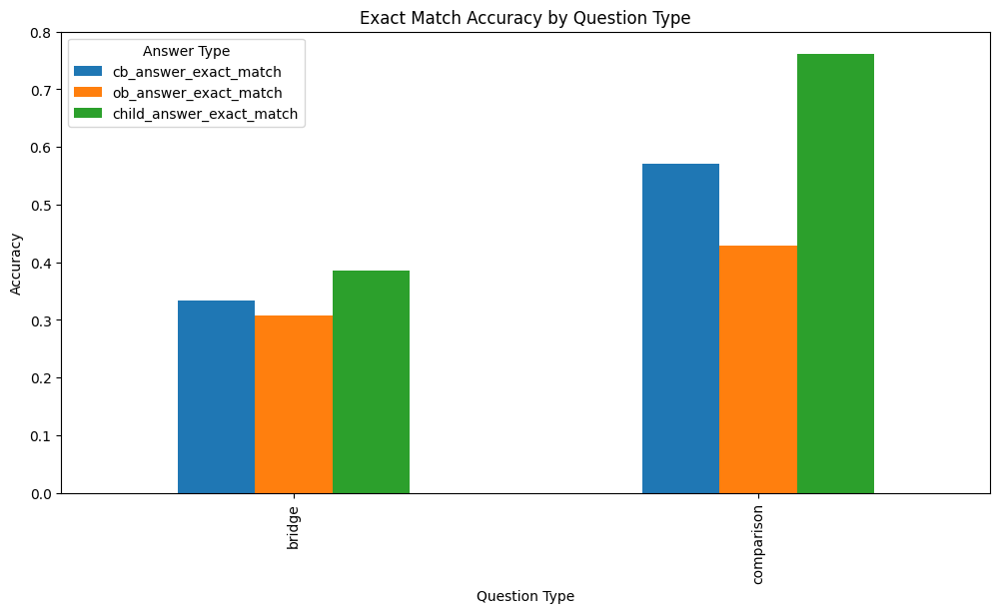

In [448]:
for answer_type in ['cb_answer', 'ob_answer', 'child_answer']:
    root_parent_nodes[f'{answer_type}_exact_match'] = root_parent_nodes.apply(
        lambda x: exact_match_score(x[answer_type][0], x['gold']), axis=1
    )

grouped = root_parent_nodes.groupby('question_type').agg({
    'cb_answer_exact_match': 'mean',
    'ob_answer_exact_match': 'mean',
    'child_answer_exact_match': 'mean',
    'question_text': 'count'  # Count of questions per type
}).rename(columns={'question_text': 'count'})


# Plot exact match accuracy for each answer type by question type
grouped[['cb_answer_exact_match', 'ob_answer_exact_match', 'child_answer_exact_match']].plot(
    kind='bar', figsize=(12, 6), title='Exact Match Accuracy by Question Type'
)
plt.ylabel('Accuracy')
plt.xlabel('Question Type')
plt.legend(title='Answer Type')
plt.show()


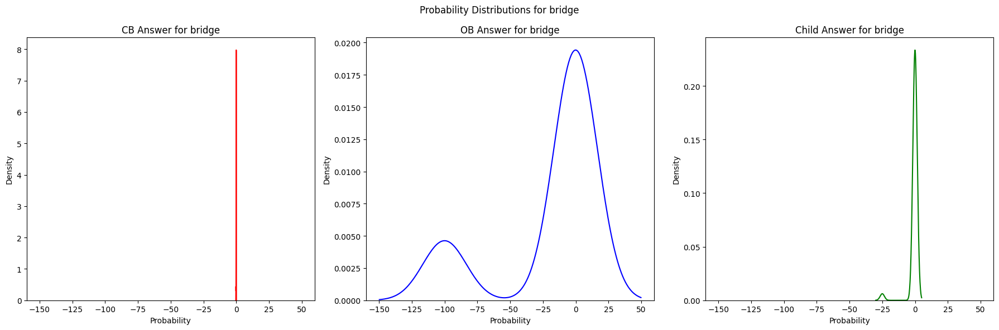

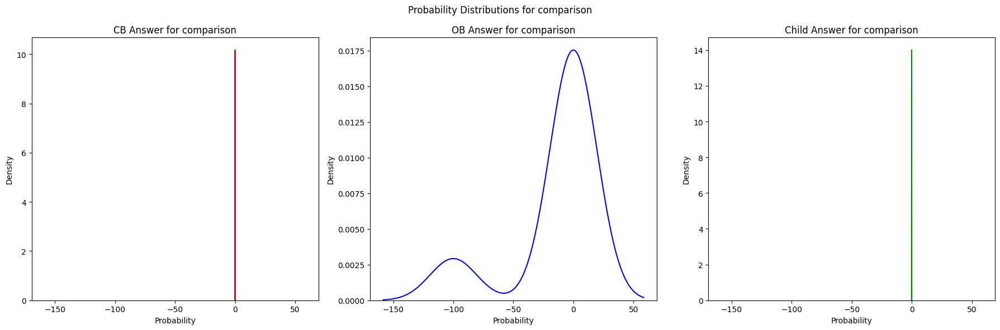

In [449]:
for question_type in root_parent_nodes['question_type'].unique():
    subset = root_parent_nodes[root_parent_nodes['question_type'] == question_type]
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True)
    
    sns.kdeplot(subset['cb_answer'].apply(lambda x: x[1]), ax=axes[0], color='red')
    axes[0].set_title(f'CB Answer for {question_type}')
    axes[0].set_xlabel('Probability')
    axes[0].set_ylabel('Density')
    
    sns.kdeplot(subset['ob_answer'].apply(lambda x: x[1]), ax=axes[1], color='blue')
    axes[1].set_title(f'OB Answer for {question_type}')
    axes[1].set_xlabel('Probability')
    
    sns.kdeplot(subset['child_answer'].apply(lambda x: x[1]), ax=axes[2], color='green')
    axes[2].set_title(f'Child Answer for {question_type}')
    axes[2].set_xlabel('Probability')
    
    plt.suptitle(f'Probability Distributions for {question_type}')
    plt.tight_layout()
    plt.show()


In [450]:
# Identify Question Types with High Discrepancies

grouped['max_gap'] = grouped[['cb_answer_exact_match', 'ob_answer_exact_match', 'child_answer_exact_match']].max(axis=1) - \
                     grouped[['cb_answer_exact_match', 'ob_answer_exact_match', 'child_answer_exact_match']].min(axis=1)

discrepancy_analysis = grouped[grouped['max_gap'] > 0.2].sort_values('max_gap', ascending=False)
discrepancy_analysis


,cb_answer_exact_match,ob_answer_exact_match,child_answer_exact_match,count,max_gap
question_type,,,,,
comparison,0.571429,0.428571,0.761905,21,0.333333


### Do some error Analysis 

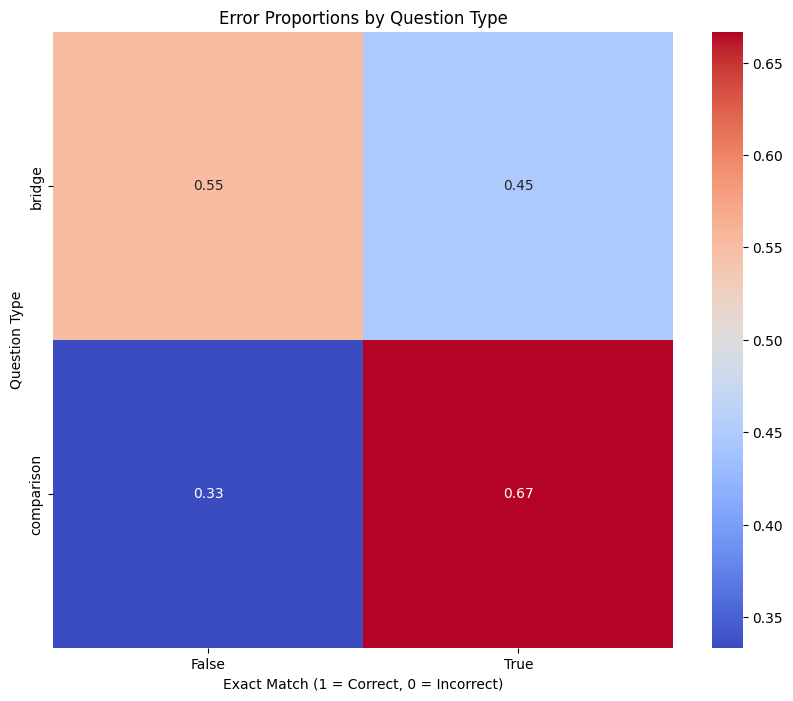

In [451]:
# Create a pivot table for heatmap
heatmap_data = root_parent_nodes.pivot_table(index='question_type', columns='exact_match', aggfunc='size', fill_value=0)

# Normalize to get proportions
heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Error Proportions by Question Type')
plt.xlabel('Exact Match (1 = Correct, 0 = Incorrect)')
plt.ylabel('Question Type')
plt.show()


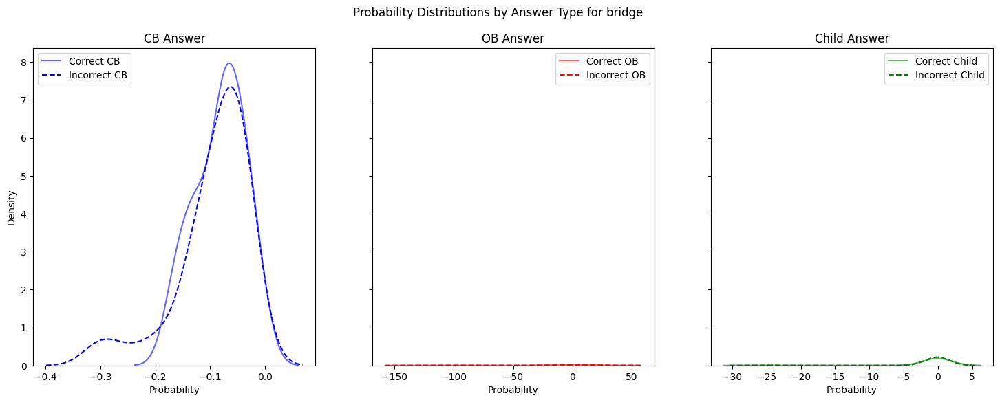

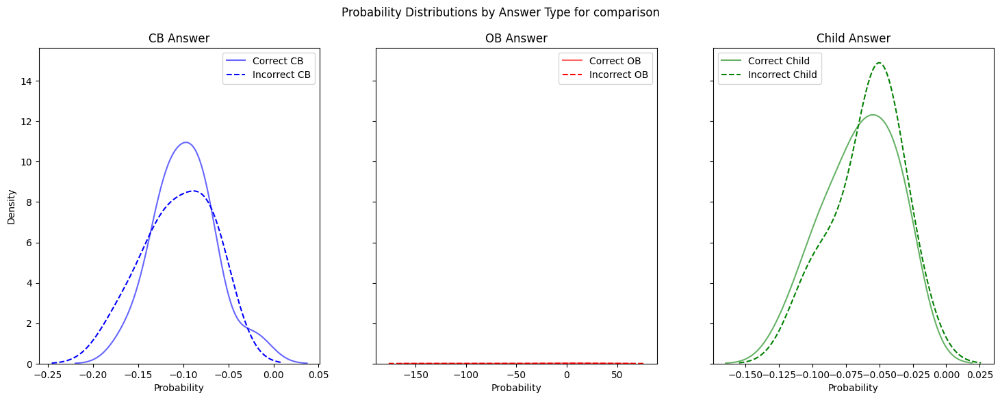

In [452]:
for question_type in root_parent_nodes['question_type'].unique():
    subset = root_parent_nodes[root_parent_nodes['question_type'] == question_type]
    correct = subset[subset['exact_match'] == 1]
    incorrect = subset[subset['exact_match'] == 0]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    sns.kdeplot(correct['cb_answer'].apply(lambda x: x[1]), label='Correct CB', ax=axes[0], color='blue', alpha=0.6)
    sns.kdeplot(incorrect['cb_answer'].apply(lambda x: x[1]), label='Incorrect CB', ax=axes[0], color='blue', linestyle='--')
    axes[0].set_title('CB Answer')
    
    sns.kdeplot(correct['ob_answer'].apply(lambda x: x[1]), label='Correct OB', ax=axes[1], color='red', alpha=0.6)
    sns.kdeplot(incorrect['ob_answer'].apply(lambda x: x[1]), label='Incorrect OB', ax=axes[1], color='red', linestyle='--')
    axes[1].set_title('OB Answer')
    
    sns.kdeplot(correct['child_answer'].apply(lambda x: x[1]), label='Correct Child', ax=axes[2], color='green', alpha=0.6)
    sns.kdeplot(incorrect['child_answer'].apply(lambda x: x[1]), label='Incorrect Child', ax=axes[2], color='green', linestyle='--')
    axes[2].set_title('Child Answer')
    
    for ax in axes:
        ax.set_xlabel('Probability')
        ax.set_ylabel('Density')
        ax.legend()
    
    fig.suptitle(f'Probability Distributions by Answer Type for {question_type}')
    plt.show()


In [453]:
# Filter rows where the answer is incorrect
incorrect_rows = root_parent_nodes[root_parent_nodes['exact_match'] == False]
correct_rows = root_parent_nodes[root_parent_nodes['exact_match'] == True]

print("# of incorrect answers based on exact match: ", incorrect_rows.shape[0], "out of", root_parent_nodes.shape[0])
print("# of correct answers based on exact match: ", correct_rows.shape[0], "out of", root_parent_nodes.shape[0])

# Look at the top 10 most common incorrect answers (both predicted and gold)
incorrect_rows.head(10)

# of incorrect answers based on exact match:  50 out of 99
# of correct answers based on exact match:  49 out of 99


,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,...,ob_child_disagreement,gold,question_type,prediction,exact_match,chosen_answer,max_prob,cb_answer_exact_match,ob_answer_exact_match,child_answer_exact_match
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,...,True,American,bridge,United States.,False,child,-0.053877,True,True,False
5,2,Who wrote the 1970 international hit song Murr...,"[0, 1]",-0.020621,NaN,Who wrote the 1970 international hit song Murr...,"[Rod Argent and Jim Webb., -0.1924499081193128...","[The writers of ""Jesus Christ Superstar""., -0....","[The writers of ""Jesus Christ Superstar""., -0....",1,...,True,Andrew Lloyd Webber and Tim Rice,bridge,"The writers of ""Jesus Christ Superstar"".",False,ob,-0.067596,False,False,False
8,2,Where was the match held where Chicharito scor...,"[0, 1]",-0.107892,NaN,Where was the match held where Chicharito scor...,"[Old Trafford., -0.09128976998533359, The matc...","[Wembley Stadium, London., -0.1312105056753764...","[Old Trafford., -0.09128976998533359, The matc...",2,...,True,Wembley Stadium,bridge,Old Trafford.,False,cb,-0.091290,False,False,False
11,2,Where was Nexon who was composed by Adam Gubma...,"[0, 1]",-0.076654,NaN,Where was Nexon who was composed by Adam Gubma...,"[South Korea and the United States., -0.304458...","[Unknown., -0.11718226637500238, Adam Gubman h...","[Tokyo, Japan., -0.07738642932345194, Nexon wa...",3,...,True,South Korea,bridge,"Tokyo, Japan.",False,child,-0.077386,False,False,False
17,2,Chun Woo-hee's notable films include a South K...,"[0, 1]",-0.054772,NaN,Chun Woo-hee's notable films include a South K...,"[The Wailing., -0.04124424865125466, Chun Woo-...","[illnesses., -0.045539554016637444, Chun Woo-h...","[The Wailing., -0.04124424865125466, Chun Woo-...",5,...,True,illnesses,bridge,The Wailing.,False,cb,-0.041244,False,True,False
20,2,What team had Tony Roberts replaced by an Amer...,"[0, 1]",-0.101678,NaN,What team had Tony Roberts replaced by an Amer...,"[Buffalo Sabres., -0.0669394529032434, The tea...","[Notre Dame., -0.04059096190120833, Tony Rober...","[Notre Dame., -0.04059096190120833, Tony Rober...",6,...,True,Notre Dame Fighting Irish football,bridge,Notre Dame.,False,ob,-0.040591,False,False,True
27,2,Cooperative Living Organization is located in ...,"[0, 1]",-0.032670,NaN,Cooperative Living Organization is located in ...,"[Orange County., -0.04615856560883555, Coopera...","[Alachua County., -0.011228864335706246, Coope...","[Alachua County., -0.011228864335706246, Coope...",8,...,False,Alachua,bridge,Alachua County.,False,ob,-0.011229,False,False,False
33,2,"Which musician played in the band Soulfly, Max...","[0, 1]",-0.030805,NaN,"Which musician played in the band Soulfly, Max...","[Max Cavalera., -0.16917874036267092, Max Cava...","[Max Cavalera., -0.08414815782795435, Max Cava...","[Max Cavalera., -0.0489757898616139, Max Caval...",10,...,False,"Massimiliano Antonio ""Max"" Cavalera",comparison,Max Cavalera.,False,child,-0.048976,False,False,False
43,2,The 1978 NBA World Championship Series had as ...,"[0, 1]",-0.088091,NaN,The 1978 NBA World Championship Series had as ...,"[Bill Walton., -0.05253618511436355, The 1978 ...","[Wes Unseld., -0.07577035313851184, The 1978 N...","[Wes Unseld., -0.03523819922396346, The 1978 N...",13,...,False,Westley Sissel Unseld,bridge,Wes Unseld.,False,child,-0.035238,False,False,False
46,2,What is the name of the actress who has receiv...,"[0, 1]",-0.060323,NaN,What is the name of the actress who has receiv...,"[Susan Blackwell., -0.04621481719202789, The a...","[Laura Osnes., -0.04146258051864727, The actre...","[Laura Osnes., -0.04146258051864727, The actre...",14,...,True,Laura Ann Osnes,bridge,Laura Osnes.,False

### I want to check cases where one of the answers were correct but not chosen as the final answer

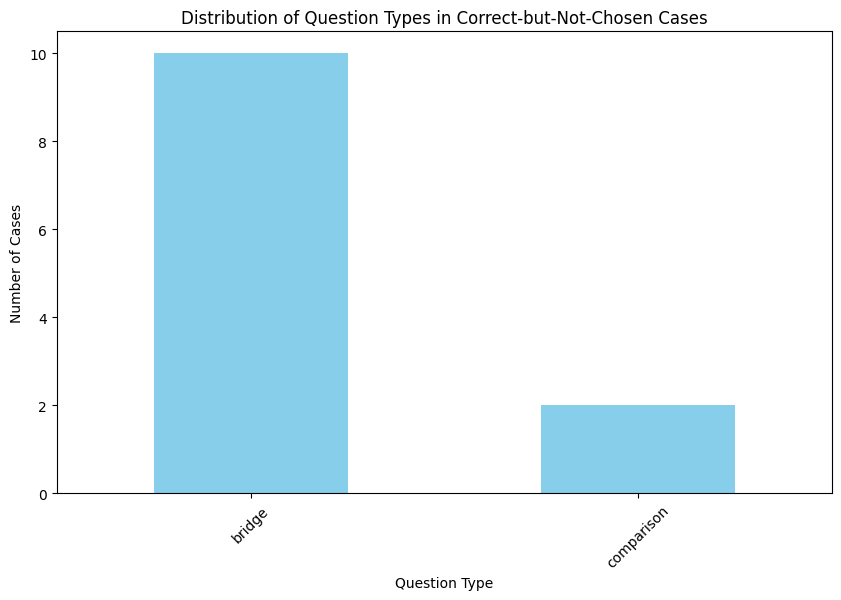

In [454]:
# I want to check cases where one of my answers were correct but not chosen as the final answer
correct_but_not_chosen = root_parent_nodes[((root_parent_nodes['cb_answer_exact_match'] == True) | (root_parent_nodes['ob_answer_exact_match'] == True) | (root_parent_nodes['child_answer_exact_match'] == True)) & (root_parent_nodes['exact_match'] == False)]

# Distribution of question types in correct_but_not_chosen cases
question_type_distribution = correct_but_not_chosen['question_type'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
question_type_distribution.plot(kind='bar', color='skyblue')
plt.title("Distribution of Question Types in Correct-but-Not-Chosen Cases")
plt.xlabel("Question Type")
plt.ylabel("Number of Cases")
plt.xticks(rotation=45)
plt.show()


In [455]:
correct_but_not_chosen['answer_should_have_been'] = root_parent_nodes.apply(lambda x: 'cb' if x['cb_answer_exact_match'] == True else ('ob' if x['ob_answer_exact_match'] == True else 'child'), axis=1)
correct_but_not_chosen['chosen_answer'] = root_parent_nodes['chosen_answer']

correct_but_not_chosen['answer_should_have_been_prob'] = correct_but_not_chosen.apply(lambda x: x[x['answer_should_have_been'] + '_answer'][1], axis=1)
correct_but_not_chosen['cb_prob'] = correct_but_not_chosen['cb_answer'].apply(lambda x: x[1])
correct_but_not_chosen['ob_prob'] = correct_but_not_chosen['ob_answer'].apply(lambda x: x[1])
correct_but_not_chosen['child_prob'] = correct_but_not_chosen['child_answer'].apply(lambda x: x[1])

correct_but_not_chosen[['answer_should_have_been_prob', 'cb_prob', 'ob_prob', 'child_prob', 'answer_should_have_been', 'chosen_answer']]

/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/3613317725.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  correct_but_not_chosen['answer_should_have_been'] = root_parent_nodes.apply(lambda x: 'cb' if x['cb_answer_exact_match'] == True else ('ob' if x['ob_answer_exact_match'] == True else 'child'), axis=1)
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/3613317725.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  correct_but_not_chosen['chosen_answer'] = root_parent_n

,answer_should_have_been_prob,cb_prob,ob_prob,child_prob,answer_should_have_been,chosen_answer
2,-0.065523,-0.065523,-0.128734,-0.053877,cb,child
17,-0.045540,-0.041244,-0.045540,-0.041281,ob,cb
20,-0.079063,-0.066939,-0.040591,-0.079063,child,ob
162,-0.038956,-0.034085,-0.038956,-0.091471,ob,cb
165,-0.050624,-0.043132,-0.128700,-0.050624,child,cb
183,-0.104570,-0.030523,-0.104570,-0.071234,ob,cb
205,-0.112658,-0.081323,-0.112658,-0.073306,ob,child
208,-0.135111,-0.135111,-100.000000,-0.101124,cb,child
229,-0.055787,-0.129231,-0.054985,-0.055787,child,ob
241,-0.103204,-0.066974,-100.000000,-0.103204,child,cb


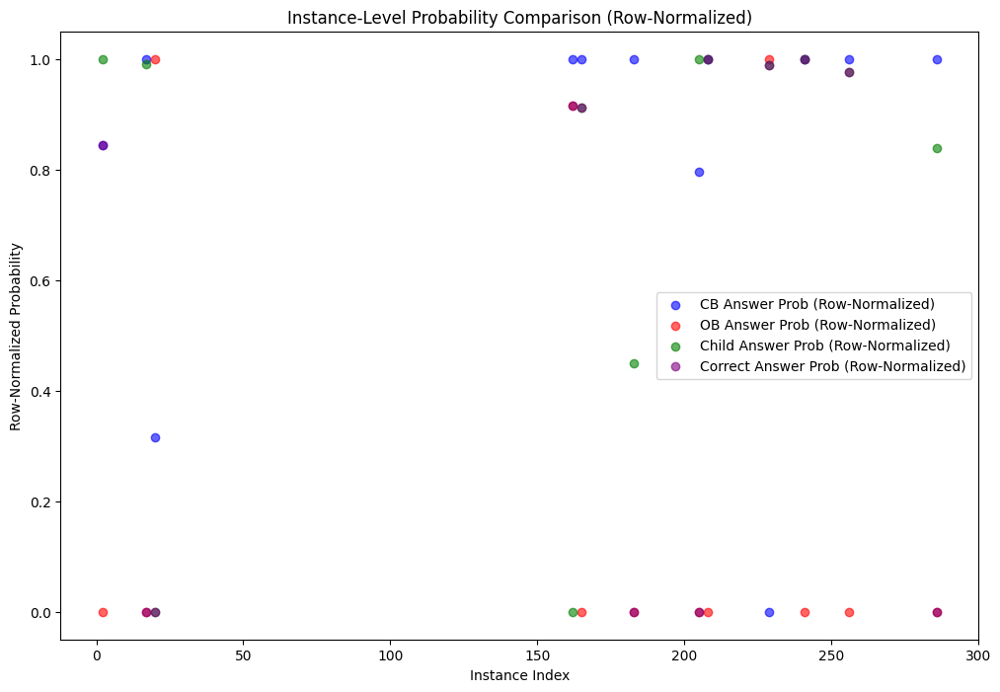

Correct answers when they are the lowest ! 
5 out of 12


In [456]:
# Normalize probabilities to [0, 1] across all instances
prob_cols = ['cb_prob', 'ob_prob', 'child_prob', 'answer_should_have_been_prob']
# Function to normalize a row to [0, 1]
def normalize_row(row):
    return (row - row.min()) / (row.max() - row.min())

# Apply normalization row-wise
normalized_probs_rowwise = correct_but_not_chosen[prob_cols].apply(normalize_row, axis=1)

# Scatter plot of row-wise normalized probabilities
plt.figure(figsize=(12, 8))
plt.scatter(correct_but_not_chosen.index, normalized_probs_rowwise['cb_prob'], label='CB Answer Prob (Row-Normalized)', color='blue', alpha=0.6)
plt.scatter(correct_but_not_chosen.index, normalized_probs_rowwise['ob_prob'], label='OB Answer Prob (Row-Normalized)', color='red', alpha=0.6)
plt.scatter(correct_but_not_chosen.index, normalized_probs_rowwise['child_prob'], label='Child Answer Prob (Row-Normalized)', color='green', alpha=0.6)
plt.scatter(correct_but_not_chosen.index, normalized_probs_rowwise['answer_should_have_been_prob'], label='Correct Answer Prob (Row-Normalized)', color='purple', alpha=0.6)
plt.title("Instance-Level Probability Comparison (Row-Normalized)")
plt.xlabel("Instance Index")
plt.ylabel("Row-Normalized Probability")
plt.legend()
plt.show()

# Correct answers are not always the ones having the highest probability, (even worse most of the times here they are the lowest) !
print("Correct answers when they are the lowest ! ")
print(sum(normalized_probs_rowwise['answer_should_have_been_prob'] == normalized_probs_rowwise.min(axis=1)), "out of", normalized_probs_rowwise.shape[0])

### Different Depths Checking ? 

In [457]:
root_parent_nodes.shape, non_root_parent_nodes.shape

((99, 26), (0, 20))

In [458]:
df

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement
0,0,Who is the foreign born victim of Singapore's ...,[],NaN,2.0,Who is the foreign born victim of Singapore's ...,"[Michael Fay., -0.13084118458345112, The forei...","[Michael P. Fay., -0.05930674595103262, The fo...","[Michael P. Fay., -0.05930674595103262, The fo...",0,NaN,False,False,False,True,False,False
1,1,What is the nationality of <1>?,[],NaN,2.0,What is the nationality of Michael P. Fay.?,"[American., -0.16180472025348555, Michael P. F...","[United States., -0.05192142181429908, The nat...","[United States., -0.05192142181429908, The nat...",0,NaN,False,False,False,True,False,False
2,2,What is the nationality of the foreign born vi...,"[0, 1]",-0.025854,NaN,What is the nationality of the foreign born vi...,"[American., -0.06552316984128555, The foreign ...","[American., -0.12873407361725386, Michael P. F...","[United States., -0.053877172866725116, The co...",0,"[United States., -0.053877172866725116, The co...",True,False,False,False,True,True
3,0,Which 1970 international hit song is Murray He...,[],NaN,2.0,Which 1970 international hit song is Murray He...,"[Jesus Christ Superstar., -0.0934109261805143,...","[Superstar., -0.09109426803993789, Murray Head...","[Superstar., -0.09109426803993789, Murray Head...",1,NaN,False,False,False,True,False,False
4,1,Who wrote <1>?,[],NaN,2.0,Who wrote Superstar.?,"[Bonnie Bramlett, Leon Russell, and Delaney Br...","[Unknown., -0.16777198651664987, The question ...","[Bonnie Bramlett, Leon Russell, and Delaney Br...",1,NaN,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,1,Typically how many pages were in <1>?,[],NaN,2.0,Typically how many pages were in Weird Tales.?,"[128., -0.15241830499214412, Weird Tales was a...","[Unknown., -100, Unknown.]","[128., -0.15241830499214412, Weird Tales was a...",98,NaN,False,False,False,False,False,False
299,2,Typically how many pages were in the fiction m...,"[0, 1]",-0.038029,NaN,Typically how many pages were in the fiction m...,"[128., -0.059305067408800365, The fiction maga...","[Unknown., -100, Unknown.]","[128., -0.059305067408800365, The fiction maga...",98,"[128., -0.07382062009748265, Typically, Weird ...",False,True,False,False,False,False
300,0,What multi-sport event did the OCA announce ma...,[],NaN,2.0,What multi-sport event did the OCA announce ma...,"[Asian Games., -0.060506334834164816, The OCA ...","[Asian Games., -0.05117876257346, The OCA anno...","[Asian Games., -0.05117876257346, The OCA anno...",99,NaN,True,False,False,False,False,False
301,1,In what city did <1> take place?,[],NaN,2.0,In what city did Asian Games. take place?,"[Incheon, South Korea., -0.06844435525578267, ...","[Kathmandu, Nepal., -0.02748896957585874, The ...","[Kathmandu, Nepal., -0.02748896957585874, The ...",99,NaN,False,False,False,True,False,False


In [459]:
import math
# Initialize the parent-to-children dictionary and child-to-parent dictionary
parent_to_children_mapping = {}
child_to_parent_mapping = {}

# Group by `example_index` to process each tree separately
for example_index, group in df.groupby("example_index"):
    inner_index_to_original_index = {}
    
    # First we need to save the inner index to original index mapping df.index of the row
    for index, row in group.iterrows():
        # I want to save original index used by dataframe not index
        inner_index_to_original_index[row["idx"]] = row.name
    
    print(inner_index_to_original_index)

    for index, row in group.iterrows():
        
        # root node is fa is set to nan (float) in the df, so we can use it to find root nodes
        if math.isnan(row["fa"]):
            # This is a root node
            parent_to_children_mapping[inner_index_to_original_index[row["idx"]]] = [inner_index_to_original_index[son] for son in row["sons"]]
            continue
        elif len(row["sons"]) != 0:
            # This is a parent node but non-root
            parent_to_children_mapping[inner_index_to_original_index[row["idx"]]] = [inner_index_to_original_index[son] for son in row["sons"]]
            child_to_parent_mapping[inner_index_to_original_index[row["idx"]]] = inner_index_to_original_index[int(row['fa'])]
        else:
            # This is a child node
            child_to_parent_mapping[inner_index_to_original_index[row["idx"]]] = inner_index_to_original_index[int(row['fa'])]


{0: 0, 1: 1, 2: 2}
{0: 3, 1: 4, 2: 5}
{0: 6, 1: 7, 2: 8}
{0: 9, 1: 10, 2: 11}
{0: 12, 1: 13, 2: 14}
{0: 15, 1: 16, 2: 17}
{0: 18, 1: 19, 2: 20}
{0: 21, 1: 22, 2: 23, 3: 24}
{0: 25, 1: 26, 2: 27}
{0: 28, 1: 29, 2: 30}
{0: 31, 1: 32, 2: 33}
{0: 34, 1: 35, 2: 36}
{0: 37, 1: 38, 2: 39, 3: 40}
{0: 41, 1: 42, 2: 43}
{0: 44, 1: 45, 2: 46}
{0: 47, 1: 48, 2: 49}
{0: 50, 1: 51, 2: 52}
{0: 53, 1: 54, 2: 55}
{0: 56, 1: 57, 2: 58}
{0: 59, 1: 60, 2: 61}
{0: 62, 1: 63, 2: 64}
{0: 65, 1: 66, 2: 67}
{0: 68, 1: 69, 2: 70}
{0: 71, 1: 72, 2: 73}
{0: 74, 1: 75, 2: 76}
{0: 77, 1: 78, 2: 79}
{0: 80, 1: 81, 2: 82}
{0: 83, 1: 84, 2: 85}
{0: 86, 1: 87, 2: 88}
{0: 89, 1: 90, 2: 91}
{0: 92, 1: 93, 2: 94}
{0: 95, 1: 96, 2: 97}
{0: 98, 1: 99, 2: 100}
{0: 101, 1: 102, 2: 103}
{0: 104, 1: 105, 2: 106, 3: 107}
{0: 108, 1: 109, 2: 110}
{0: 111, 1: 112, 2: 113}
{0: 114, 1: 115, 2: 116}
{0: 117, 1: 118, 2: 119}
{0: 120, 1: 121}
{0: 122, 1: 123, 2: 124}
{0: 125, 1: 126, 2: 127}
{0: 128, 1: 129, 2: 130}
{0: 131, 1: 132, 2:

In [460]:
# Since we set question_type for non_root nodes with NOT FOUND!! we will set them now same as their parent nodes to do better analysis
# use child to parent mapping to get the parent question type
non_root_parent_nodes['question_type'] = non_root_parent_nodes.index.map(lambda x: root_parent_nodes.loc[child_to_parent_mapping[x]]['question_type'])
non_root_parent_nodes

,idx,question_text,sons,qd_logprob,fa,question,cb_answer,ob_answer,answer,example_index,child_answer,cb_ob_agreement,cb_child_agreement,ob_child_agreement,cb_ob_disagreement,cb_child_disagreement,ob_child_disagreement,gold,question_type,prediction


/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/4029574624.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


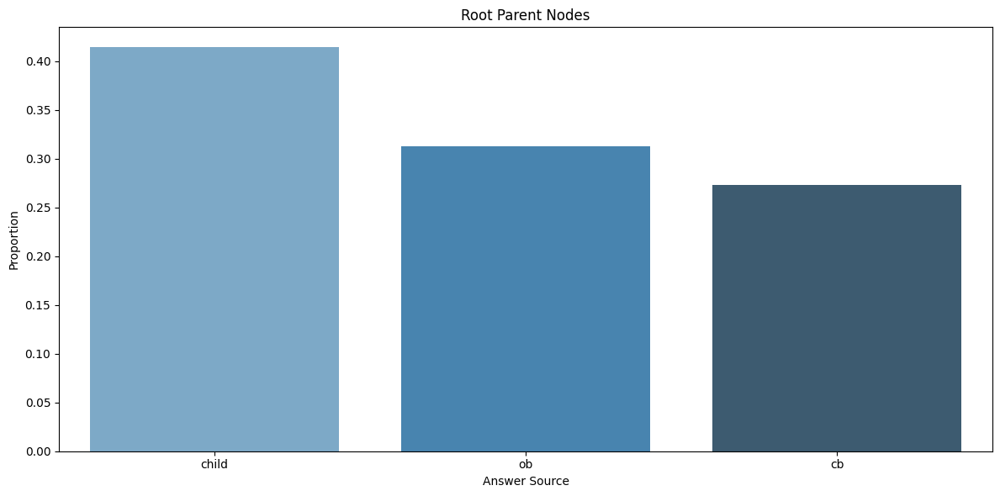

In [461]:
# Distribution for root parent nodes
root_answer_source_distribution = root_parent_nodes['chosen_answer'].value_counts(normalize=True)

# Distribution for non-root parent nodes
# non_root_answer_source_distribution = non_root_parent_nodes['chosen_answer'].value_counts(normalize=True)

# Create subplots
fig, axes = plt.subplots(1, 1, figsize=(12, 6), sharey=True)
# fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Plot for root parent nodes
sns.barplot(
    x=root_answer_source_distribution.index,
    y=root_answer_source_distribution.values,
    ax=axes,
    palette="Blues_d"
)
axes.set_title("Root Parent Nodes")
axes.set_xlabel("Answer Source")
axes.set_ylabel("Proportion")

# Plot for non-root parent nodes
# sns.barplot(
#     x=non_root_answer_source_distribution.index,
#     y=non_root_answer_source_distribution.values,
#     ax=axes[1],
#     palette="Greens_d"
# )
# axes[1].set_title("Non-Root Parent Nodes")
# axes[1].set_xlabel("Answer Source")

# Adjust layout
plt.tight_layout()
plt.show()


/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2344725834.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(root_parent_nodes['cb_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[0], shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2344725834.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(root_parent_nodes['ob_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[1], shade=True, color="red")
/var/folders/0p/97g04f6j0xbd6n9kfwf97fs00000gn/T/ipykernel_50314/2344725834.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(root_parent_nodes['chil

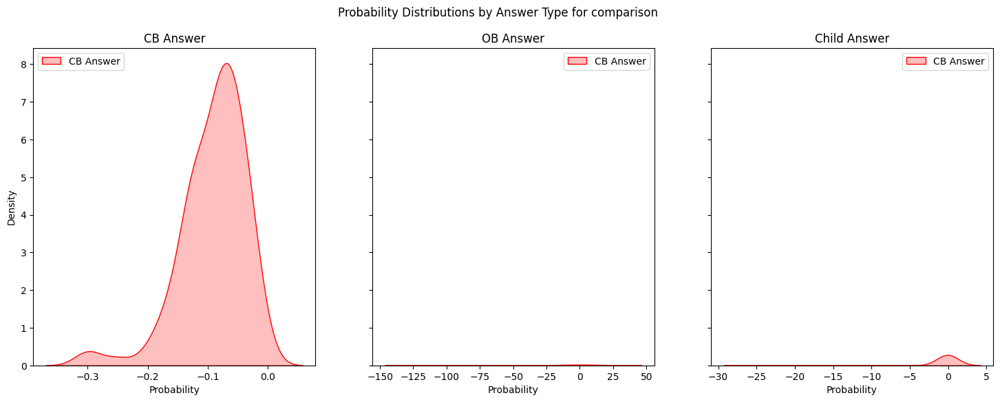

In [462]:
# Visualize the distribution of the probabilities for cb_answer, ob_answer, and child_answer to compare how confident the model is when it makes predictions.
# On all types of questions

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
sns.kdeplot(root_parent_nodes['cb_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[0], shade=True, color="red")
# sns.kdeplot(non_root_parent_nodes['cb_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[0], shade=True, color="blue")
axes[0].set_title('CB Answer')

sns.kdeplot(root_parent_nodes['ob_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[1], shade=True, color="red")
# sns.kdeplot(non_root_parent_nodes['ob_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[1], shade=True, color="blue")
axes[1].set_title('OB Answer')

sns.kdeplot(root_parent_nodes['child_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[2], shade=True, color="red")
# sns.kdeplot(non_root_parent_nodes['child_answer'].apply(lambda x: x[1]), label="CB Answer", ax=axes[2], shade=True, color="blue")
axes[2].set_title('Child Answer')

for ax in axes:
    ax.set_xlabel('Probability')
    ax.set_ylabel('Density')
    ax.legend()

fig.suptitle(f'Probability Distributions by Answer Type for {question_type}')
plt.show()

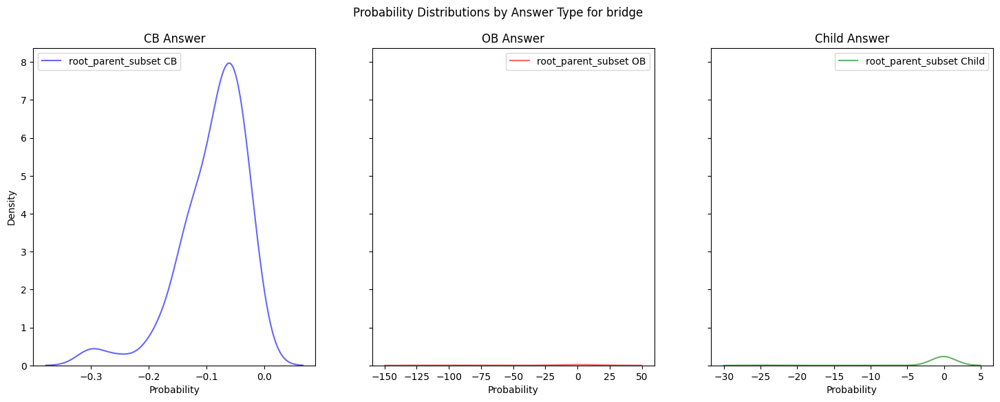

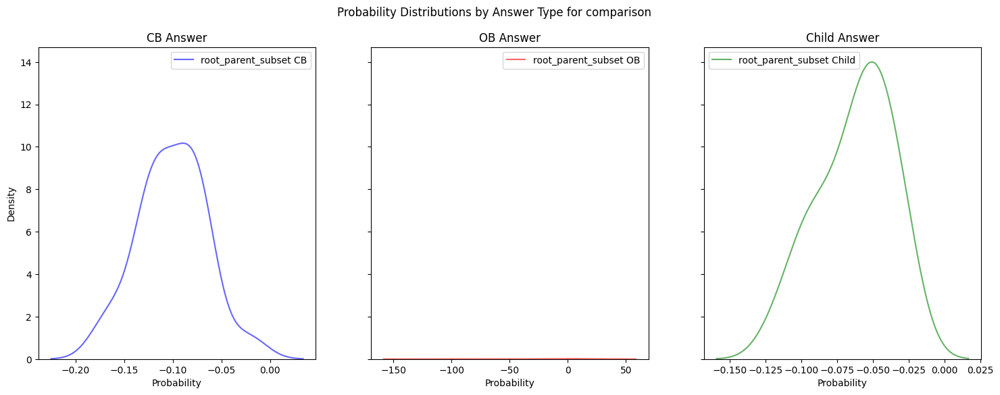

In [463]:
# Visualize the distribution of the probabilities for cb_answer, ob_answer, and child_answer to compare how confident the model is when it makes predictions.
# Grouped by question type

for question_type in root_parent_nodes['question_type'].unique():
    root_parent_subset = root_parent_nodes[root_parent_nodes['question_type'] == question_type]
    # non_root_parent_subset = non_root_parent_nodes[non_root_parent_nodes['question_type'] == question_type]
    # if (non_root_parent_subset.shape[0] == 0):
        # print(f"No non-root parent nodes found for question type: {question_type}")
        # continue
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    sns.kdeplot(root_parent_subset['cb_answer'].apply(lambda x: x[1]), label='root_parent_subset CB', ax=axes[0], color='blue', alpha=0.6)
    # sns.kdeplot(non_root_parent_subset['cb_answer'].apply(lambda x: x[1]), label='non_root_parent_subset CB', ax=axes[0], color='blue', linestyle='--')
    axes[0].set_title('CB Answer')
    
    sns.kdeplot(root_parent_subset['ob_answer'].apply(lambda x: x[1]), label='root_parent_subset OB', ax=axes[1], color='red', alpha=0.6)
    # sns.kdeplot(non_root_parent_subset['ob_answer'].apply(lambda x: x[1]), label='non_root_parent_subset OB', ax=axes[1], color='red', linestyle='--')
    axes[1].set_title('OB Answer')
    
    sns.kdeplot(root_parent_subset['child_answer'].apply(lambda x: x[1]), label='root_parent_subset Child', ax=axes[2], color='green', alpha=0.6)
    # sns.kdeplot(non_root_parent_subset['child_answer'].apply(lambda x: x[1]), label='non_root_parent_subset Child', ax=axes[2], color='green', linestyle='--')
    axes[2].set_title('Child Answer')
    
    for ax in axes:
        ax.set_xlabel('Probability')
        ax.set_ylabel('Density')
        ax.legend()
    
    fig.suptitle(f'Probability Distributions by Answer Type for {question_type}')
    plt.show()


# Investigating errors Semantically ?!

In [464]:
# I want now to add all the path to form the tree structure
# Paths are in the form of : [['parent', 'child1'], ['parent', 'child2'], ['child1', 'subchild1'], ['child1', 'subchild2'], ['child2', 'subchild3'], ['child2', 'subchild4']]


def construct_tree_edges(parent, paths):
    if parent not in parent_to_children_mapping:
        return
    for child in parent_to_children_mapping[parent]:
        paths.append([parent, child])
        construct_tree_edges(child, paths)

# Get the text of the paths
def nodes_to_data(paths):
    paths_text =[]
    for path in paths:
        path_text = []
        for node in path:
            text = df.loc[node, 'question_text'] + f"\nOB: {df.loc[node, 'ob_answer'][0], df.loc[node, 'ob_answer'][1]},\nCB: {df.loc[node, 'cb_answer'][0], df.loc[node, 'cb_answer'][1]}"
            if isinstance(df.loc[node, 'child_answer'], list):
                text += f",\nChild: {df.loc[node, 'child_answer'][0], df.loc[node, 'child_answer'][1]}"
            
            text += f",\nAnswer: {df.loc[node, 'answer'][0], df.loc[node, 'answer'][1]}"

            # check if this node is in root_parent_nodes
            if node in root_parent_nodes.index:
                text += f"\nGold: {root_parent_nodes.loc[node, 'gold']}"
            path_text.append(text)
        paths_text.append(path_text)
    return paths_text

def get_tree_from_parent(parent):
    paths = []
    construct_tree_edges(parent, paths)
    return nodes_to_data(paths)

def create_graph_to_problem(parent_index):
    paths = get_tree_from_parent(parent_index)
    print(paths)
    G = nx.DiGraph()
    for path in paths:
        nx.add_path(G, path)

    rcParams['figure.figsize'] = 20, 10
    pos=graphviz_layout(G, prog='dot')
    nx.draw(G, pos=pos,
            font_size=9,
            font_color='black',
            node_color='lightblue',
            node_shape='s',
            node_size=15000,
            with_labels=True, 
            arrows=True)
    plt.show()


In [465]:
wrong_answers_indices = root_parent_nodes[root_parent_nodes['exact_match'] == False].index
correct_answers_indices = root_parent_nodes[root_parent_nodes['exact_match'] == True].index
wrong_answers_indices.size, correct_answers_indices.size

(50, 49)

### Analyzing Wrongly answered examples

[["What is the nationality of the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?\nOB: ('American.', -0.12873407361725386),\nCB: ('American.', -0.06552316984128555),\nChild: ('United States.', -0.053877172866725116),\nAnswer: ('United States.', -0.053877172866725116)\nGold: American", "Who is the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?\nOB: ('Michael P. Fay.', -0.05930674595103262),\nCB: ('Michael Fay.', -0.13084118458345112),\nAnswer: ('Michael P. Fay.', -0.05930674595103262)"], ["What is the nationality of the foreign born victim of Singapore's caning punishment before Oliver Fricker experienced the same?\nOB: ('American.', -0.12873407361725386),\nCB: ('American.', -0.06552316984128555),\nChild: ('United States.', -0.053877172866725116),\nAnswer: ('United States.', -0.053877172866725116)\nGold: American", "What is the nationality of <1>?\nOB: ('United States.', -0.051921421814299

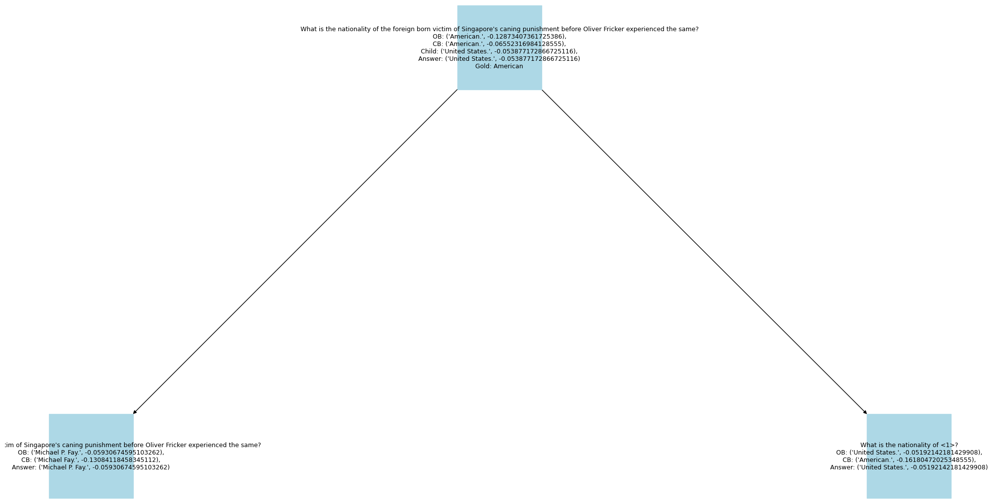

[['Who wrote the 1970 international hit song Murray Head is most recognized for?\nOB: (\'The writers of "Jesus Christ Superstar".\', -0.06759633337866629),\nCB: (\'Rod Argent and Jim Webb.\', -0.19244990811931284),\nChild: (\'Bonnie Bramlett, Leon Russell, and Delaney Bramlett.\', -0.07002884098368),\nAnswer: (\'The writers of "Jesus Christ Superstar".\', -0.06759633337866629)\nGold: Andrew Lloyd Webber and Tim Rice', "Which 1970 international hit song is Murray Head most recognized for?\nOB: ('Superstar.', -0.09109426803993789),\nCB: ('Jesus Christ Superstar.', -0.0934109261805143),\nAnswer: ('Superstar.', -0.09109426803993789)"], ['Who wrote the 1970 international hit song Murray Head is most recognized for?\nOB: (\'The writers of "Jesus Christ Superstar".\', -0.06759633337866629),\nCB: (\'Rod Argent and Jim Webb.\', -0.19244990811931284),\nChild: (\'Bonnie Bramlett, Leon Russell, and Delaney Bramlett.\', -0.07002884098368),\nAnswer: (\'The writers of "Jesus Christ Superstar".\', -0.

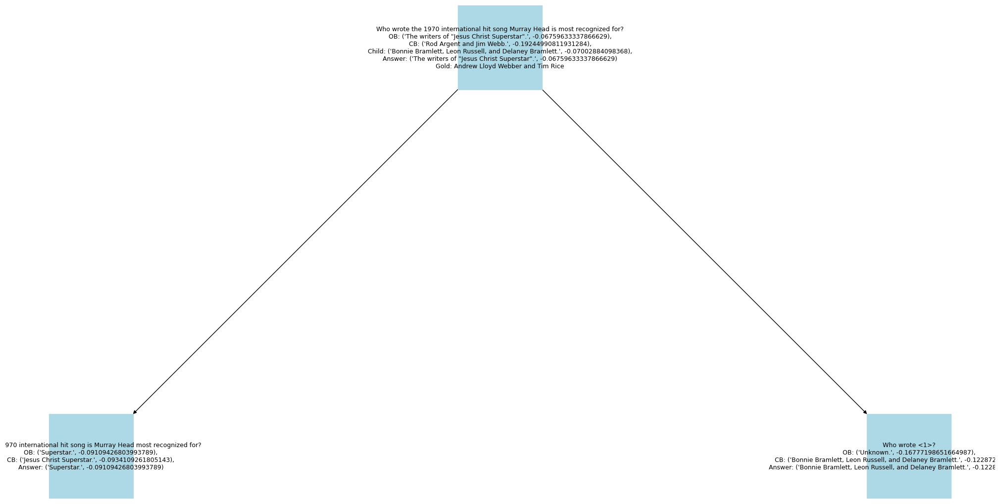

[["Where was the match held where Chicharito scored goals along with Antonio Valencia and Dimitar Berbatov?\nOB: ('Wembley Stadium, London.', -0.1312105056753764),\nCB: ('Old Trafford.', -0.09128976998533359),\nChild: ('Unknown.', -0.12298485157352596),\nAnswer: ('Old Trafford.', -0.09128976998533359)\nGold: Wembley Stadium", "Where was the match held where Chicharito scored goals?\nOB: ('Unknown.', -100),\nCB: ('Rustenburg, South Africa.', -0.15693567048785995),\nAnswer: ('Rustenburg, South Africa.', -0.15693567048785995)"], ["Where was the match held where Chicharito scored goals along with Antonio Valencia and Dimitar Berbatov?\nOB: ('Wembley Stadium, London.', -0.1312105056753764),\nCB: ('Old Trafford.', -0.09128976998533359),\nChild: ('Unknown.', -0.12298485157352596),\nAnswer: ('Old Trafford.', -0.09128976998533359)\nGold: Wembley Stadium", "Who scored goals along with Chicharito and Antonio Valencia in <1>?\nOB: ('Unknown.', -100),\nCB: ('Miroslav Klose.', -0.1301065581912234),\

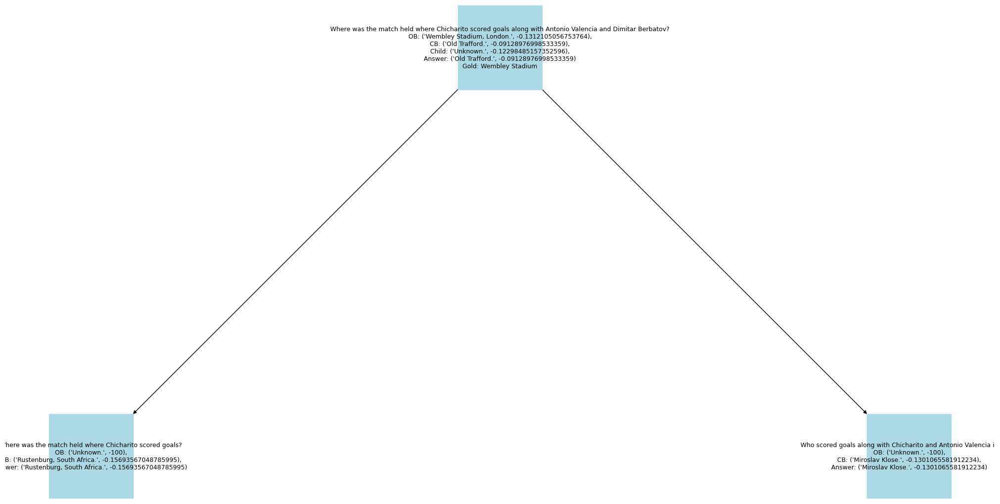

[["Where was Nexon who was composed by Adam Gubman located at?\nOB: ('Unknown.', -0.11718226637500238),\nCB: ('South Korea and the United States.', -0.3044580715139411),\nChild: ('Tokyo, Japan.', -0.07738642932345194),\nAnswer: ('Tokyo, Japan.', -0.07738642932345194)\nGold: South Korea", "Who is Nexon who was composed by Adam Gubman?\nOB: ('Unknown.', -100),\nCB: ('Nexon.', -0.13060976934181265),\nAnswer: ('Nexon.', -0.13060976934181265)"], ["Where was Nexon who was composed by Adam Gubman located at?\nOB: ('Unknown.', -0.11718226637500238),\nCB: ('South Korea and the United States.', -0.3044580715139411),\nChild: ('Tokyo, Japan.', -0.07738642932345194),\nAnswer: ('Tokyo, Japan.', -0.07738642932345194)\nGold: South Korea", "Where was <1> located at?\nOB: ('Tokyo, Japan.', -0.028398680881016852),\nCB: ('Seoul, South Korea.', -0.08069391889115217),\nAnswer: ('Tokyo, Japan.', -0.028398680881016852)"]]


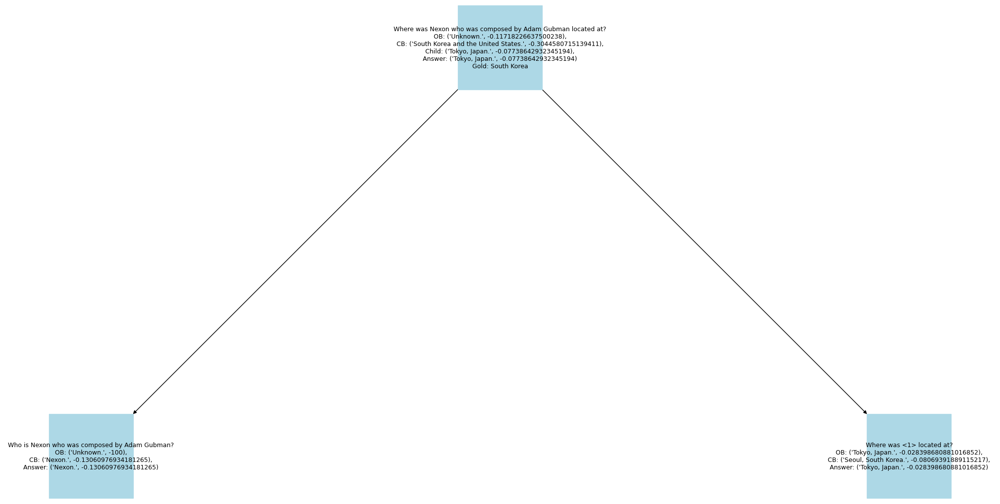

[["Chun Woo-hee's notable films include a South Korean horror film about  a policeman who investigates a series of mysterious killings and what?\nOB: ('illnesses.', -0.045539554016637444),\nCB: ('The Wailing.', -0.04124424865125466),\nChild: ('and the series of mysterious killings.', -0.04128091867799914),\nAnswer: ('The Wailing.', -0.04124424865125466)\nGold: illnesses", 'What are Chun Woo-hee\'s notable films?\nOB: (\'"The Beauty Inside" (2015), "Love, Lies" (2016) and "The Wailing" (2016).\', -0.023923316615454864),\nCB: (\'Han Gong-ju, The Wailing, and Vampire Cop Ricky.\', -0.1302625434795231),\nAnswer: (\'"The Beauty Inside" (2015), "Love, Lies" (2016) and "The Wailing" (2016).\', -0.023923316615454864)'], ["Chun Woo-hee's notable films include a South Korean horror film about  a policeman who investigates a series of mysterious killings and what?\nOB: ('illnesses.', -0.045539554016637444),\nCB: ('The Wailing.', -0.04124424865125466),\nChild: ('and the series of mysterious killin

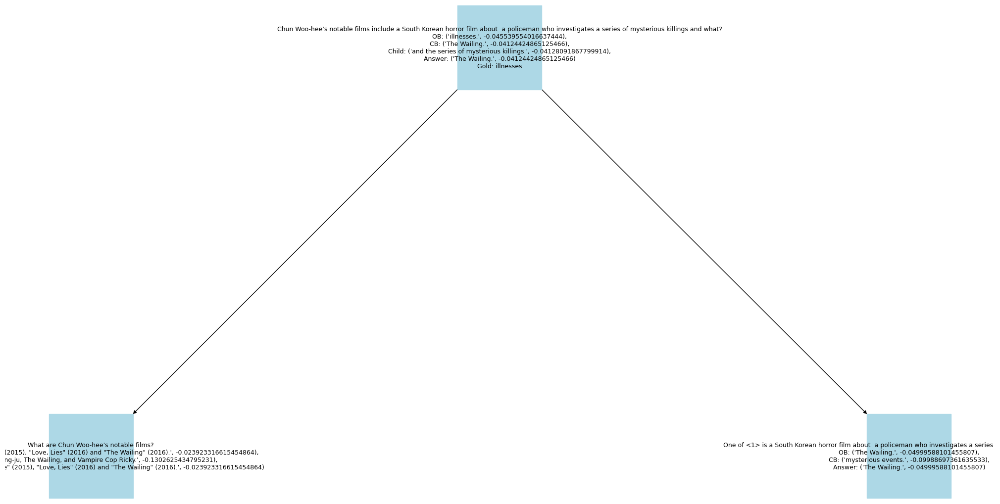

[["What team had Tony Roberts replaced by an American sportscaster from Buffalo, New York when he retired?\nOB: ('Notre Dame.', -0.04059096190120833),\nCB: ('Buffalo Sabres.', -0.0669394529032434),\nChild: ('Notre Dame Fighting Irish football.', -0.07906347326622026),\nAnswer: ('Notre Dame.', -0.04059096190120833)\nGold: Notre Dame Fighting Irish football", "Who replaced Tony Roberts when he retired?\nOB: ('Don Criqui.', -0.06587989336446501),\nCB: ('Stephen Macht.', -0.12433522947291069),\nAnswer: ('Don Criqui.', -0.06587989336446501)"], ["What team had Tony Roberts replaced by an American sportscaster from Buffalo, New York when he retired?\nOB: ('Notre Dame.', -0.04059096190120833),\nCB: ('Buffalo Sabres.', -0.0669394529032434),\nChild: ('Notre Dame Fighting Irish football.', -0.07906347326622026),\nAnswer: ('Notre Dame.', -0.04059096190120833)\nGold: Notre Dame Fighting Irish football", "What team did <1> work for?\nOB: ('Notre Dame Fighting Irish football.', -0.05840889295413847),

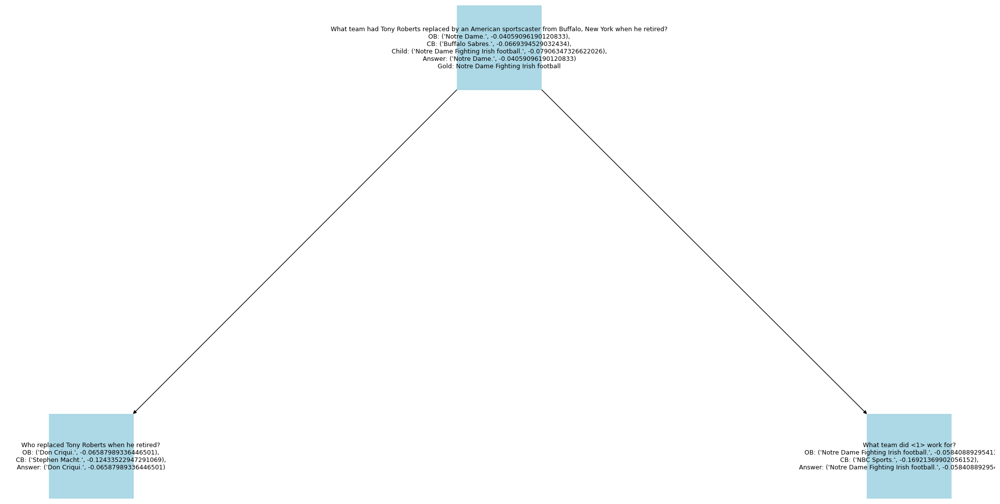

[["Cooperative Living Organization is located in a city that is the county seat of what county in Florida?\nOB: ('Alachua County.', -0.011228864335706246),\nCB: ('Orange County.', -0.04615856560883555),\nChild: ('Alachua County.', -0.034050396890238005),\nAnswer: ('Alachua County.', -0.011228864335706246)\nGold: Alachua", "In which city is Cooperative Living Organization located?\nOB: ('Gainesville, Florida.', -0.06826489206945416),\nCB: ('Ann Arbor, Michigan.', -0.1359910727002567),\nAnswer: ('Gainesville, Florida.', -0.06826489206945416)"], ["Cooperative Living Organization is located in a city that is the county seat of what county in Florida?\nOB: ('Alachua County.', -0.011228864335706246),\nCB: ('Orange County.', -0.04615856560883555),\nChild: ('Alachua County.', -0.034050396890238005),\nAnswer: ('Alachua County.', -0.011228864335706246)\nGold: Alachua", "<1> is the county seat of what county in Florida?\nOB: ('Alachua County, Florida.', -0.08802315074165529),\nCB: ('Alachua Count

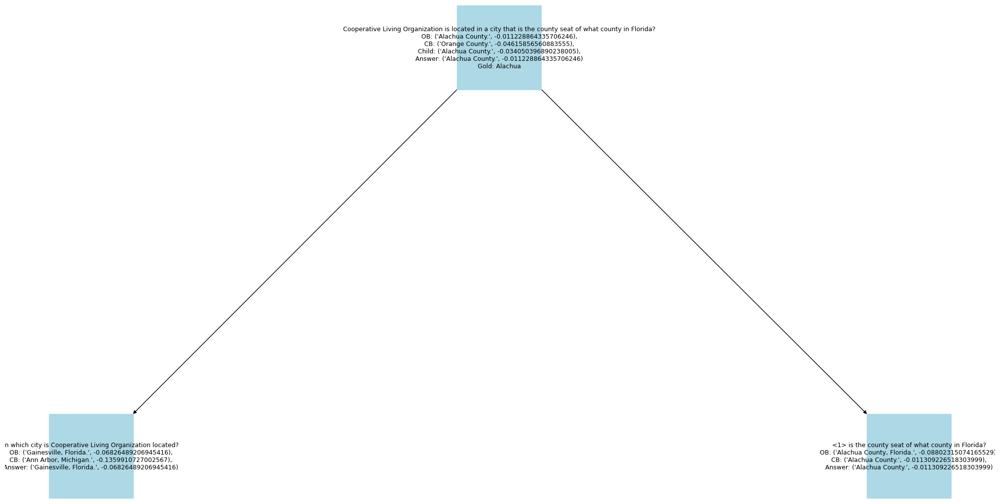

[['Which musician played in the band Soulfly, Max Cavalera or Billy Idol?\nOB: (\'Max Cavalera.\', -0.08414815782795435),\nCB: (\'Max Cavalera.\', -0.16917874036267092),\nChild: (\'Max Cavalera.\', -0.0489757898616139),\nAnswer: (\'Max Cavalera.\', -0.0489757898616139)\nGold: Massimiliano Antonio "Max" Cavalera', "Which musician played in the band Soulfly?\nOB: ('Max Cavalera.', -0.0056425333178990915),\nCB: ('Max Cavalera.', -0.11985930815127407),\nAnswer: ('Max Cavalera.', -0.0056425333178990915)"], ['Which musician played in the band Soulfly, Max Cavalera or Billy Idol?\nOB: (\'Max Cavalera.\', -0.08414815782795435),\nCB: (\'Max Cavalera.\', -0.16917874036267092),\nChild: (\'Max Cavalera.\', -0.0489757898616139),\nAnswer: (\'Max Cavalera.\', -0.0489757898616139)\nGold: Massimiliano Antonio "Max" Cavalera', "Is it Max Cavalera or Billy Idol?\nOB: ('Max Cavalera.', -0.11072714171398515),\nCB: ('Max Cavalera.', -0.13001323504162363),\nAnswer: ('Max Cavalera.', -0.11072714171398515)"]]


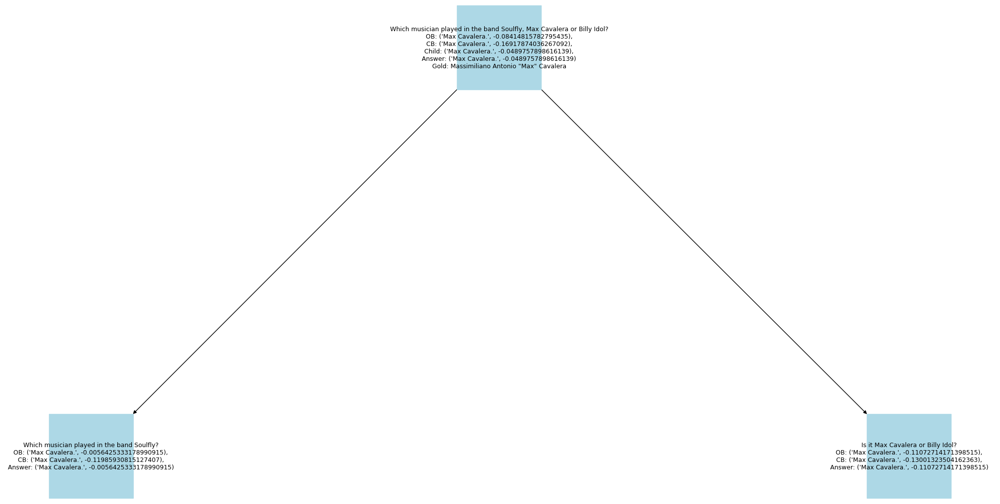

[["The 1978 NBA World Championship Series had as MVP which Hall of Fame class member of 1988?\nOB: ('Wes Unseld.', -0.07577035313851184),\nCB: ('Bill Walton.', -0.05253618511436355),\nChild: ('Wes Unseld.', -0.03523819922396346),\nAnswer: ('Wes Unseld.', -0.03523819922396346)\nGold: Westley Sissel Unseld", "Who was the MVP of the 1978 NBA World Championship Series?\nOB: ('Wes Unseld.', -0.07088060266485587),\nCB: ('Wes Unseld.', -0.032947567526665146),\nAnswer: ('Wes Unseld.', -0.032947567526665146)"], ["The 1978 NBA World Championship Series had as MVP which Hall of Fame class member of 1988?\nOB: ('Wes Unseld.', -0.07577035313851184),\nCB: ('Bill Walton.', -0.05253618511436355),\nChild: ('Wes Unseld.', -0.03523819922396346),\nAnswer: ('Wes Unseld.', -0.03523819922396346)\nGold: Westley Sissel Unseld", "Which Hall of Fame class of 1988 is <1>?\nOB: ('Naismith Memorial Basketball Hall of Fame.', -0.0070775366691077255),\nCB: ('Naismith Memorial Basketball Hall of Fame.', -0.08199654592

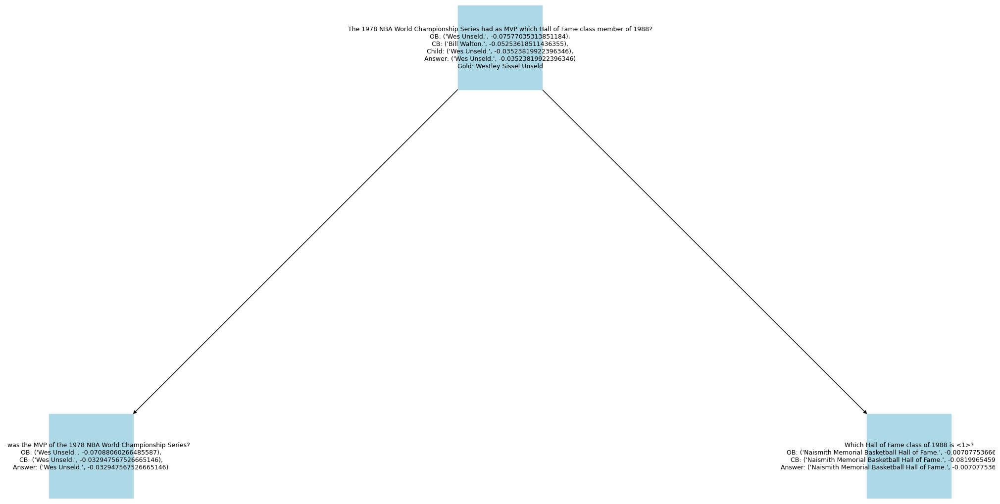

[['What is the name of the actress who has received a Drama Desk award and was part of the cast album for the 2007 Broadway production of the hit musical, "Grease"?\nOB: (\'Laura Osnes.\', -0.04146258051864727),\nCB: (\'Susan Blackwell.\', -0.04621481719202789),\nChild: (\'Unknown.\', -0.07134220379448204),\nAnswer: (\'Laura Osnes.\', -0.04146258051864727)\nGold: Laura Ann Osnes', "Which actress has received a Drama Desk award?\nOB: ('Unknown.', -0.2529222848458571),\nCB: ('Laura Linney.', -0.13309695142798048),\nAnswer: ('Laura Linney.', -0.13309695142798048)"], ['What is the name of the actress who has received a Drama Desk award and was part of the cast album for the 2007 Broadway production of the hit musical, "Grease"?\nOB: (\'Laura Osnes.\', -0.04146258051864727),\nCB: (\'Susan Blackwell.\', -0.04621481719202789),\nChild: (\'Unknown.\', -0.07134220379448204),\nAnswer: (\'Laura Osnes.\', -0.04146258051864727)\nGold: Laura Ann Osnes', 'Which actress was part of the cast album for t

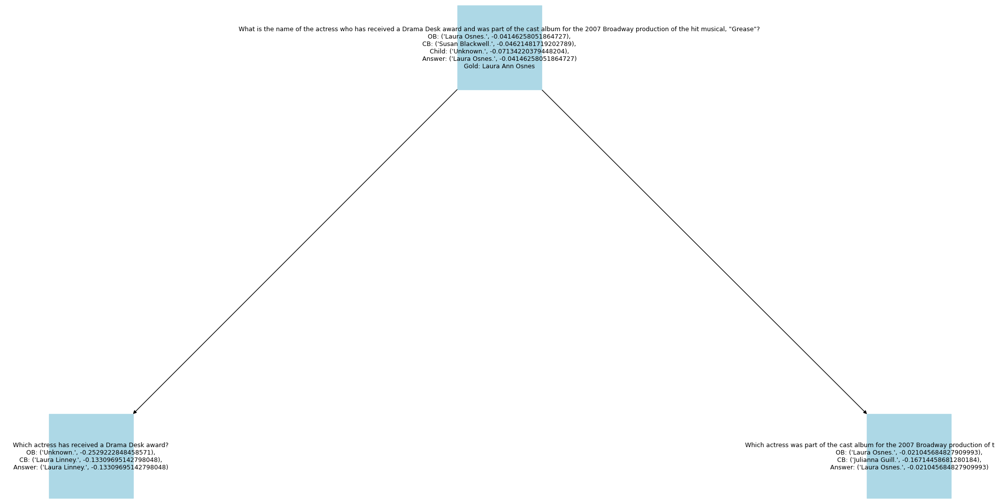

[["Which star in the Maltese Bippy died in 1987?\nOB: ('Unknown.', -100),\nCB: ('neither.', -0.12730363407247022),\nChild: ('None.', -0.047846942789958526),\nAnswer: ('None.', -0.047846942789958526)\nGold: Dan Rowan", "Which star was in the Maltese Bippy?\nOB: ('Dan Rowan and Dick Martin.', -0.045481503009794276),\nCB: ('Jerome Cowan.', -0.21880241516810758),\nAnswer: ('Dan Rowan and Dick Martin.', -0.045481503009794276)"], ["Which star in the Maltese Bippy died in 1987?\nOB: ('Unknown.', -100),\nCB: ('neither.', -0.12730363407247022),\nChild: ('None.', -0.047846942789958526),\nAnswer: ('None.', -0.047846942789958526)\nGold: Dan Rowan", "Which of <1> died in 1987?\nOB: ('Dan Rowan.', -0.010522736304606666),\nCB: ('Dan Rowan.', -0.13100906866400866),\nAnswer: ('Dan Rowan.', -0.010522736304606666)"]]


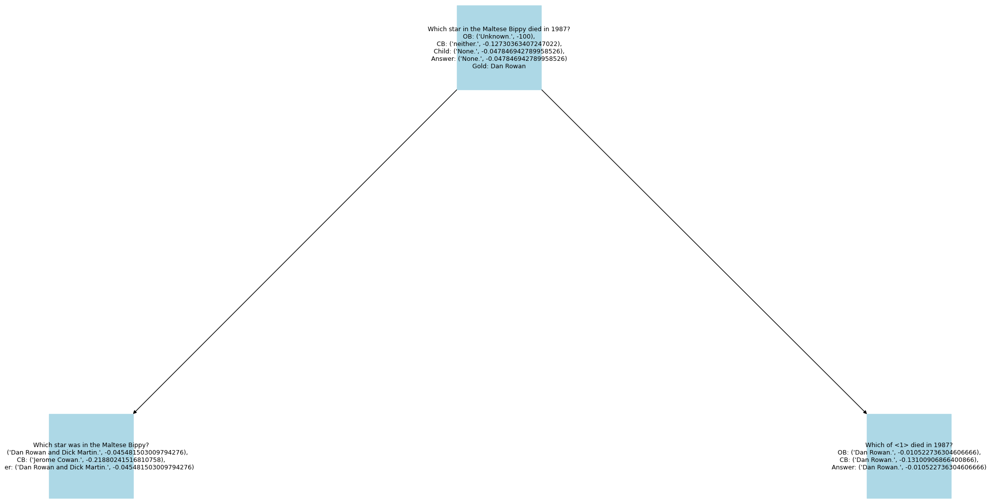

[["A man who played in the 1986 FIFA world cup played for what team during the 1982 Scottish League Cup Final?\nOB: ('Unknown.', -100),\nCB: ('Dundee United.', -0.0871327989560808),\nChild: ('Dundee United.', -0.04278545935246671),\nAnswer: ('Dundee United.', -0.04278545935246671)\nGold: Celtic", 'Who played in the 1986 FIFA world cup?\nOB: (\'Labid Khalifa, Félix Cruz, Fawzi Benkhalidi, and Fadel Jilal.\', -0.007672938360428784),\nCB: ("Please provide the question, and I\'ll answer it in the same format.\\n\\n(Please go ahead and provide the question)", -100),\nAnswer: (\'Labid Khalifa, Félix Cruz, Fawzi Benkhalidi, and Fadel Jilal.\', -0.007672938360428784)'], ["A man who played in the 1986 FIFA world cup played for what team during the 1982 Scottish League Cup Final?\nOB: ('Unknown.', -100),\nCB: ('Dundee United.', -0.0871327989560808),\nChild: ('Dundee United.', -0.04278545935246671),\nAnswer: ('Dundee United.', -0.04278545935246671)\nGold: Celtic", "What team did <1> play for duri

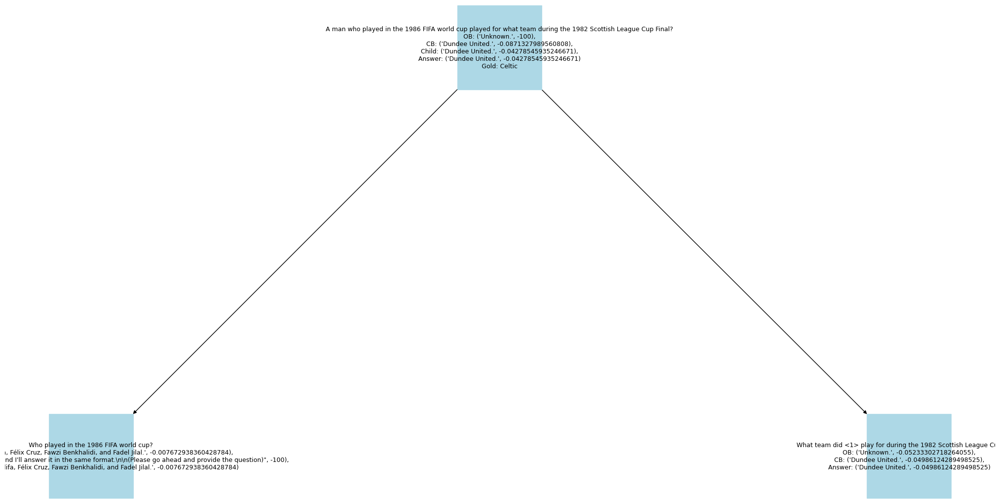

[["Little Brown Stein is a rivalry trophy that imitates a mug made out of what item?\nOB: ('earthenware.', -0.11335597009721199),\nCB: ('jug.', -0.11463410324402498),\nChild: ('a stein mug.', -0.039449713916246215),\nAnswer: ('a stein mug.', -0.039449713916246215)\nGold: stoneware", "What is Little Brown Stein?\nOB: ('a rivalry trophy.', -0.010569099295715804),\nCB: ('a novel written by Abraham Verghese.', -0.4240956878453184),\nAnswer: ('a rivalry trophy.', -0.010569099295715804)"], ["Little Brown Stein is a rivalry trophy that imitates a mug made out of what item?\nOB: ('earthenware.', -0.11335597009721199),\nCB: ('jug.', -0.11463410324402498),\nChild: ('a stein mug.', -0.039449713916246215),\nAnswer: ('a stein mug.', -0.039449713916246215)\nGold: stoneware", "Little Brown Stein is a mug made out of what item?\nOB: ('a stein mug.', -0.05145111991374699),\nCB: ('beer stein.', -0.16825583167909217),\nAnswer: ('a stein mug.', -0.05145111991374699)"]]


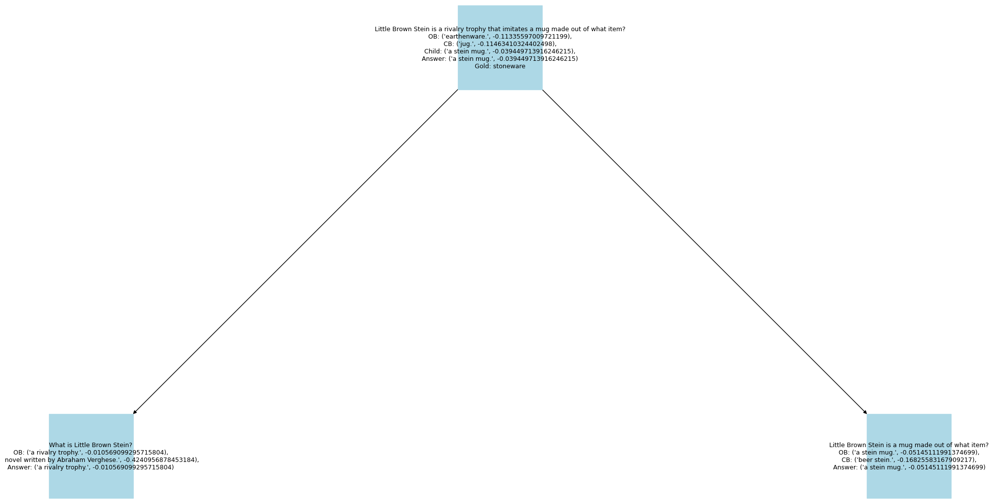

[["What was the island, on which Marinelli Glacier is located, formerly known as?\nOB: ('Isla Grande de Tierra del Fuego.', -0.043372690677599),\nCB: ('Half Moon Island.', -0.129119044629913),\nChild: ('an island.', -0.06325020664316809),\nAnswer: ('Isla Grande de Tierra del Fuego.', -0.043372690677599)\nGold: Isla de Xativa", "On which island is Marinelli Glacier located?\nOB: ('Isla Grande de Tierra del Fuego.', -0.09367921774780352),\nCB: ('Livingston Island.', -0.18292655490120333),\nAnswer: ('Isla Grande de Tierra del Fuego.', -0.09367921774780352)"], ["What was the island, on which Marinelli Glacier is located, formerly known as?\nOB: ('Isla Grande de Tierra del Fuego.', -0.043372690677599),\nCB: ('Half Moon Island.', -0.129119044629913),\nChild: ('an island.', -0.06325020664316809),\nAnswer: ('Isla Grande de Tierra del Fuego.', -0.043372690677599)\nGold: Isla de Xativa", "What was <1> formerly known as?\nOB: ('an island.', -0.061929238011307494),\nCB: ('an island.', -0.182373816

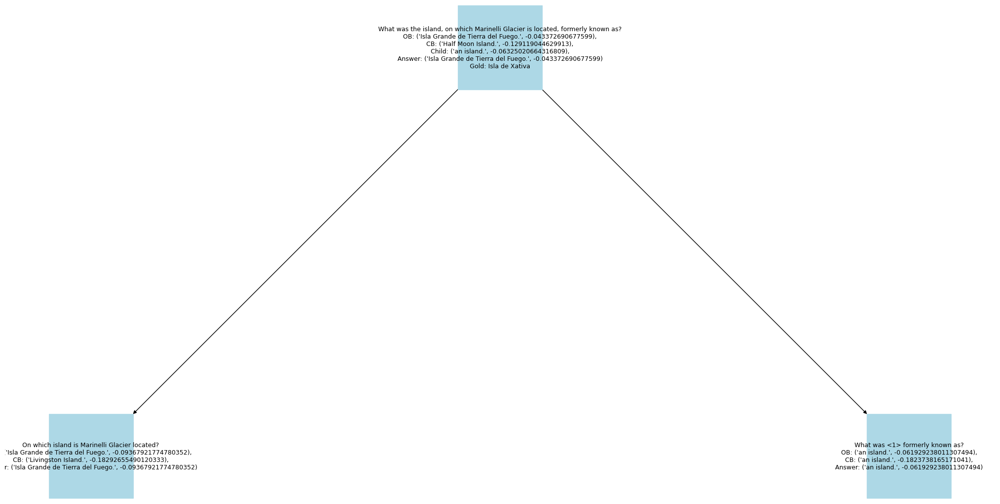

[["In what county was Duffy Jackson born?\nOB: ('Nassau.', -0.09058383459653317),\nCB: ('Livingston County.', -0.0895041859484257),\nChild: ('Texas.', -0.07068767902220123),\nAnswer: ('Texas.', -0.07068767902220123)\nGold: Nassau County", "Who is Duffy Jackson?\nOB: ('an American jazz drummer.', -0.01098059294881),\nCB: ('a songwriter and producer.', -0.3979902817841786),\nAnswer: ('an American jazz drummer.', -0.01098059294881)"], ["In what county was Duffy Jackson born?\nOB: ('Nassau.', -0.09058383459653317),\nCB: ('Livingston County.', -0.0895041859484257),\nChild: ('Texas.', -0.07068767902220123),\nAnswer: ('Texas.', -0.07068767902220123)\nGold: Nassau County", "In what county was <1> born?\nOB: ('Texas.', -0.06384801811525555),\nCB: ('Oakland County.', -0.18745873179967168),\nAnswer: ('Texas.', -0.06384801811525555)"]]


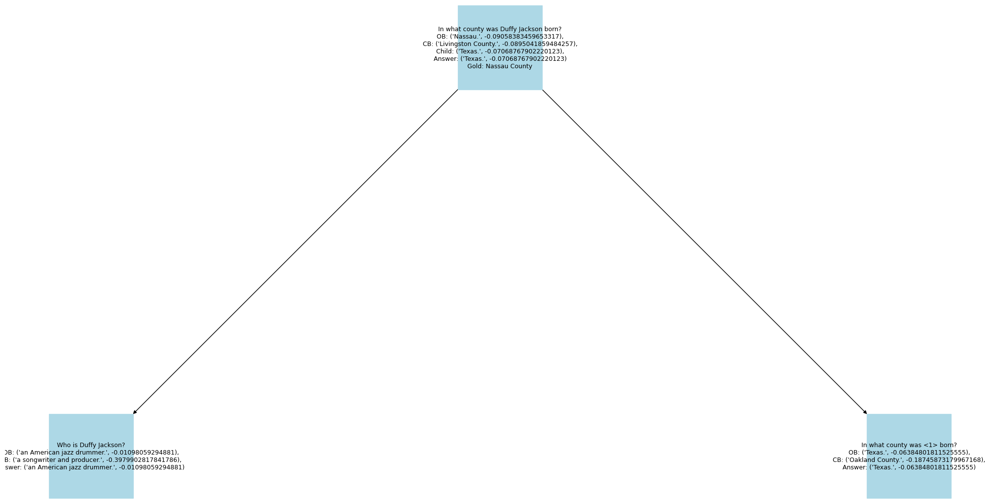

[["What sort of dog did the same man who cared for the living gift that Martin Bormann gave Hitler have?\nOB: ('German Shepherd.', -0.13838039970674),\nCB: ('German Shepherd.', -0.11278810701181),\nChild: ('Fox Terrier.', -0.12565931780123124),\nAnswer: ('German Shepherd.', -0.11278810701181)\nGold: dachshund", "Who cared for the living gift that Martin Bormann gave Hitler?\nOB: ('Unknown.', -100),\nCB: ('Frau Braun.', -0.19062082631212499),\nAnswer: ('Frau Braun.', -0.19062082631212499)"], ["What sort of dog did the same man who cared for the living gift that Martin Bormann gave Hitler have?\nOB: ('German Shepherd.', -0.13838039970674),\nCB: ('German Shepherd.', -0.11278810701181),\nChild: ('Fox Terrier.', -0.12565931780123124),\nAnswer: ('German Shepherd.', -0.11278810701181)\nGold: dachshund", "What sort of dog did <1> have?\nOB: ('Unknown.', -0.1315266001196636),\nCB: ('Fox Terrier.', -0.2629319637010237),\nAnswer: ('Fox Terrier.', -0.2629319637010237)"]]


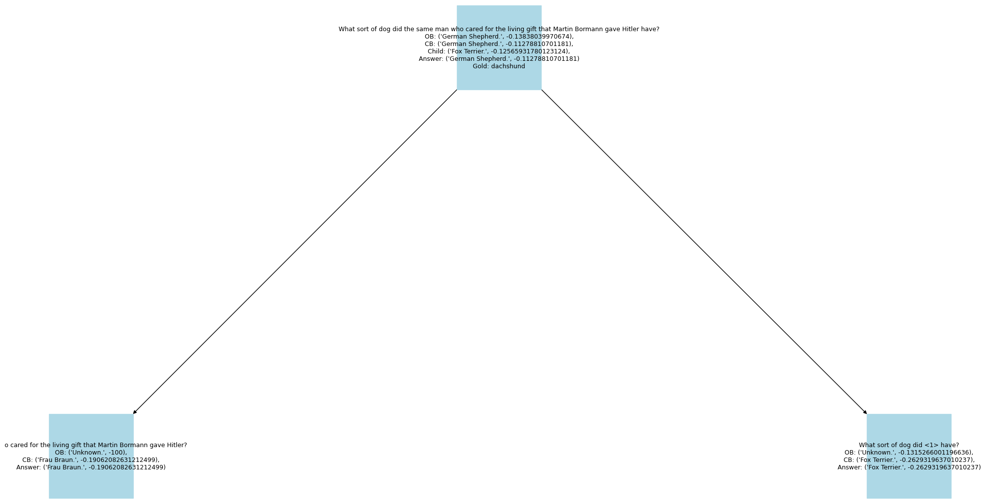

[["Viking: The Ultimate Obstacle Course was a game show that aired in Europe with the British presenter who was an Olympic participant in what sport?\nOB: ('Unknown.', -0.1059513970959189),\nCB: ('swimming.', -0.06153894160775862),\nChild: ('bobsledding.', -0.06754082552511892),\nAnswer: ('swimming.', -0.06153894160775862)\nGold: bobsledder", "Viking: The Ultimate Obstacle Course was a game show that aired in Europe with which British presenter?\nOB: ('Colin Bryce.', -0.03611178294670772),\nCB: ('Jet Jurgensmeyer.', -0.19291845535943594),\nAnswer: ('Colin Bryce.', -0.03611178294670772)"], ["Viking: The Ultimate Obstacle Course was a game show that aired in Europe with the British presenter who was an Olympic participant in what sport?\nOB: ('Unknown.', -0.1059513970959189),\nCB: ('swimming.', -0.06153894160775862),\nChild: ('bobsledding.', -0.06754082552511892),\nAnswer: ('swimming.', -0.06153894160775862)\nGold: bobsledder", "Which sport was <1> an Olympic participant in?\nOB: ('bobsl

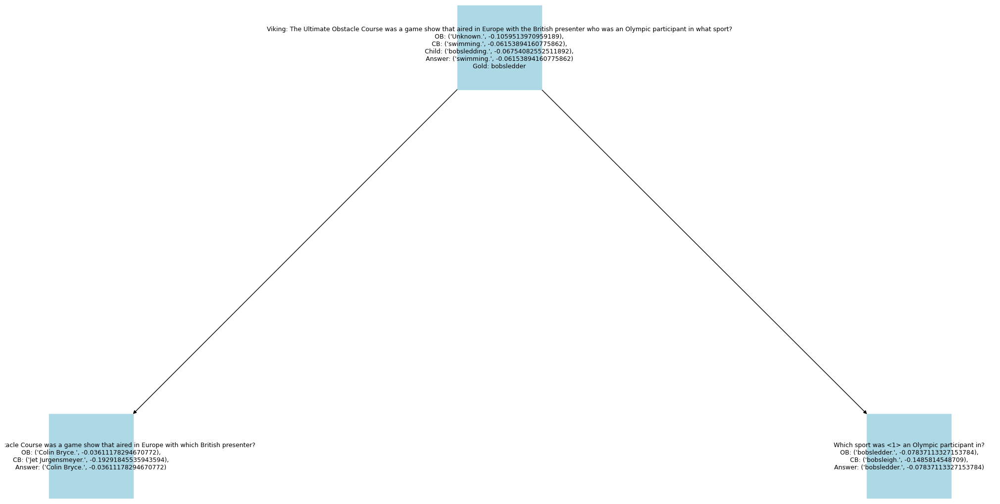

[['Chimaja Appa was the younger brother of a general of the Maratha Empire in India, who served as what to the fifth Maratha Chhatrapati Shahu from 1720 until his death?\nOB: (\'Unknown.\', -100),\nCB: (\'Peshwa.\', -0.049890609420167494),\nChild: (\'Diwan.\', -0.09450927621673588),\nAnswer: (\'Peshwa.\', -0.049890609420167494)\nGold: "Peshwa" (Prime Minister)', "Who was Chimaja Appa's brother?\nOB: ('Unknown.', -0.1459081733890006),\nCB: ('Damaji Appa.', -0.20660916325814283),\nAnswer: ('Damaji Appa.', -0.20660916325814283)"], ['Chimaja Appa was the younger brother of a general of the Maratha Empire in India, who served as what to the fifth Maratha Chhatrapati Shahu from 1720 until his death?\nOB: (\'Unknown.\', -100),\nCB: (\'Peshwa.\', -0.049890609420167494),\nChild: (\'Diwan.\', -0.09450927621673588),\nAnswer: (\'Peshwa.\', -0.049890609420167494)\nGold: "Peshwa" (Prime Minister)', "What was <1>'s position to the fifth Maratha Chhatrapati Shahu from 1720 until his death?\nOB: ('Unkn

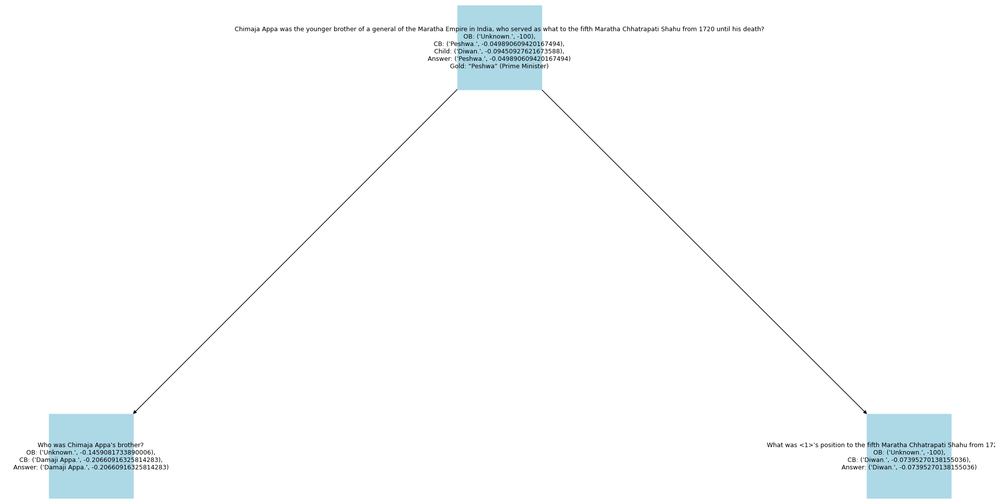

[["When will Flicker, created by a member of One Direction, be released?\nOB: ('Unknown.', -100),\nCB: ('May 30, 2016.', -0.2494832694850249),\nChild: ('Unknown.', -0.07423746909393311),\nAnswer: ('May 30, 2016.', -0.2494832694850249)\nGold: October 20, 2017", "Which member of One Direction created Flicker?\nOB: ('Unknown.', -100),\nCB: ('Harry Styles.', -0.09315101337904667),\nAnswer: ('Harry Styles.', -0.09315101337904667)"], ["When will Flicker, created by a member of One Direction, be released?\nOB: ('Unknown.', -100),\nCB: ('May 30, 2016.', -0.2494832694850249),\nChild: ('Unknown.', -0.07423746909393311),\nAnswer: ('May 30, 2016.', -0.2494832694850249)\nGold: October 20, 2017", 'When will <1>\'s Flicker be released?\nOB: (\'Unknown.\', -0.2099238482145656),\nCB: ("There is no release date for Harry Styles\' Flicker because it does not exist.", -0.141970936482053),\nAnswer: ("There is no release date for Harry Styles\' Flicker because it does not exist.", -0.141970936482053)']]


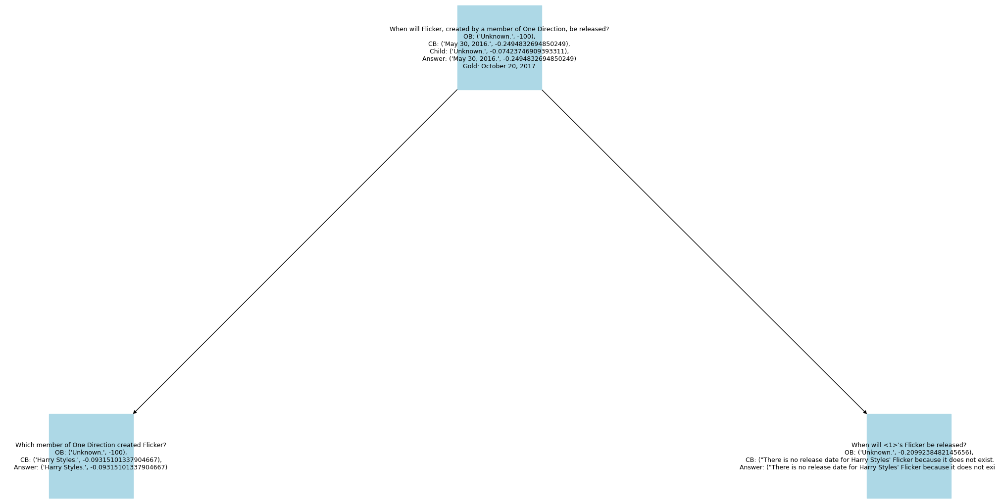

[["Who was born first, Kwok Kin Pong or Edison Chen?\nOB: ('Edison Chen.', -0.019220573660664278),\nCB: ('Kwok Kin Pong.', -0.10963639572320452),\nChild: ('Edison Chen.', -0.021882087641261577),\nAnswer: ('Edison Chen.', -0.019220573660664278)\nGold: Edison Koon-hei Chen", "When was Kwok Kin Pong born?\nOB: ('30 March 1987.', -0.01373070476858125),\nCB: ('30 June 1984.', -0.079373206052835),\nAnswer: ('30 March 1987.', -0.01373070476858125)"], ["Who was born first, Kwok Kin Pong or Edison Chen?\nOB: ('Edison Chen.', -0.019220573660664278),\nCB: ('Kwok Kin Pong.', -0.10963639572320452),\nChild: ('Edison Chen.', -0.021882087641261577),\nAnswer: ('Edison Chen.', -0.019220573660664278)\nGold: Edison Koon-hei Chen", "When was Edison Chen born?\nOB: ('7 October 1980.', -0.037048221003830005),\nCB: ('November 7, 1958.', -0.18050377629532197),\nAnswer: ('7 October 1980.', -0.037048221003830005)"]]


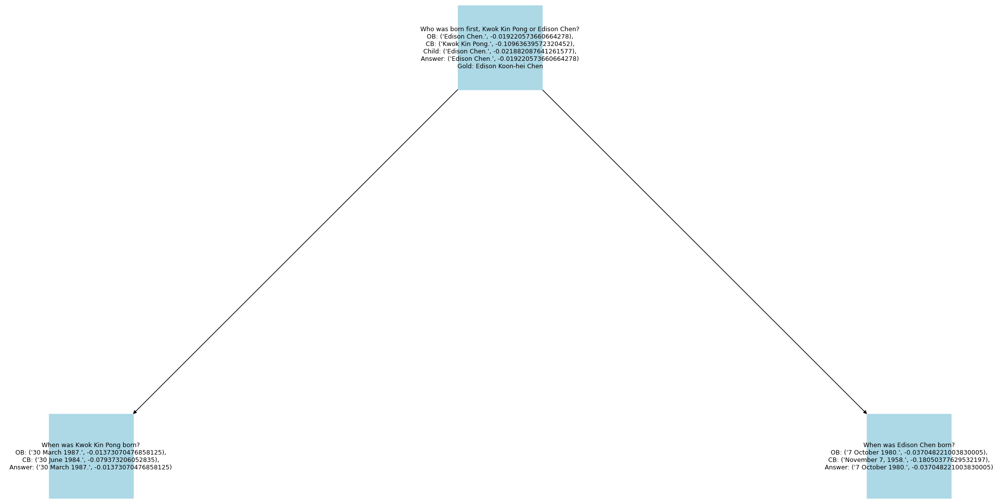

[["What country does Haringey Heartlands and The Mall Wood Green have in common?\nOB: ('England.', -0.13691050992586548),\nCB: ('England.', -0.2937782693789996),\nChild: ('England.', -0.0829005924633923),\nAnswer: ('England.', -0.0829005924633923)\nGold: London", "Which country is Haringey Heartlands in?\nOB: ('England.', -0.0465342712826416),\nCB: ('England.', -0.25265399961715257),\nAnswer: ('England.', -0.0465342712826416)"], ["What country does Haringey Heartlands and The Mall Wood Green have in common?\nOB: ('England.', -0.13691050992586548),\nCB: ('England.', -0.2937782693789996),\nChild: ('England.', -0.0829005924633923),\nAnswer: ('England.', -0.0829005924633923)\nGold: London", "Which country is The Mall Wood Green in?\nOB: ('England.', -0.12407468249562875),\nCB: ('England.', -0.259681891966),\nAnswer: ('England.', -0.12407468249562875)"]]


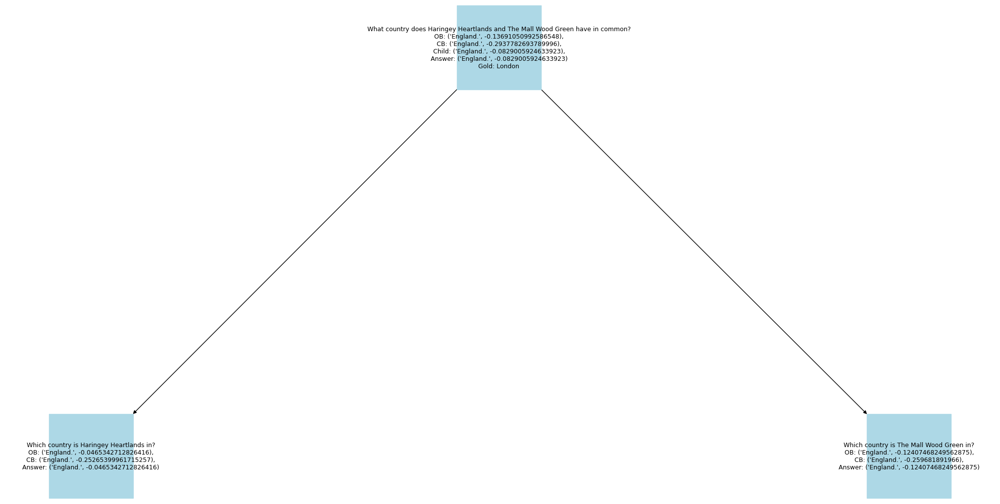

[["The McKinley Tariff was framed by the representative who was later assassinated in what month?\nOB: ('September.', -0.05932298446026261),\nCB: ('September.', -0.030014018095928754),\nChild: ('September.', -0.03554902928309667),\nAnswer: ('September.', -0.030014018095928754)\nGold: September 1901", "Who framed the McKinley Tariff?\nOB: ('William McKinley.', -0.02471767939309846),\nCB: ('William McKinley and Nelson Dingley Jr.', -0.09318224882120767),\nAnswer: ('William McKinley.', -0.02471767939309846)"], ["The McKinley Tariff was framed by the representative who was later assassinated in what month?\nOB: ('September.', -0.05932298446026261),\nCB: ('September.', -0.030014018095928754),\nChild: ('September.', -0.03554902928309667),\nAnswer: ('September.', -0.030014018095928754)\nGold: September 1901", "When was <1> assassinated?\nOB: ('September 6, 1901.', -0.017407266188245552),\nCB: ('September 6, 1901.', -0.023438709444060745),\nAnswer: ('September 6, 1901.', -0.017407266188245552)

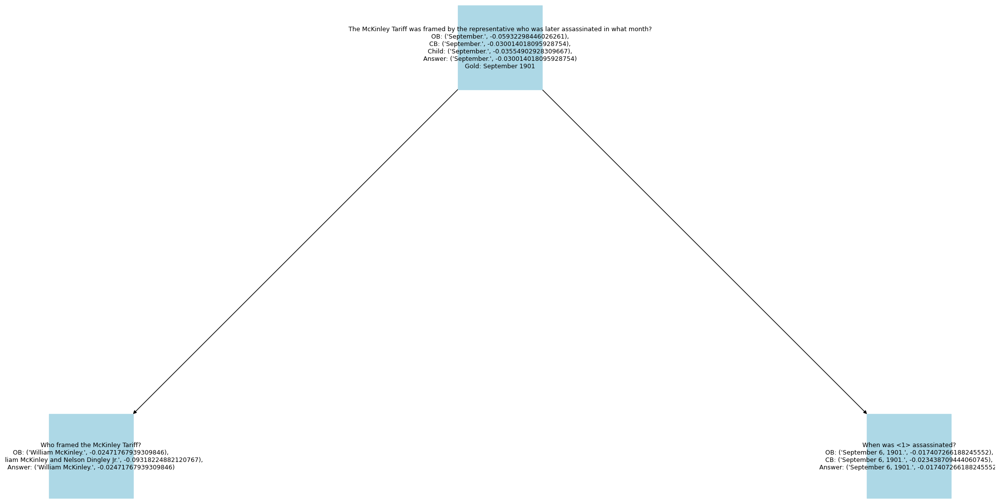

[["How many member universities are there in this conference of which the Connecticut Huskies baseball team is a competing member?\nOB: ('Unknown.', -0.10848583919197233),\nCB: ('11.', -0.02597841940787),\nChild: ('11.', -0.05253064711166736),\nAnswer: ('11.', -0.02597841940787)\nGold: 12 member universities", "conference of which the Connecticut Huskies baseball team is a competing member\nOB: ('American Athletic Conference.', -0.01317786467672294),\nCB: ('American Athletic Conference.', -0.02364892852871118),\nAnswer: ('American Athletic Conference.', -0.01317786467672294)"]]


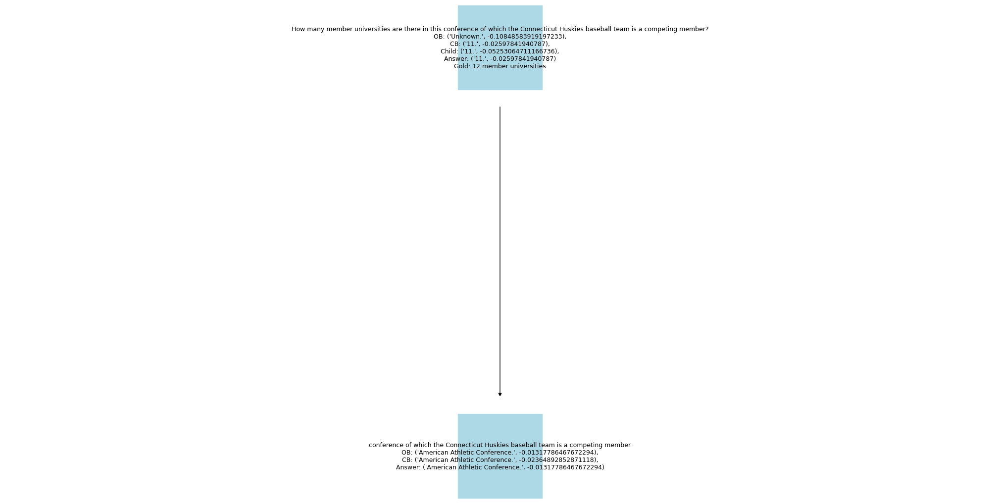

[["Did Lewis Allen or Danny DeVito play Louie De Palma?\nOB: ('Danny DeVito.', -0.08716218468918499),\nCB: ('Danny DeVito.', -0.07797344501048),\nChild: ('Danny DeVito.', -0.05089582020892279),\nAnswer: ('Danny DeVito.', -0.05089582020892279)\nGold: Daniel Michael DeVito, Jr.", "Did Lewis Allen play Louie De Palma?\nOB: ('no.', -0.05167414898040909),\nCB: ('yes.', -0.1449110764962857),\nAnswer: ('no.', -0.05167414898040909)"], ["Did Lewis Allen or Danny DeVito play Louie De Palma?\nOB: ('Danny DeVito.', -0.08716218468918499),\nCB: ('Danny DeVito.', -0.07797344501048),\nChild: ('Danny DeVito.', -0.05089582020892279),\nAnswer: ('Danny DeVito.', -0.05089582020892279)\nGold: Daniel Michael DeVito, Jr.", "Did Danny DeVito play Louie De Palma?\nOB: ('yes.', -0.08193903421952718),\nCB: ('yes.', -0.05699836515829942),\nAnswer: ('yes.', -0.05699836515829942)"]]


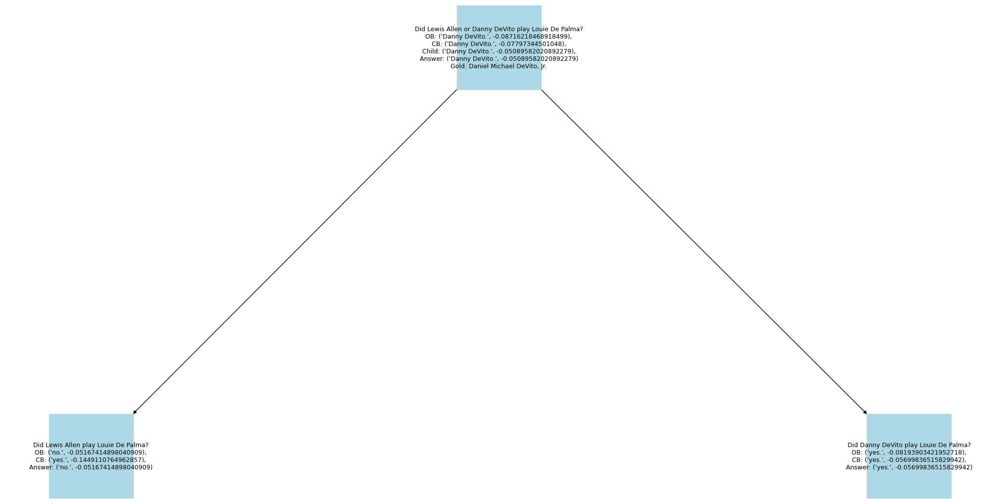

[["How long did The Shire of Flinders, which encompassed the extremity of the Mornington Peninsula located south-east of Melbourne, Australia, exist?\nOB: ('120 years.', -0.000422842813791875),\nCB: ('100 years.', -0.0593239598873262),\nChild: ('Unknown.', -25.045625805366278),\nAnswer: ('120 years.', -0.000422842813791875)\nGold: 1874 until 1994", "What is The Shire of Flinders, which encompassed the extremity of the Mornington Peninsula located south-east of Melbourne, Australia?\nOB: ('a local government area.', -0.021815240383104163),\nCB: ('a former local government area in Victoria, Australia.', -0.0467157332084186),\nAnswer: ('a local government area.', -0.021815240383104163)"], ["How long did The Shire of Flinders, which encompassed the extremity of the Mornington Peninsula located south-east of Melbourne, Australia, exist?\nOB: ('120 years.', -0.000422842813791875),\nCB: ('100 years.', -0.0593239598873262),\nChild: ('Unknown.', -25.045625805366278),\nAnswer: ('120 years.', -0.

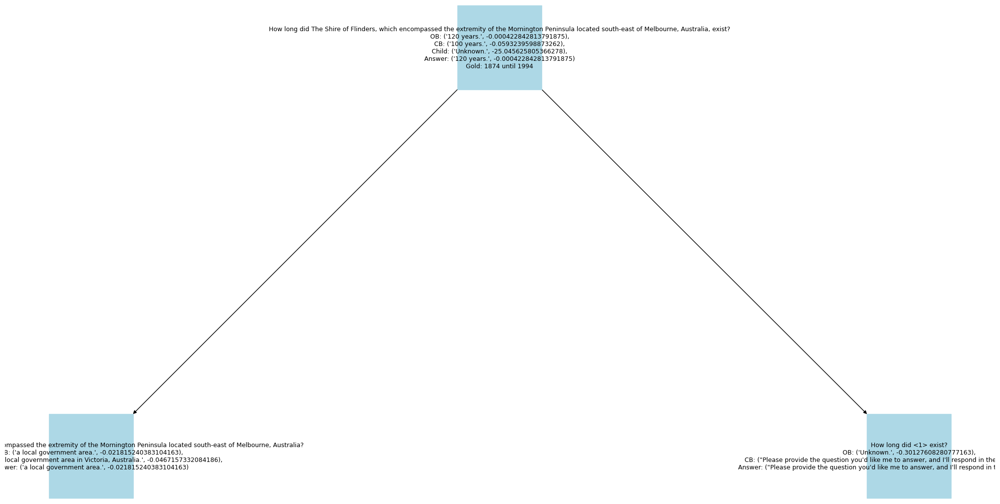

[["What county in Minnesota holds a 202 lb slab of greywacke covered in runes?\nOB: ('Unknown.', -0.11261786655567918),\nCB: ('Runestone County.', -0.026075919129140836),\nChild: ('Douglas County.', -0.05530019755353646),\nAnswer: ('Runestone County.', -0.026075919129140836)\nGold: Douglas", "Which 202 lb slab of greywacke is covered in runes?\nOB: ('The Kensington Runestone.', -0.02209469675115749),\nCB: ('Rök Stone.', -0.10607401948724789),\nAnswer: ('The Kensington Runestone.', -0.02209469675115749)"], ["What county in Minnesota holds a 202 lb slab of greywacke covered in runes?\nOB: ('Unknown.', -0.11261786655567918),\nCB: ('Runestone County.', -0.026075919129140836),\nChild: ('Douglas County.', -0.05530019755353646),\nAnswer: ('Runestone County.', -0.026075919129140836)\nGold: Douglas", "What county in Minnesota holds <1>?\nOB: ('Douglas County.', -0.09058745739104167),\nCB: ('Douglas County.', -0.09672061601138167),\nAnswer: ('Douglas County.', -0.09058745739104167)"]]


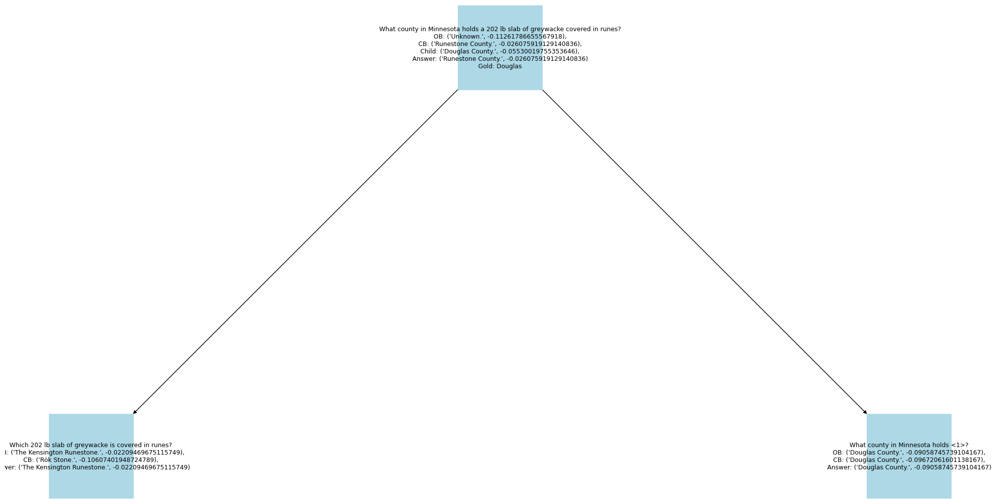

[["How much was Ammon Bundy's son ordered to pay in grazing fees?\nOB: ('over $1 million.', -0.038955927017429365),\nCB: ('$1 million.', -0.03408472224191126),\nChild: ('1,200 guilders.', -0.09147143752280061),\nAnswer: ('$1 million.', -0.03408472224191126)\nGold: over $1 million", "Who is Ammon Bundy's son?\nOB: ('Christoph Friedrich von Ammon.', -0.06434218002203416),\nCB: ('Ammon Bundy is his son.', -0.17720416904565456),\nAnswer: ('Christoph Friedrich von Ammon.', -0.06434218002203416)"], ["How much was Ammon Bundy's son ordered to pay in grazing fees?\nOB: ('over $1 million.', -0.038955927017429365),\nCB: ('$1 million.', -0.03408472224191126),\nChild: ('1,200 guilders.', -0.09147143752280061),\nAnswer: ('$1 million.', -0.03408472224191126)\nGold: over $1 million", "How much was <1> ordered to pay in grazing fees?\nOB: ('Unknown.', -0.14731913807055724),\nCB: ('1,200 guilders.', -0.236054641020152),\nAnswer: ('1,200 guilders.', -0.236054641020152)"]]


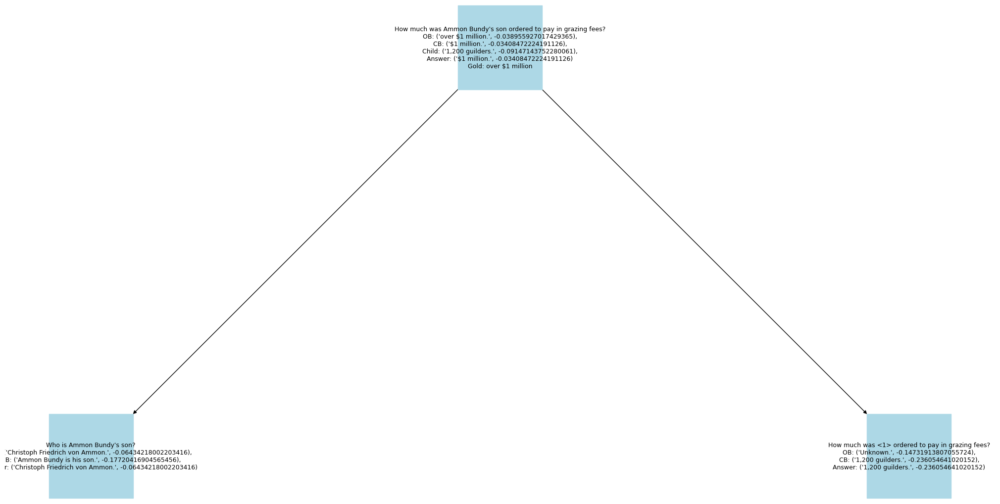

[["How many films were directed by the director of Wise Blood?\nOB: ('Unknown.', -0.12870034232339556),\nCB: ('18.', -0.043132330305988946),\nChild: ('37.', -0.05062413720196505),\nAnswer: ('18.', -0.043132330305988946)\nGold: 37", "Who is the director of Wise Blood?\nOB: ('John Huston.', -0.016783797465249),\nCB: ('John Sayles.', -0.090347528707329),\nAnswer: ('John Huston.', -0.016783797465249)"], ["How many films were directed by the director of Wise Blood?\nOB: ('Unknown.', -0.12870034232339556),\nCB: ('18.', -0.043132330305988946),\nChild: ('37.', -0.05062413720196505),\nAnswer: ('18.', -0.043132330305988946)\nGold: 37", "How many films did <1> direct?\nOB: ('37.', -0.04205319103353533),\nCB: ('41.', -0.14317126444991923),\nAnswer: ('37.', -0.04205319103353533)"]]


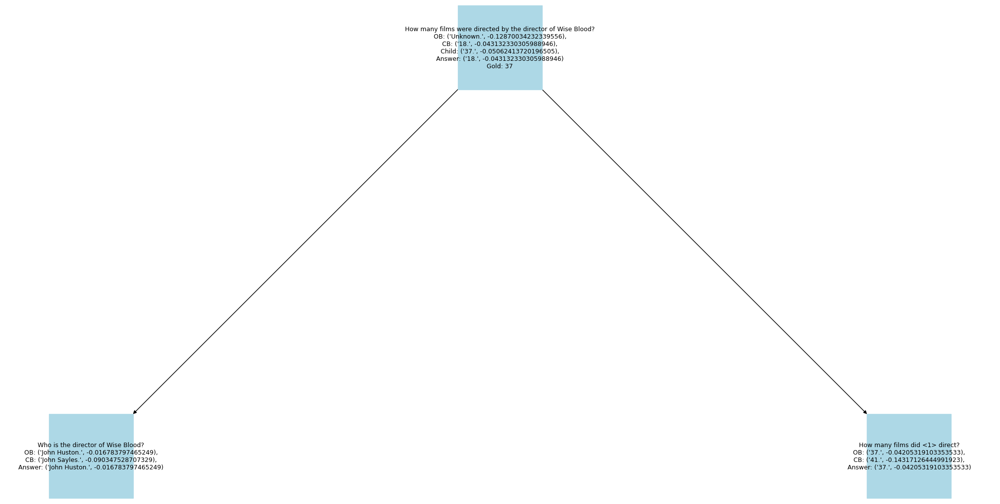

[["Who was the chief executive officer of the second largest US car rental company by sales?\nOB: ('Unknown.', -0.10214036710490332),\nCB: ('Andrew Taylor.', -0.07955075310870581),\nChild: ('Mark P. Frissora.', -0.04487713727800562),\nAnswer: ('Mark P. Frissora.', -0.04487713727800562)\nGold: Robert L. Stone", "Which is the second largest US car rental company by sales?\nOB: ('The Hertz Corporation.', -0.05957724255701334),\nCB: ('Enterprise Holdings.', -0.10761021056341531),\nAnswer: ('The Hertz Corporation.', -0.05957724255701334)"], ["Who was the chief executive officer of the second largest US car rental company by sales?\nOB: ('Unknown.', -0.10214036710490332),\nCB: ('Andrew Taylor.', -0.07955075310870581),\nChild: ('Mark P. Frissora.', -0.04487713727800562),\nAnswer: ('Mark P. Frissora.', -0.04487713727800562)\nGold: Robert L. Stone", "Who was the chief executive officer of <1>?\nOB: ('Kathryn V. Marinello.', -0.08786689119910064),\nCB: ('Mark P. Frissora.', -0.08032232918007),\n

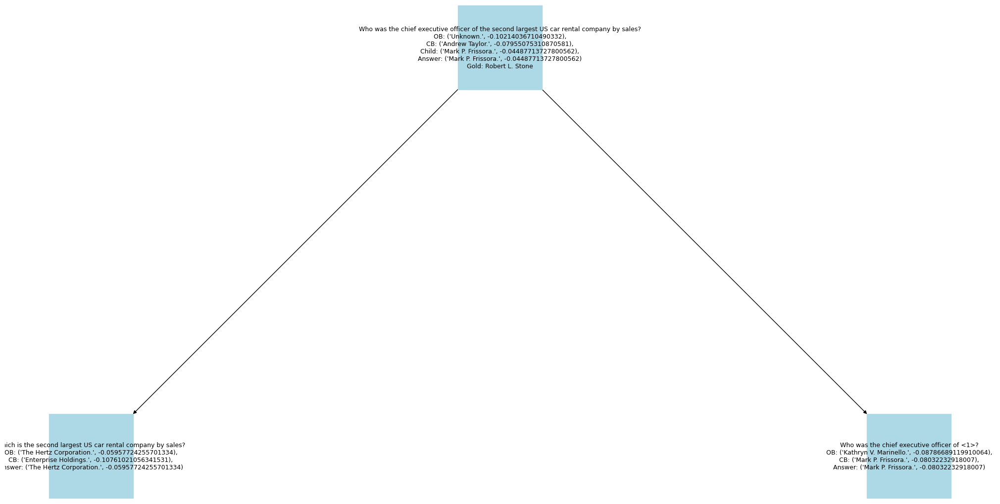

[["Who was the narrator of the 26-episode series which featured the British national museum organization with branches at five locations in England?\nOB: ('Michael Redgrave.', -0.10456970050176638),\nCB: ('Jimmy Doherty.', -0.03052278927542524),\nChild: ('Bernard Cribbins.', -0.07123414427650229),\nAnswer: ('Jimmy Doherty.', -0.03052278927542524)\nGold: Michael Redgrave", "Which British national museum organization with branches at five locations in England was featured in the 26-episode series?\nOB: ('Unknown.', -0.15454047929460918),\nCB: ('National Trust.', -0.04966846100370916),\nAnswer: ('National Trust.', -0.04966846100370916)"], ["Who was the narrator of the 26-episode series which featured the British national museum organization with branches at five locations in England?\nOB: ('Michael Redgrave.', -0.10456970050176638),\nCB: ('Jimmy Doherty.', -0.03052278927542524),\nChild: ('Bernard Cribbins.', -0.07123414427650229),\nAnswer: ('Jimmy Doherty.', -0.03052278927542524)\nGold: M

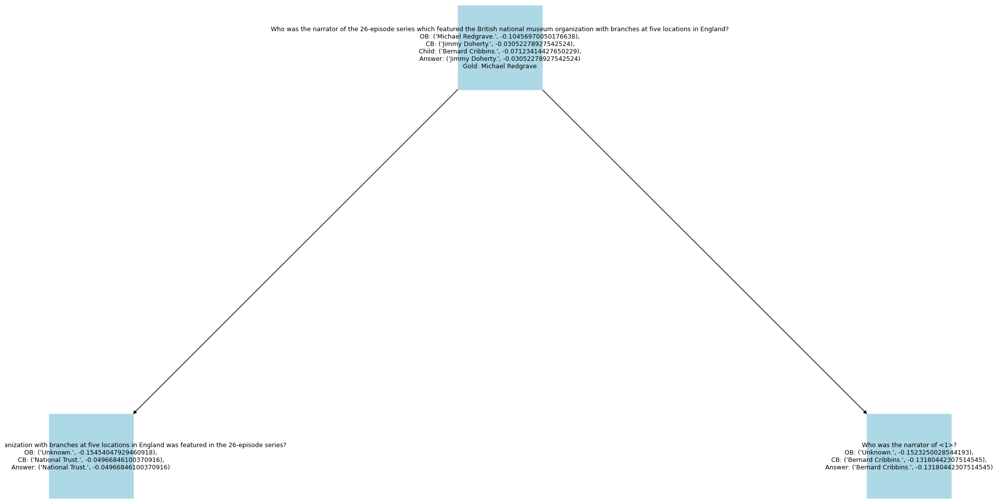

[['What member of the South Korean-Chinese boy group EXO stars in the upcoming movie "The Underdog"?\nOB: (\'Unknown.\', -100),\nCB: (\'D.O..\', -0.0594364234167845),\nChild: (\'None.\', -0.04855174903084929),\nAnswer: (\'None.\', -0.04855174903084929)\nGold: Do Kyung-soo', "Which members are in the South Korean-Chinese boy group EXO?\nOB: ('Baekhyun, Kai, Xiumin, and Suho.', -0.0729373008771768),\nCB: ('Suho, Baekhyun, Chanyeol, D.O., Kai, Sehun, Xiumin, Lay, and Chen.', -0.05603070683527431),\nAnswer: ('Suho, Baekhyun, Chanyeol, D.O., Kai, Sehun, Xiumin, Lay, and Chen.', -0.05603070683527431)"], ['What member of the South Korean-Chinese boy group EXO stars in the upcoming movie "The Underdog"?\nOB: (\'Unknown.\', -100),\nCB: (\'D.O..\', -0.0594364234167845),\nChild: (\'None.\', -0.04855174903084929),\nAnswer: (\'None.\', -0.04855174903084929)\nGold: Do Kyung-soo', 'Which of <1> stars in the upcoming movie "The Underdog"?\nOB: (\'None.\', -0.0503609294101312),\nCB: (\'D.O.\', -0.09358

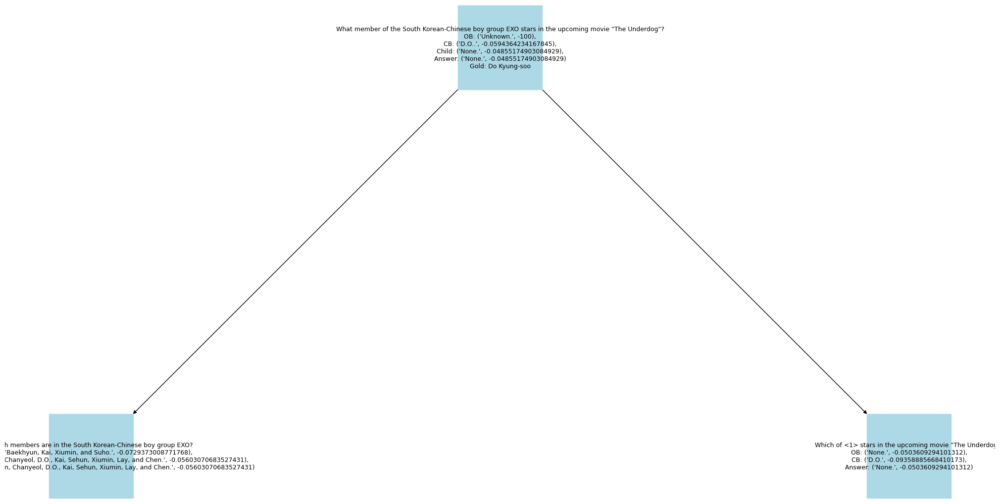

[['The Simpsons episode that aired on February 19, 2012 entitled "At Long Last Leave" represented what milestone for the show?\nOB: (\'500th episode.\', -0.07260305874126402),\nCB: (\'500th episode.\', -0.053168706002628005),\nChild: (\'the 500th episode.\', -0.09879518774260307),\nAnswer: (\'500th episode.\', -0.053168706002628005)\nGold: show\'s 500th episode', 'Which Simpsons episode aired on February 19, 2012 and is entitled "At Long Last Leave"?\nOB: (\'yes.\', -0.1230787425105829),\nCB: (\'23.\', -0.12236446539707246),\nAnswer: (\'23.\', -0.12236446539707246)'], ['The Simpsons episode that aired on February 19, 2012 entitled "At Long Last Leave" represented what milestone for the show?\nOB: (\'500th episode.\', -0.07260305874126402),\nCB: (\'500th episode.\', -0.053168706002628005),\nChild: (\'the 500th episode.\', -0.09879518774260307),\nAnswer: (\'500th episode.\', -0.053168706002628005)\nGold: show\'s 500th episode', "What milestone for the show did <1> represent?\nOB: ('the 2

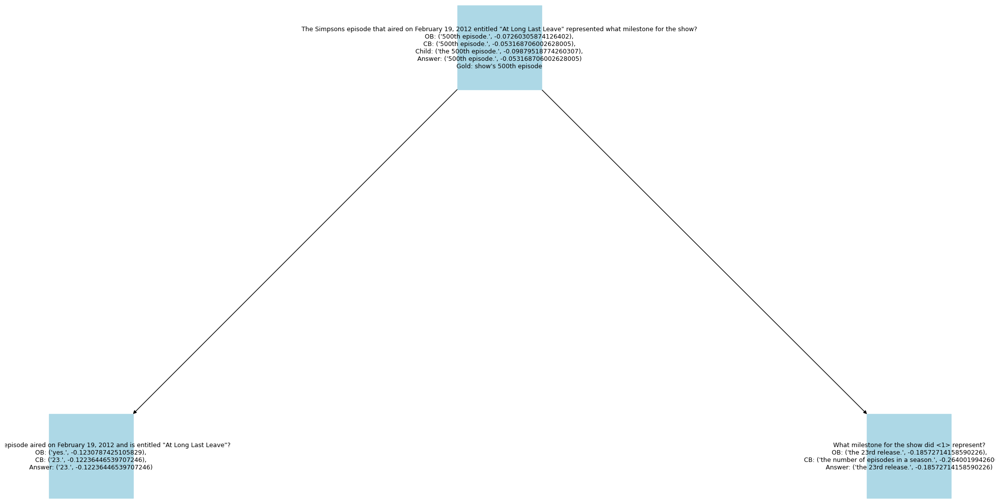

[["what type of media does Ratatouille and PlayStation 3 have in common?\nOB: ('video game.', -0.11265828740225876),\nCB: ('Blu-ray discs.', -0.08132303657878026),\nChild: ('name.', -0.07330584299166547),\nAnswer: ('name.', -0.07330584299166547)\nGold: video game", "What type of media is Ratatouille?\nOB: ('a French Provençal stewed vegetable dish.', -0.055110155912003744),\nCB: ('film.', -0.15740537330289855),\nAnswer: ('a French Provençal stewed vegetable dish.', -0.055110155912003744)"], ["what type of media does Ratatouille and PlayStation 3 have in common?\nOB: ('video game.', -0.11265828740225876),\nCB: ('Blu-ray discs.', -0.08132303657878026),\nChild: ('name.', -0.07330584299166547),\nAnswer: ('name.', -0.07330584299166547)\nGold: video game", "What type of media is PlayStation 3?\nOB: ('home video game console.', -0.035170066988379996),\nCB: ('video game console.', -0.1981289463697468),\nAnswer: ('home video game console.', -0.035170066988379996)"], ["what type of media does Ra

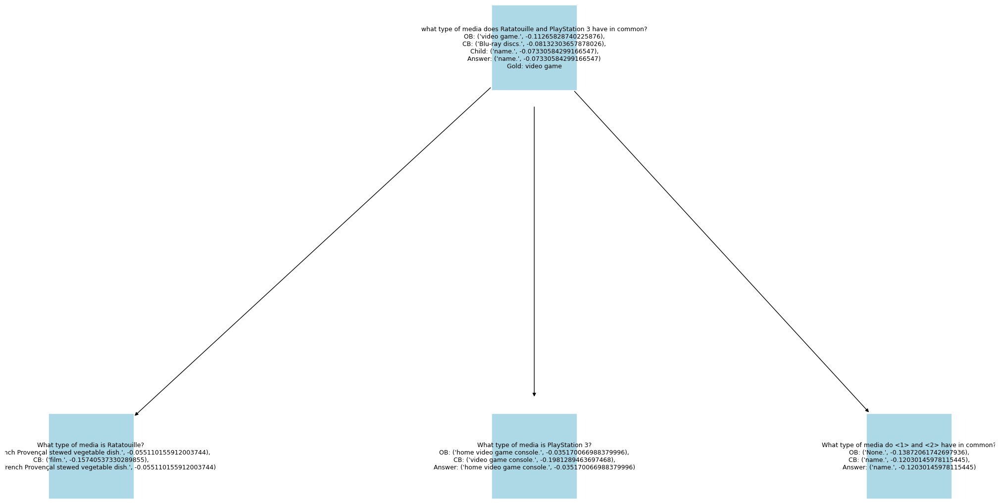

[["What number installment of the Ghost School and Ghost School Horror was the film Voice?\nOB: ('Unknown.', -100),\nCB: ('4.', -0.13511148988031604),\nChild: ('an unknown installment number.', -0.10112440201455061),\nAnswer: ('an unknown installment number.', -0.10112440201455061)\nGold: 4", "What is the film Voice?\nOB: ('Unknown.', -0.18812836838006872),\nCB: ('a 2014 South Korean thriller film.', -0.1416380432786463),\nAnswer: ('a 2014 South Korean thriller film.', -0.1416380432786463)"], ["What number installment of the Ghost School and Ghost School Horror was the film Voice?\nOB: ('Unknown.', -100),\nCB: ('4.', -0.13511148988031604),\nChild: ('an unknown installment number.', -0.10112440201455061),\nAnswer: ('an unknown installment number.', -0.10112440201455061)\nGold: 4", "Is <1> an installment of the Ghost School and Ghost School Horror?\nOB: ('no.', -0.1644625092311662),\nCB: ('yes.', -0.08156923546479827),\nAnswer: ('yes.', -0.08156923546479827)"]]


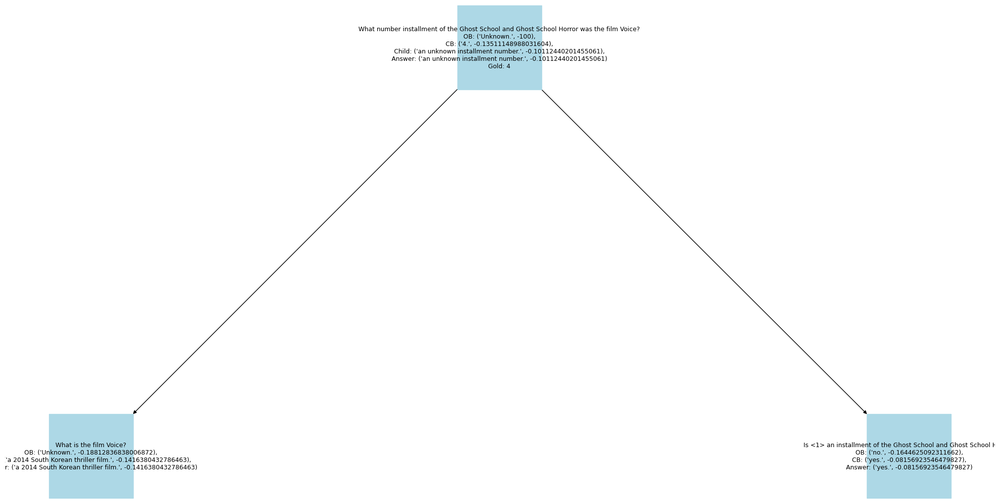

[["Which comic series involves characters such as Nick Fury and Baron von Strucker?\nOB: ('Nick Fury, Agent of S.H.I.E.L.D.', -0.018222153396410836),\nCB: ('Nick Fury, Agent of S.H.I.E.L.D. and The Avengers.', -0.13158190712237466),\nChild: ('Marvel Comics.', -0.08829229641262419),\nAnswer: ('Nick Fury, Agent of S.H.I.E.L.D.', -0.018222153396410836)\nGold: Marvel", "Which comic series involves Nick Fury?\nOB: ('Nick Fury.', -0.15864642527830528),\nCB: ('The Avengers, S.H.I.E.L.D., and Secret Warriors.', -0.17660324850181153),\nAnswer: ('Nick Fury.', -0.15864642527830528)"], ["Which comic series involves characters such as Nick Fury and Baron von Strucker?\nOB: ('Nick Fury, Agent of S.H.I.E.L.D.', -0.018222153396410836),\nCB: ('Nick Fury, Agent of S.H.I.E.L.D. and The Avengers.', -0.13158190712237466),\nChild: ('Marvel Comics.', -0.08829229641262419),\nAnswer: ('Nick Fury, Agent of S.H.I.E.L.D.', -0.018222153396410836)\nGold: Marvel", "Which comic series involves Baron von Strucker?\nOB

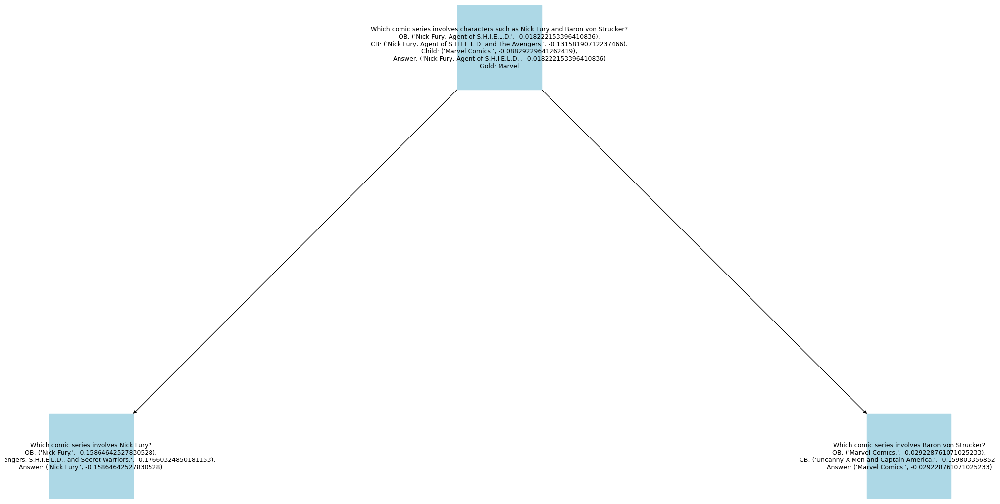

[["Did both  Slaughter-House Cases and United States v. Darby Lumber Co. involve civil rights law?\nOB: ('Yes.', -0.05498490972448563),\nCB: ('yes.', -0.12923143502496431),\nChild: ('no.', -0.05578717757839072),\nAnswer: ('Yes.', -0.05498490972448563)\nGold: no", "Did Slaughter-House Cases involve civil rights law?\nOB: ('yes.', -0.05905681101585374),\nCB: ('yes.', -0.20257462603353485),\nAnswer: ('yes.', -0.05905681101585374)"], ["Did both  Slaughter-House Cases and United States v. Darby Lumber Co. involve civil rights law?\nOB: ('Yes.', -0.05498490972448563),\nCB: ('yes.', -0.12923143502496431),\nChild: ('no.', -0.05578717757839072),\nAnswer: ('Yes.', -0.05498490972448563)\nGold: no", "Did United States v. Darby Lumber Co. involve civil rights law?\nOB: ('no.', -0.11675487985738055),\nCB: ('no.', -0.12987810228376684),\nAnswer: ('no.', -0.11675487985738055)"]]


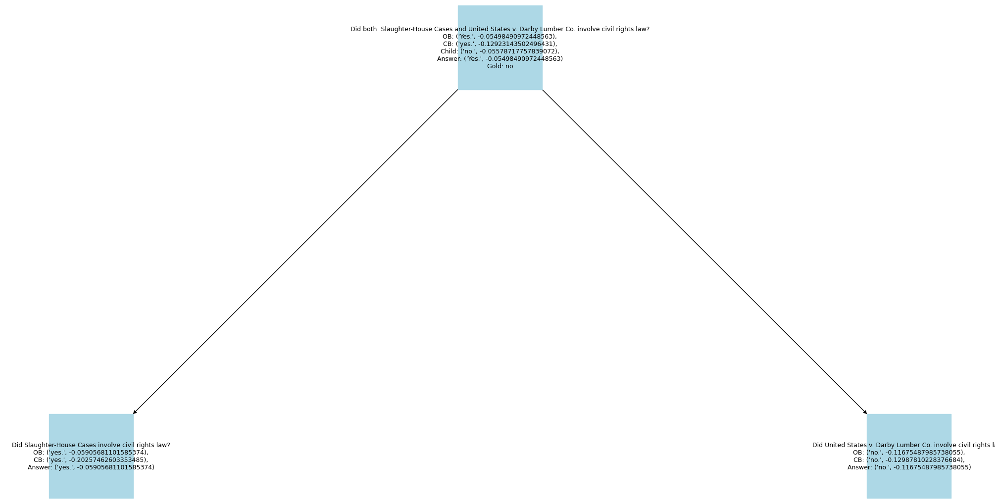

[["Are Toshi and Warrel Dane both in the band Sanctuary?\nOB: ('Unknown.', -100),\nCB: ('yes.', -0.06697434918107538),\nChild: ('no.', -0.10320392769343001),\nAnswer: ('yes.', -0.06697434918107538)\nGold: no", "Is Toshi in the band Sanctuary?\nOB: ('Unknown.', -0.19338210780186924),\nCB: ('no.', -0.28301997860583916),\nAnswer: ('no.', -0.28301997860583916)"], ["Are Toshi and Warrel Dane both in the band Sanctuary?\nOB: ('Unknown.', -100),\nCB: ('yes.', -0.06697434918107538),\nChild: ('no.', -0.10320392769343001),\nAnswer: ('yes.', -0.06697434918107538)\nGold: no", "Is Warrel Dane in the band Sanctuary?\nOB: ('yes.', -0.057613944823226),\nCB: ('yes.', -0.07466285129052479),\nAnswer: ('yes.', -0.057613944823226)"]]


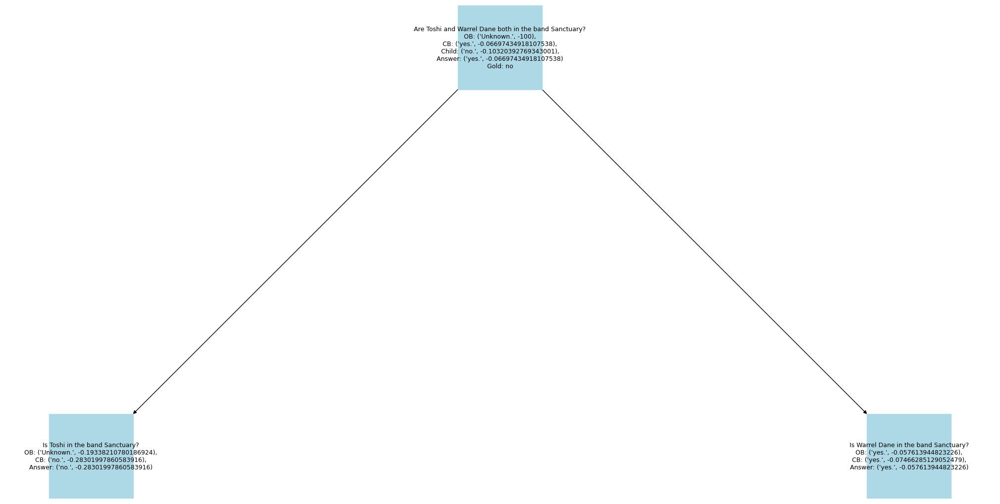

[['The 1996 film "The Christmas Tree" stars Andrew McCarthy and an actress that has won how any Emmy Awards?\nOB: (\'Unknown.\', -0.062261982063682116),\nCB: (\'3.\', -0.08367848383475035),\nChild: (\'10.\', -0.035281614249860066),\nAnswer: (\'10.\', -0.035281614249860066)\nGold: three', 'The 1996 film "The Christmas Tree" stars Andrew McCarthy and which actress?\nOB: (\'Julie Harris.\', -0.007548044879848233),\nCB: (\'Jessica Biel.\', -0.10303473473828316),\nAnswer: (\'Julie Harris.\', -0.007548044879848233)'], ['The 1996 film "The Christmas Tree" stars Andrew McCarthy and an actress that has won how any Emmy Awards?\nOB: (\'Unknown.\', -0.062261982063682116),\nCB: (\'3.\', -0.08367848383475035),\nChild: (\'10.\', -0.035281614249860066),\nAnswer: (\'10.\', -0.035281614249860066)\nGold: three', "How many Emmy Awards has <1> won?\nOB: ('3.', -0.17326300110779952),\nCB: ('10.', -0.0719525876374561),\nAnswer: ('10.', -0.0719525876374561)"]]


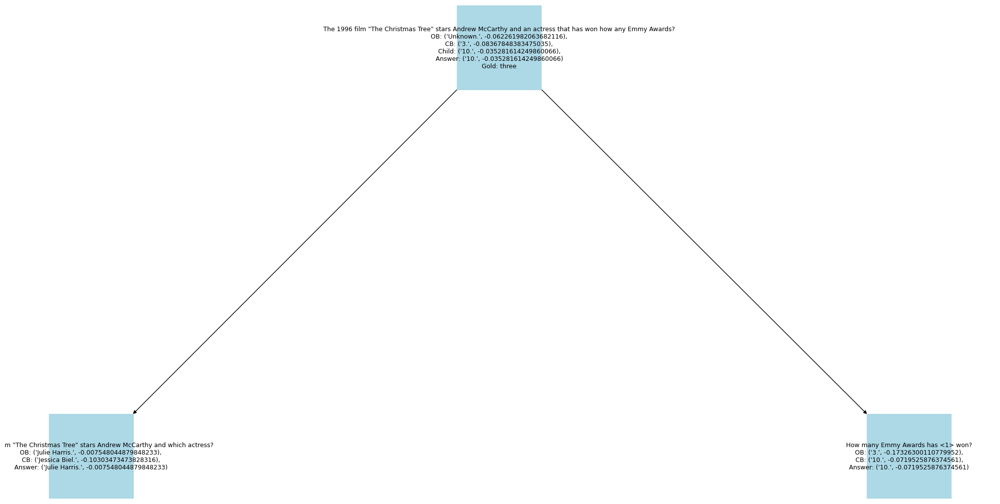

[["Why is Minister Pool important to Black Country and the West Midlands in England?\nOB: ('Unknown.', -100),\nCB: ('its historical significance in facilitating industrial growth and development.', -0.14514370894467227),\nChild: ('it was the training base for the 2006 Commonwealth Games England swimming team.', -0.15871200890718076),\nAnswer: ('its historical significance in facilitating industrial growth and development.', -0.14514370894467227)\nGold: defence of the Cathedral", "What is Minister Pool?\nOB: ('Unknown.', -0.08247896762160332),\nCB: ('a swimming pool in Canberra, Australia.', -0.3870166544357429),\nAnswer: ('a swimming pool in Canberra, Australia.', -0.3870166544357429)"], ["Why is Minister Pool important to Black Country and the West Midlands in England?\nOB: ('Unknown.', -100),\nCB: ('its historical significance in facilitating industrial growth and development.', -0.14514370894467227),\nChild: ('it was the training base for the 2006 Commonwealth Games England swimming

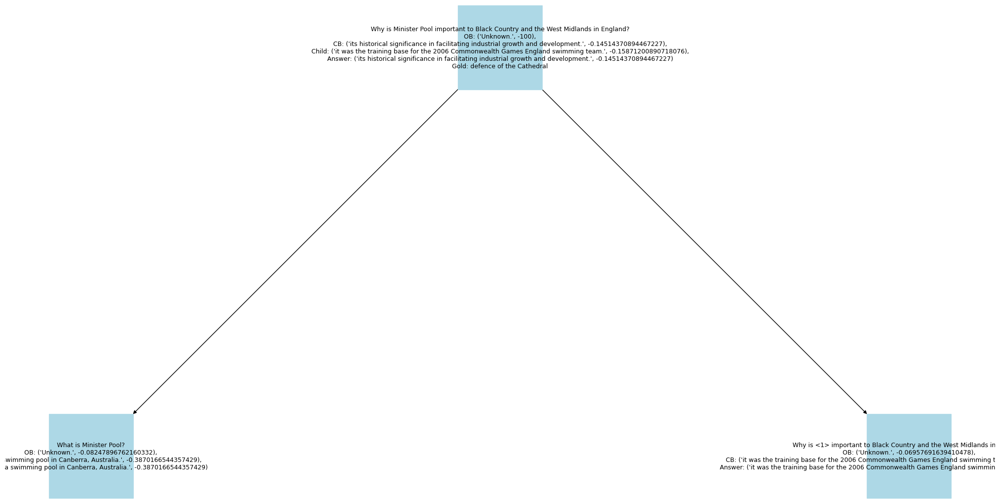

[["Which American rock band, Sugar Ray or Against the Current gained mainstream fame in the 1990's?\nOB: ('Sugar Ray.', -0.057548016402259),\nCB: ('Sugar Ray.', -0.06869804841643762),\nChild: ('Sugar Ray.', -0.047476782320829844),\nAnswer: ('Sugar Ray.', -0.047476782320829844)\nGold: rock", "Did Sugar Ray gain mainstream fame in the 1990's?\nOB: ('yes.', -0.07313321670337167),\nCB: ('yes.', -0.1157096338490072),\nAnswer: ('yes.', -0.07313321670337167)"], ["Which American rock band, Sugar Ray or Against the Current gained mainstream fame in the 1990's?\nOB: ('Sugar Ray.', -0.057548016402259),\nCB: ('Sugar Ray.', -0.06869804841643762),\nChild: ('Sugar Ray.', -0.047476782320829844),\nAnswer: ('Sugar Ray.', -0.047476782320829844)\nGold: rock", "Did Against the Current gain mainstream fame in the 1990's?\nOB: ('no.', -0.05097185705846891),\nCB: ('no.', -0.14373690593182611),\nAnswer: ('no.', -0.05097185705846891)"]]


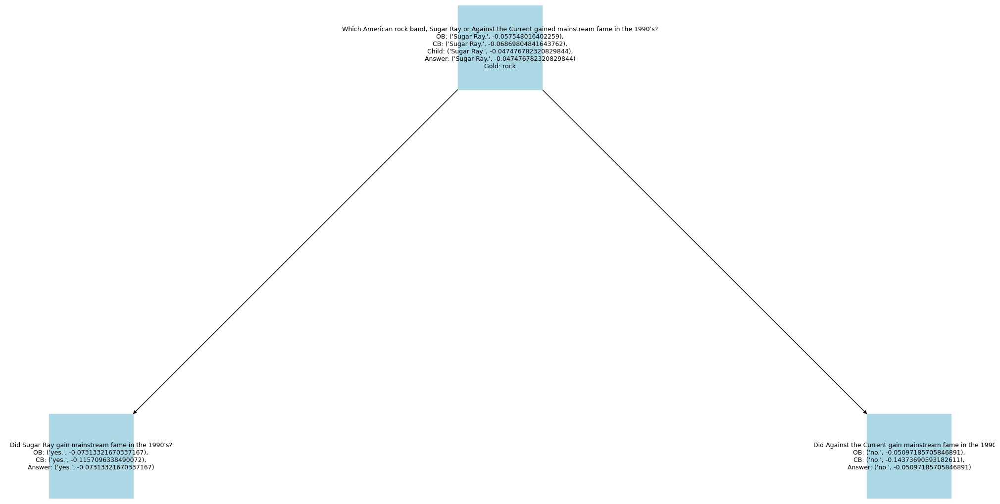

[['This Fox News Specialist Host also took over what Fox Business Channel news program in 2013?\nOB: (\'Unknown.\', -0.1317633391467989),\nCB: (\'Closing Bell.\', -0.05117978007399266),\nChild: ("Cashin\' In.", -0.053131557329327464),\nAnswer: (\'Closing Bell.\', -0.05117978007399266)\nGold: Cashin\' In', 'This Fox News Specialist Host also took over which Fox Business Channel news program?\nOB: ("Cashin\' In.", -0.041114383454200557),\nCB: (\'Varney & Co.\', -0.1376749233841456),\nAnswer: ("Cashin\' In.", -0.041114383454200557)'], ['This Fox News Specialist Host also took over what Fox Business Channel news program in 2013?\nOB: (\'Unknown.\', -0.1317633391467989),\nCB: (\'Closing Bell.\', -0.05117978007399266),\nChild: ("Cashin\' In.", -0.053131557329327464),\nAnswer: (\'Closing Bell.\', -0.05117978007399266)\nGold: Cashin\' In', 'In 2013, <1> took over what Fox Business Channel news program?\nOB: ("Cashin\' In.", -0.009178152243113462),\nCB: (\'The Willis Report.\', -0.0782655476354

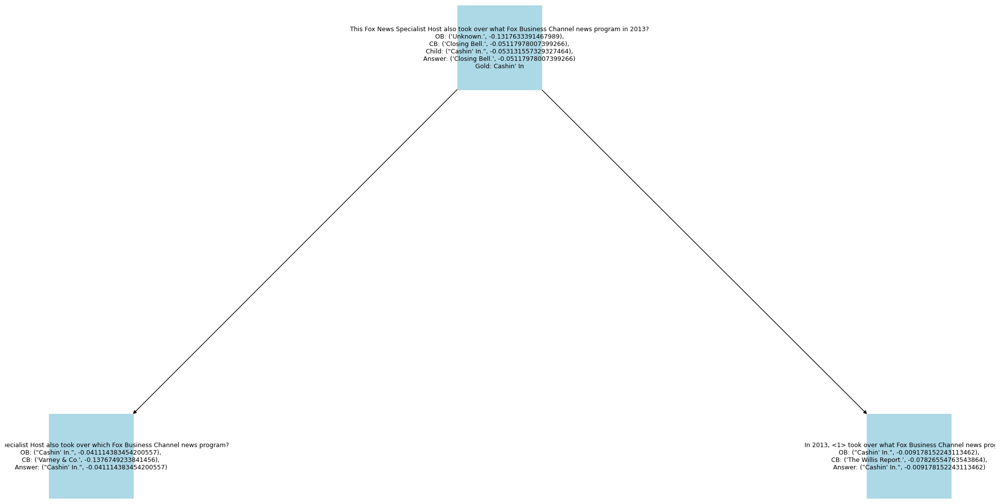

[["Was Atom Egoyans biggest commercial success on stage or on film?\nOB: ('on film.', -0.060447588171692),\nCB: ('on film.', -0.09327669188580608),\nChild: ('on film.', -0.09096026922301331),\nAnswer: ('on film.', -0.060447588171692)\nGold: erotic thriller film", "What is Atom Egoyan's biggest commercial success?\nOB: ('Chloe.', -0.028237122047643497),\nCB: ('The Sweet Hereafter.', -0.07887262321278667),\nAnswer: ('Chloe.', -0.028237122047643497)"], ["Was Atom Egoyans biggest commercial success on stage or on film?\nOB: ('on film.', -0.060447588171692),\nCB: ('on film.', -0.09327669188580608),\nChild: ('on film.', -0.09096026922301331),\nAnswer: ('on film.', -0.060447588171692)\nGold: erotic thriller film", "Was <1> on stage or on film?\nOB: ('On Stage.', -0.4356391884323846),\nCB: ('on film.', -0.18888896184004206),\nAnswer: ('on film.', -0.18888896184004206)"]]


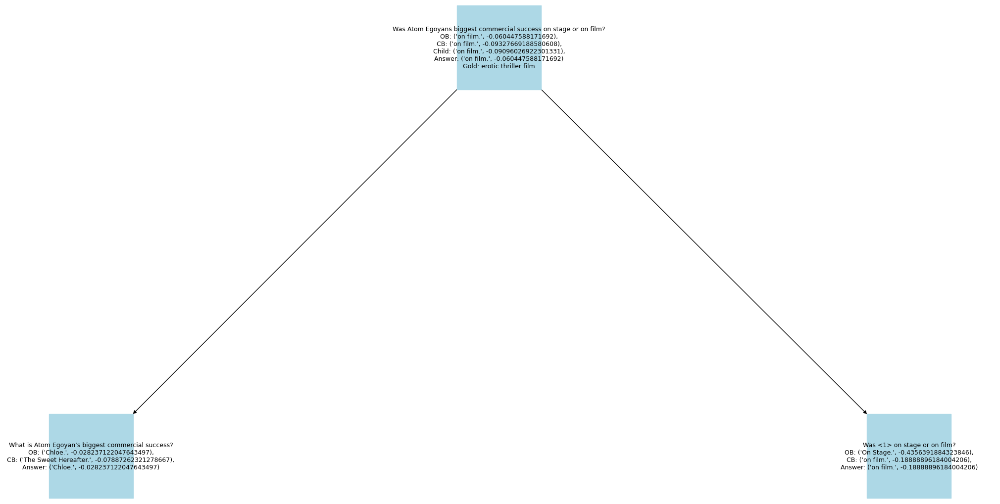

[["What year did the movement that Tess Asplund protested in the viral image of her with her fist in the air disband?\nOB: ('The movement that Tess Asplund protested in the viral image of her with her fist in the air is the Swedish Nordic Resistance Movement. There is no information in the provided context about the movement disbanding, so the answer is: Unknown.', -100),\nCB: ('1943.', -0.08665852959362103),\nChild: ('2000.', -0.06348975703947679),\nAnswer: ('2000.', -0.06348975703947679)\nGold: 2016", "What movement did Tess Asplund protest in the viral image of her with her fist in the air?\nOB: ('Swedish Nordic Resistance Movement.', -0.0432931231824824),\nCB: ('climate change movement.', -0.21370652711941243),\nAnswer: ('Swedish Nordic Resistance Movement.', -0.0432931231824824)"], ["What year did the movement that Tess Asplund protested in the viral image of her with her fist in the air disband?\nOB: ('The movement that Tess Asplund protested in the viral image of her with her fi

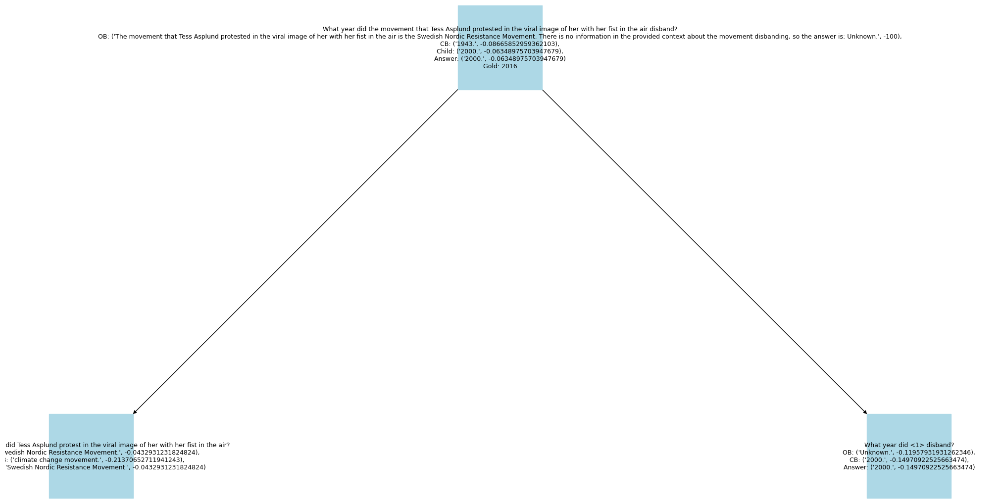

[["Are Macheng and Lianjiang, Guangdong both cities?\nOB: ('No.', -0.04527403148533025),\nCB: ('no.', -0.12320091672810736),\nChild: ('no.', -0.025660705111194924),\nAnswer: ('no.', -0.025660705111194924)\nGold: yes", "Is Macheng a city?\nOB: ('yes.', -0.0034167703631068414),\nCB: ('no.', -0.14379742721347918),\nAnswer: ('yes.', -0.0034167703631068414)"], ["Are Macheng and Lianjiang, Guangdong both cities?\nOB: ('No.', -0.04527403148533025),\nCB: ('no.', -0.12320091672810736),\nChild: ('no.', -0.025660705111194924),\nAnswer: ('no.', -0.025660705111194924)\nGold: yes", "Is Lianjiang, Guangdong a city?\nOB: ('no.', -0.020562720576248503),\nCB: ('no.', -0.10378685316705272),\nAnswer: ('no.', -0.020562720576248503)"]]


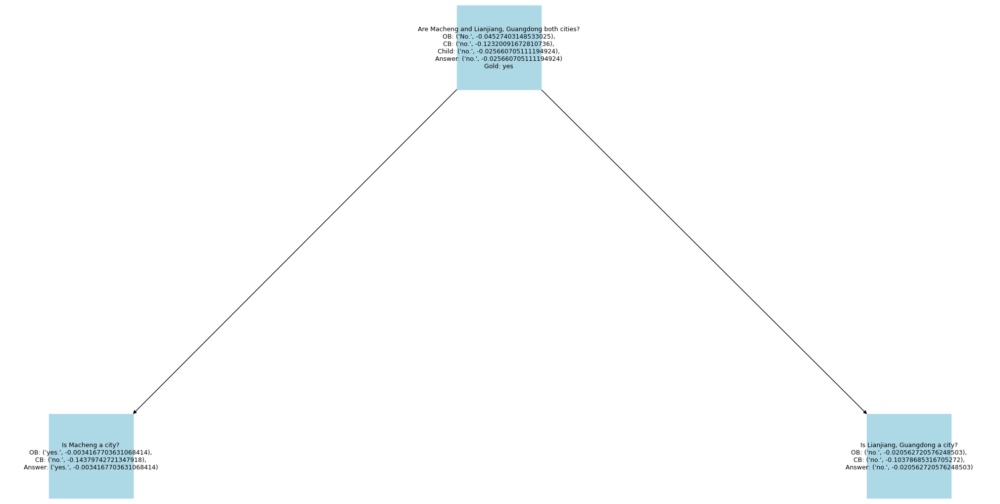

[["what country are Mudvayne and Hellyeah both from?\nOB: ('United States.', -0.06184323520617192),\nCB: ('United States.', -0.06159155628072079),\nChild: ('United States or America (both are referring to the same country).', -0.07531223888236109),\nAnswer: ('United States.', -0.06159155628072079)\nGold: American", "What country is Mudvayne from?\nOB: ('United States.', -0.1840688089373158),\nCB: ('United States.', -0.13395682778594364),\nAnswer: ('United States.', -0.13395682778594364)"], ["what country are Mudvayne and Hellyeah both from?\nOB: ('United States.', -0.06184323520617192),\nCB: ('United States.', -0.06159155628072079),\nChild: ('United States or America (both are referring to the same country).', -0.07531223888236109),\nAnswer: ('United States.', -0.06159155628072079)\nGold: American", "What country is Hellyeah from?\nOB: ('America.', -0.07201218604826999),\nCB: ('United States.', -0.19261074111639387),\nAnswer: ('America.', -0.07201218604826999)"]]


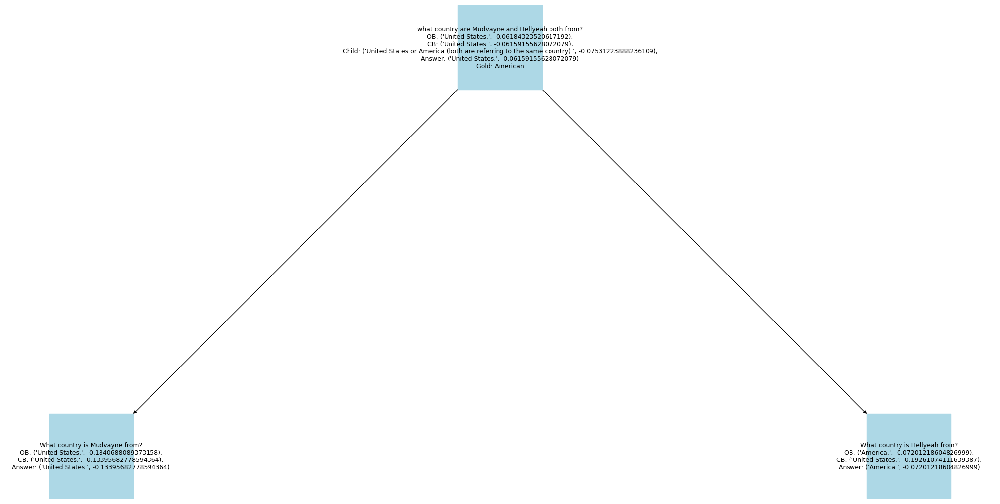

[['Which movie is loosley based off the Brother Grimm\'s "Iron Henry"?\nOB: (\'Unknown.\', -0.1345593194666359),\nCB: (\'Full Metal Jacket.\', -0.19658972200785765),\nChild: (\'The Frog Prince (1986 film).\', -0.08691495380746983),\nAnswer: (\'The Frog Prince (1986 film).\', -0.08691495380746983)\nGold: The Frog Prince', 'Which Brother Grimm\'s fairy tale is "Iron Henry"?\nOB: (\'The Frog Prince.\', -0.1490054978222557),\nCB: (\'The Frog Prince.\', -0.28909802394868184),\nAnswer: (\'The Frog Prince.\', -0.1490054978222557)'], ['Which movie is loosley based off the Brother Grimm\'s "Iron Henry"?\nOB: (\'Unknown.\', -0.1345593194666359),\nCB: (\'Full Metal Jacket.\', -0.19658972200785765),\nChild: (\'The Frog Prince (1986 film).\', -0.08691495380746983),\nAnswer: (\'The Frog Prince (1986 film).\', -0.08691495380746983)\nGold: The Frog Prince', "Which movie is loosley based off <1>?\nOB: ('The Frog Prince (1986 film).', -0.09178759791511217),\nCB: ('Enchanted.', -0.16031385061973785),\nAn

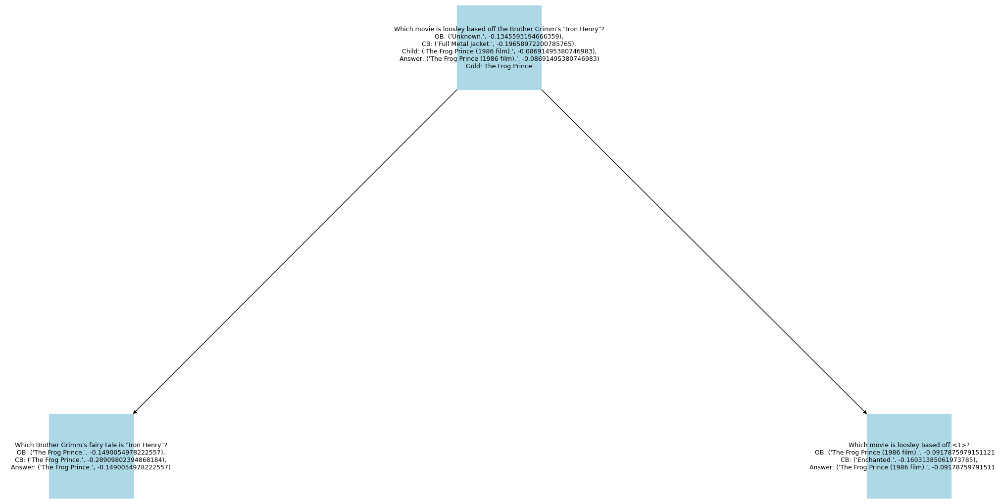

[["Which beverage is ignited prior to consumption, Flaming beverage or Blue Hawaii\nOB: ('Flaming beverage.', -0.033253760339817987),\nCB: ('Flaming beverage.', -0.10618737101260901),\nChild: ('Flaming beverage.', -0.08125538698723855),\nAnswer: ('Flaming beverage.', -0.033253760339817987)\nGold: Flaming beverages", "Is Flaming beverage ignited prior to consumption?\nOB: ('yes.', -0.08023273032677654),\nCB: ('yes.', -0.23369042908125373),\nAnswer: ('yes.', -0.08023273032677654)"], ["Which beverage is ignited prior to consumption, Flaming beverage or Blue Hawaii\nOB: ('Flaming beverage.', -0.033253760339817987),\nCB: ('Flaming beverage.', -0.10618737101260901),\nChild: ('Flaming beverage.', -0.08125538698723855),\nAnswer: ('Flaming beverage.', -0.033253760339817987)\nGold: Flaming beverages", "Is Blue Hawaii ignited prior to consumption?\nOB: ('no.', -0.253401727046375),\nCB: ('no.', -0.040332003742625334),\nAnswer: ('no.', -0.040332003742625334)"]]


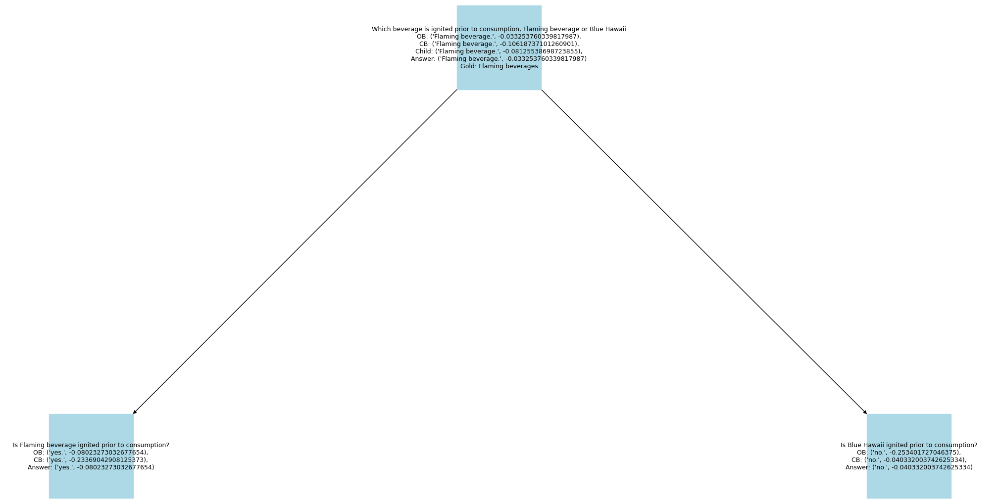

[['Orson Scott Card first published his short story "Killing Children" in this American science-fiction magazine whose first issue was published when?\nOB: (\'1930.\', -0.045347693792080805),\nCB: (\'October 1978.\', -0.030938806125973432),\nChild: (\'Analog Science Fiction and Fact, whose first issue was published in January 1930.\', -0.03326817020068862),\nAnswer: (\'October 1978.\', -0.030938806125973432)\nGold: 1930', 'In which American science-fiction magazine did Orson Scott Card first publish his short story "Killing Children"?\nOB: (\'Analog Science Fiction and Fact.\', -0.026892085741931995),\nCB: (\'Analog.\', -0.035465809408382724),\nAnswer: (\'Analog Science Fiction and Fact.\', -0.026892085741931995)'], ['Orson Scott Card first published his short story "Killing Children" in this American science-fiction magazine whose first issue was published when?\nOB: (\'1930.\', -0.045347693792080805),\nCB: (\'October 1978.\', -0.030938806125973432),\nChild: (\'Analog Science Fiction 

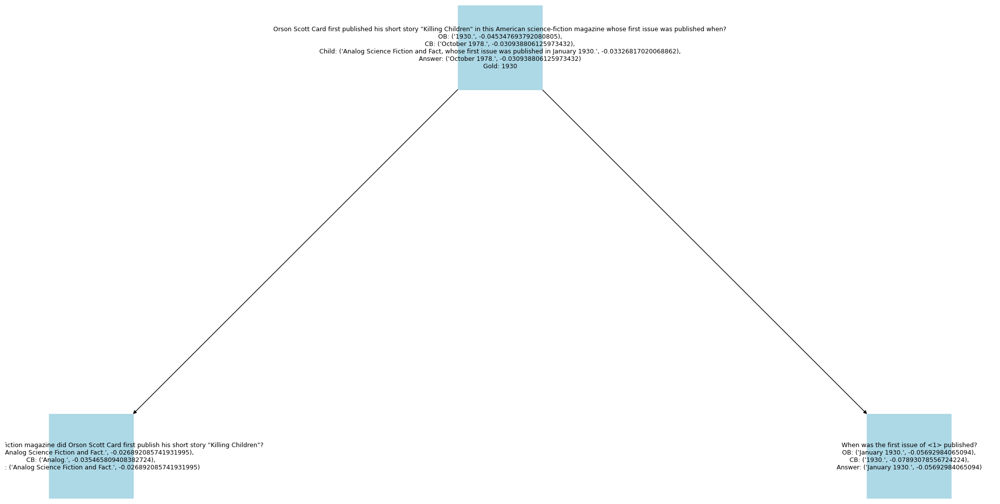

[["Typically how many pages were in the fiction magazine in which Robert E. Howard wrote in 1930s?\nOB: ('Unknown.', -100),\nCB: ('128.', -0.059305067408800365),\nChild: ('128.', -0.07382062009748265),\nAnswer: ('128.', -0.059305067408800365)\nGold: 128 pages", "In which fiction magazine did Robert E. Howard write in 1930s?\nOB: ('Weird Tales.', -0.056609919376126305),\nCB: ('Weird Tales.', -0.046348392483297224),\nAnswer: ('Weird Tales.', -0.046348392483297224)"], ["Typically how many pages were in the fiction magazine in which Robert E. Howard wrote in 1930s?\nOB: ('Unknown.', -100),\nCB: ('128.', -0.059305067408800365),\nChild: ('128.', -0.07382062009748265),\nAnswer: ('128.', -0.059305067408800365)\nGold: 128 pages", "Typically how many pages were in <1>?\nOB: ('Unknown.', -100),\nCB: ('128.', -0.15241830499214412),\nAnswer: ('128.', -0.15241830499214412)"]]


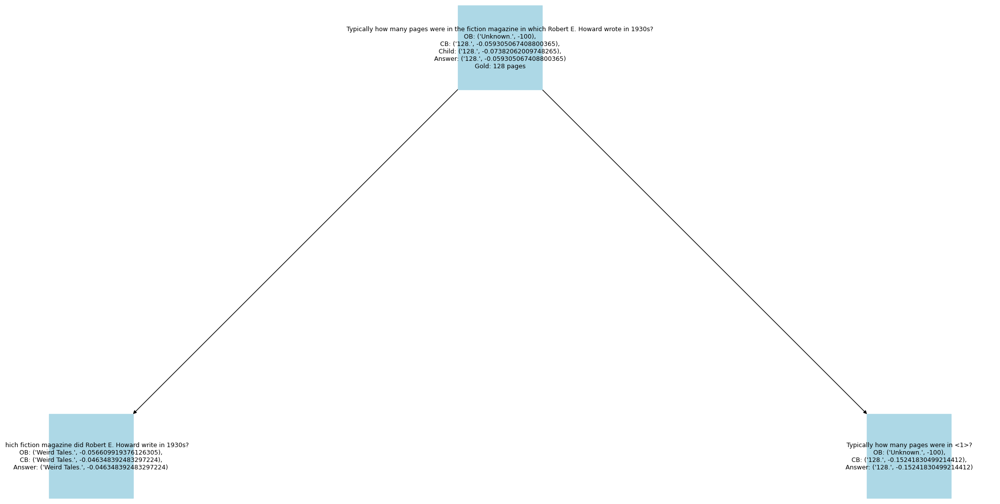

[["In 2009 the OCA announced major changes to it event lists, and in what city did this multi-sport event take place?\nOB: ('Unknown.', -0.12941738964332775),\nCB: ('Windsor, Ontario.', -0.12403137652736096),\nChild: ('Incheon, South Korea.', -0.07921308091618165),\nAnswer: ('Incheon, South Korea.', -0.07921308091618165)\nGold: New Delhi, India", "What multi-sport event did the OCA announce major changes to its event lists in 2009?\nOB: ('Asian Games.', -0.05117876257346),\nCB: ('Asian Games.', -0.060506334834164816),\nAnswer: ('Asian Games.', -0.05117876257346)"], ["In 2009 the OCA announced major changes to it event lists, and in what city did this multi-sport event take place?\nOB: ('Unknown.', -0.12941738964332775),\nCB: ('Windsor, Ontario.', -0.12403137652736096),\nChild: ('Incheon, South Korea.', -0.07921308091618165),\nAnswer: ('Incheon, South Korea.', -0.07921308091618165)\nGold: New Delhi, India", "In what city did <1> take place?\nOB: ('Kathmandu, Nepal.', -0.0274889695758587

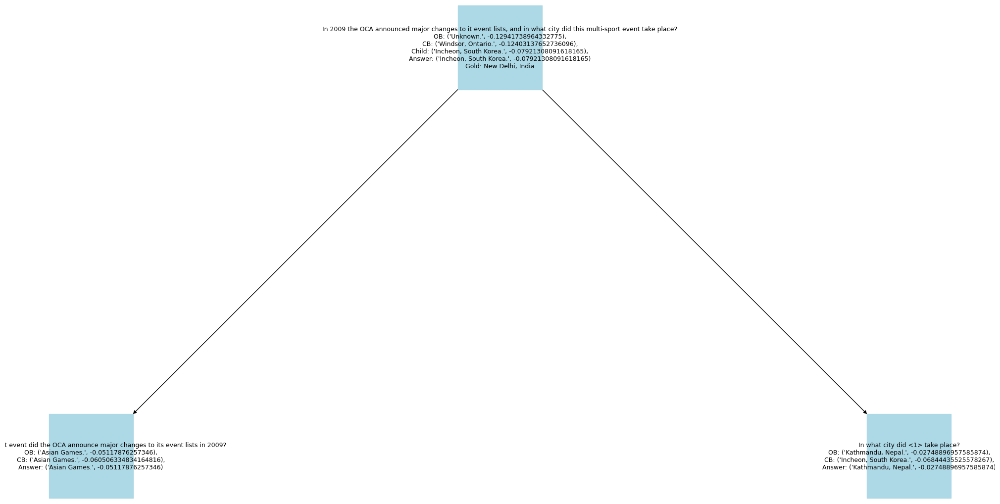

In [466]:
for parent_index in wrong_answers_indices:
    create_graph_to_problem(parent_index)

### Analyzing Correct answered examples

[['What event in 1920 was established by the director of the play "The Miracle"?\nOB: (\'Unknown.\', -100),\nCB: (\'Salzburg Festival.\', -0.04248591718358276),\nChild: (\'the Salzburg Festival.\', -0.047863765396011046),\nAnswer: (\'Salzburg Festival.\', -0.04248591718358276)\nGold: Salzburg Festival', 'Who is the director of the play "The Miracle"?\nOB: (\'Max Reinhardt.\', -0.03800551344900356),\nCB: (\'Patricia R. Floyd.\', -0.1311755750114016),\nAnswer: (\'Max Reinhardt.\', -0.03800551344900356)'], ['What event in 1920 was established by the director of the play "The Miracle"?\nOB: (\'Unknown.\', -100),\nCB: (\'Salzburg Festival.\', -0.04248591718358276),\nChild: (\'the Salzburg Festival.\', -0.047863765396011046),\nAnswer: (\'Salzburg Festival.\', -0.04248591718358276)\nGold: Salzburg Festival', "What event in 1920 was established by <1>?\nOB: ('the Salzburg Festival.', -0.04760411612831732),\nCB: ('Salzburg Festival.', -0.06381834916756529),\nAnswer: ('the Salzburg Festival.', -

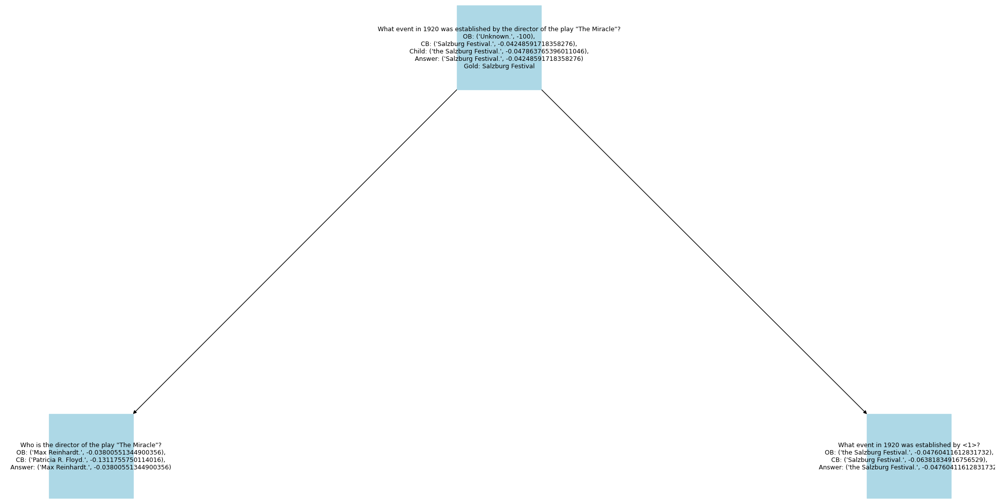

[["Are Catasetum and Origanum in the same family?\nOB: ('No.', -0.027247797653690453),\nCB: ('no.', -0.08009545427997912),\nChild: ('no.', -0.06731486561978668),\nAnswer: ('No.', -0.027247797653690453)\nGold: no", "What family is Catasetum in?\nOB: ('Orchidaceae.', -0.0333423615475095),\nCB: ('Orchidaceae.', -0.09167381531399364),\nAnswer: ('Orchidaceae.', -0.0333423615475095)"], ["Are Catasetum and Origanum in the same family?\nOB: ('No.', -0.027247797653690453),\nCB: ('no.', -0.08009545427997912),\nChild: ('no.', -0.06731486561978668),\nAnswer: ('No.', -0.027247797653690453)\nGold: no", "What family is Origanum in?\nOB: ('Lamiaceae.', -0.12145581800329168),\nCB: ('Lamiaceae.', -0.14880580225242337),\nAnswer: ('Lamiaceae.', -0.12145581800329168)"], ["Are Catasetum and Origanum in the same family?\nOB: ('No.', -0.027247797653690453),\nCB: ('no.', -0.08009545427997912),\nChild: ('no.', -0.06731486561978668),\nAnswer: ('No.', -0.027247797653690453)\nGold: no", "Are <1> and <2> the same?\

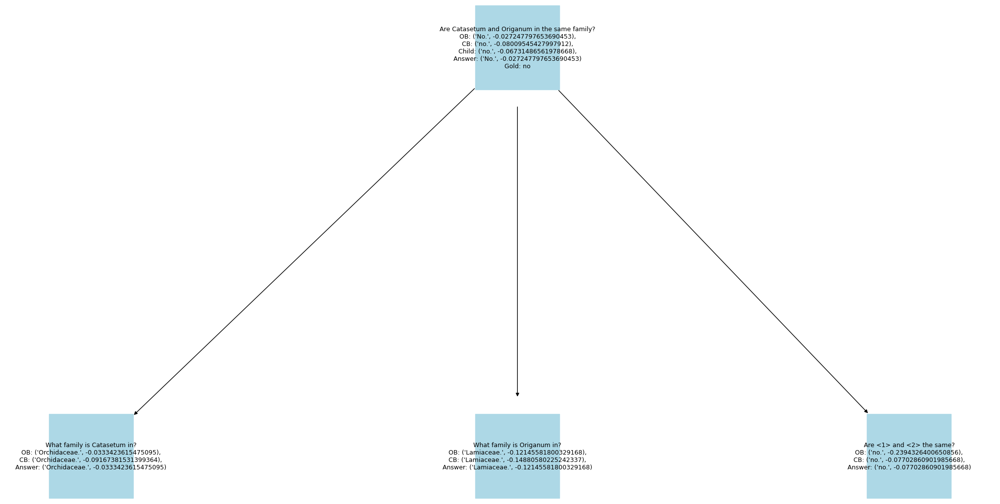

[["The 2015 Austrian thriller film Jack tells the story of a serial killer who died in what year?\nOB: ('1994.', -0.036205600987795926),\nCB: ('1994.', -0.00687133104286387),\nChild: ('1994.', -0.045694343343671284),\nAnswer: ('1994.', -0.00687133104286387)\nGold: 1994", "What serial killer is the 2015 Austrian thriller film Jack about?\nOB: ('Jack Unterweger.', -0.005834677618314119),\nCB: ('Jack Unterweger.', -0.031946155505015),\nAnswer: ('Jack Unterweger.', -0.005834677618314119)"], ["The 2015 Austrian thriller film Jack tells the story of a serial killer who died in what year?\nOB: ('1994.', -0.036205600987795926),\nCB: ('1994.', -0.00687133104286387),\nChild: ('1994.', -0.045694343343671284),\nAnswer: ('1994.', -0.00687133104286387)\nGold: 1994", "In what year did <1> die?\nOB: ('1994.', -0.07034847748985798),\nCB: ('1994.', -0.08703232399176668),\nAnswer: ('1994.', -0.07034847748985798)"]]


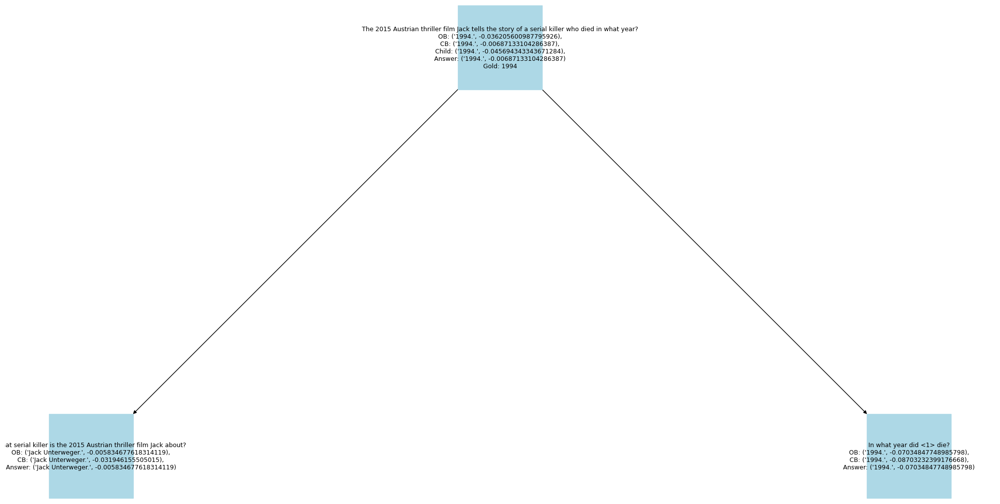

[["A guitar player called Noodles is a longtime member of which band, The Smashing Pumpkins or The Offspring?\nOB: ('Unknown.', -100),\nCB: ('The Offspring.', -0.16026235030897504),\nChild: ('The Offspring.', -0.0942985146796489),\nAnswer: ('The Offspring.', -0.0942985146796489)\nGold: The Offspring", "A guitar player called Noodles is a longtime member of which band?\nOB: ('The Offspring.', -0.516119928418),\nCB: ('The Offspring.', -0.1011168490371093),\nAnswer: ('The Offspring.', -0.1011168490371093)"], ["A guitar player called Noodles is a longtime member of which band, The Smashing Pumpkins or The Offspring?\nOB: ('Unknown.', -100),\nCB: ('The Offspring.', -0.16026235030897504),\nChild: ('The Offspring.', -0.0942985146796489),\nAnswer: ('The Offspring.', -0.0942985146796489)\nGold: The Offspring", 'Is it The Smashing Pumpkins or The Offspring?\nOB: (\'The Smashing Pumpkins.\', -0.09222602846215998),\nCB: ("Please provide the question you\'d like me to answer, and I\'ll respond in t

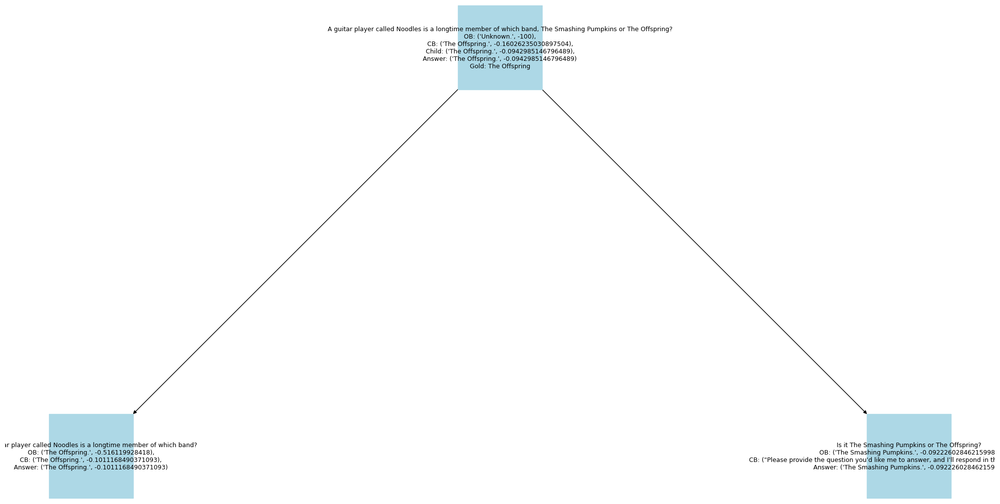

[["Which airport is located further north in the United States, San Angelo Regional Airport or Grand Junction Regional Airport?\nOB: ('Grand Junction Regional Airport.', -0.08954313066549582),\nCB: ('Grand Junction Regional Airport.', -0.1007169650575539),\nChild: ('Grand Junction Regional Airport.', -0.09661432685856519),\nAnswer: ('Grand Junction Regional Airport.', -0.08954313066549582)\nGold: Grand Junction Regional Airport", "Which latitude is San Angelo Regional Airport at?\nOB: ('Unknown.', -0.15556775049969812),\nCB: ('31.4333° N.', -0.09448367948019759),\nAnswer: ('31.4333° N.', -0.09448367948019759)"], ["Which airport is located further north in the United States, San Angelo Regional Airport or Grand Junction Regional Airport?\nOB: ('Grand Junction Regional Airport.', -0.08954313066549582),\nCB: ('Grand Junction Regional Airport.', -0.1007169650575539),\nChild: ('Grand Junction Regional Airport.', -0.09661432685856519),\nAnswer: ('Grand Junction Regional Airport.', -0.0895431

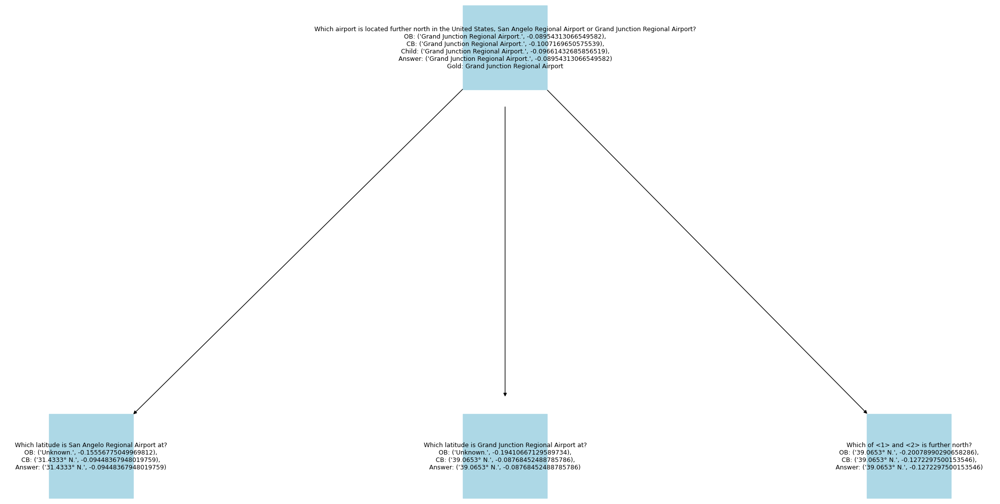

[["Are Steve Perry and Leslie West both singers?\nOB: ('Yes.', -0.047763551313947904),\nCB: ('yes.', -0.10048054569877723),\nChild: ('yes.', -0.11725538849894682),\nAnswer: ('Yes.', -0.047763551313947904)\nGold: yes", "Is Steve Perry a singer?\nOB: ('yes.', -0.19286855145),\nCB: ('yes.', -0.15085051365738822),\nAnswer: ('yes.', -0.15085051365738822)"], ["Are Steve Perry and Leslie West both singers?\nOB: ('Yes.', -0.047763551313947904),\nCB: ('yes.', -0.10048054569877723),\nChild: ('yes.', -0.11725538849894682),\nAnswer: ('Yes.', -0.047763551313947904)\nGold: yes", "Is Leslie West a singer?\nOB: ('yes.', -0.14234455821765127),\nCB: ('yes.', -0.20061656376294645),\nAnswer: ('yes.', -0.14234455821765127)"]]


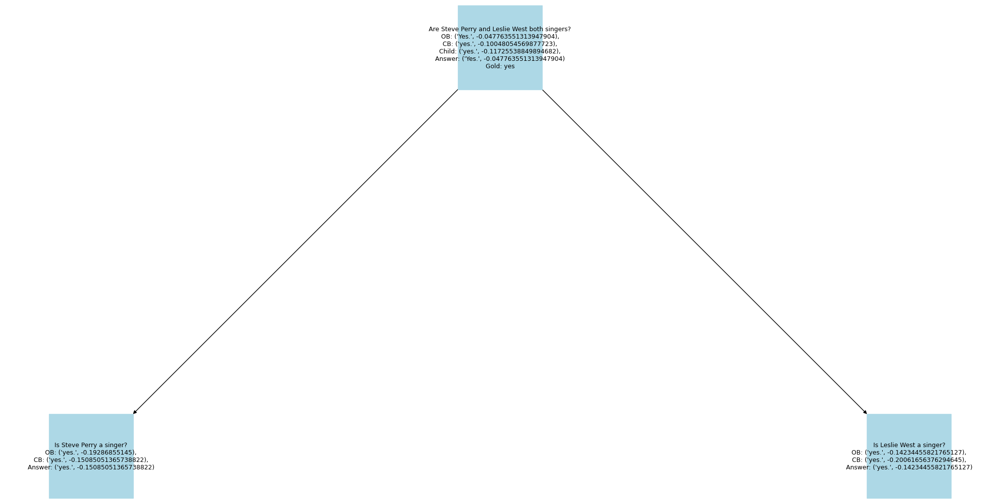

[['What pop band features an Argentine actress that appeared in the television series "Chiquititas"?\nOB: (\'Unknown.\', -0.05600307202665757),\nCB: (\'Erreway.\', -0.054727510156278976),\nChild: (\'Erreway.\', -0.031104281473562836),\nAnswer: (\'Erreway.\', -0.031104281473562836)\nGold: Erreway', 'Which Argentine actress appeared in the television series "Chiquititas"?\nOB: (\'Luisana Lopilato, Nadia Di Cello, and Marcela Kloosterboer.\', -0.06260540719039094),\nCB: (\'Romina Yan.\', -0.19152201835072086),\nAnswer: (\'Luisana Lopilato, Nadia Di Cello, and Marcela Kloosterboer.\', -0.06260540719039094)'], ['What pop band features an Argentine actress that appeared in the television series "Chiquititas"?\nOB: (\'Unknown.\', -0.05600307202665757),\nCB: (\'Erreway.\', -0.054727510156278976),\nChild: (\'Erreway.\', -0.031104281473562836),\nAnswer: (\'Erreway.\', -0.031104281473562836)\nGold: Erreway', "What pop band features <1>?\nOB: ('Erreway.', -0.17960907161810818),\nCB: ('Erreway.', -

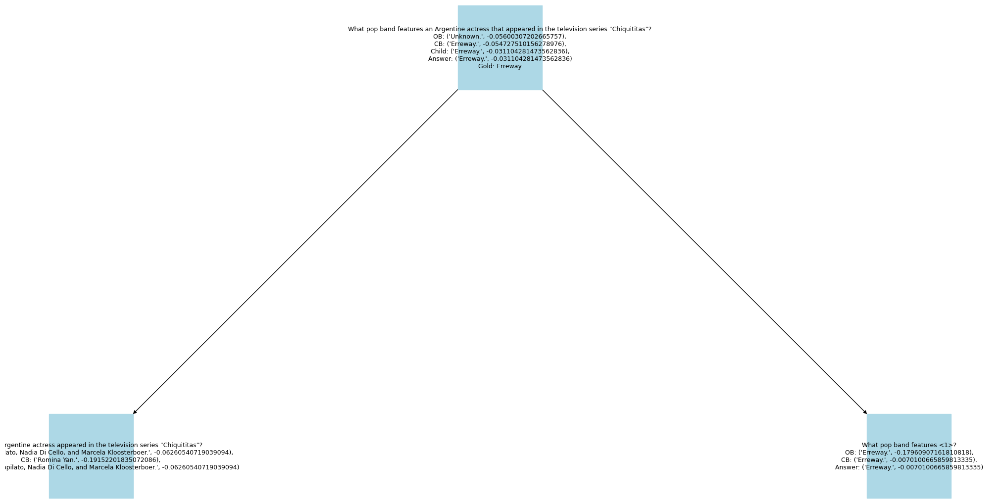

[["In what city did the 1959 William & Mary Indians football team lose against the #13 Naval Academy?\nOB: ('Annapolis.', -0.1269246234476893),\nCB: ('Annapolis, Maryland.', -0.06041394195704),\nChild: ('Annapolis, Maryland.', -0.03983669052980819),\nAnswer: ('Annapolis, Maryland.', -0.03983669052980819)\nGold: Annapolis, Maryland", "In which city did the 1959 William & Mary Indians football team play against the #13 Naval Academy?\nOB: ('Annapolis, Maryland.', -0.08438543151526973),\nCB: ('Annapolis, Maryland.', -0.021000613605257498),\nAnswer: ('Annapolis, Maryland.', -0.021000613605257498)"], ["In what city did the 1959 William & Mary Indians football team lose against the #13 Naval Academy?\nOB: ('Annapolis.', -0.1269246234476893),\nCB: ('Annapolis, Maryland.', -0.06041394195704),\nChild: ('Annapolis, Maryland.', -0.03983669052980819),\nAnswer: ('Annapolis, Maryland.', -0.03983669052980819)\nGold: Annapolis, Maryland", "Where did the 1959 William & Mary Indians football team lose a

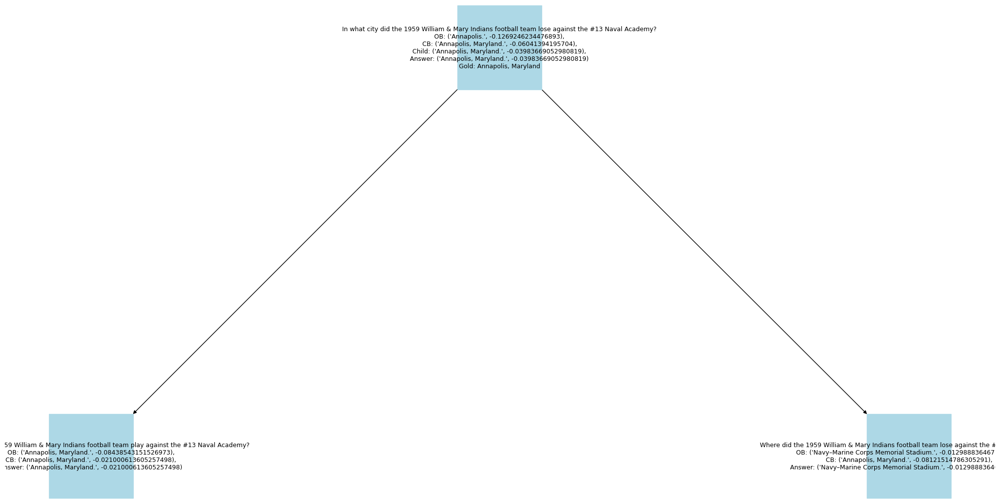

[["The 2005 film Remedy featured Frank Vincent from The Sopranos and several mob movies by which acclaimed director?\nOB: ('Martin Scorsese.', -0.08049944377857772),\nCB: ('Shawn Flanagan.', -0.09337719437968572),\nChild: ('Unknown.', -0.07328975025006944),\nAnswer: ('Martin Scorsese.', -0.08049944377857772)\nGold: Martin Scorsese", "The 2005 film Remedy featured Frank Vincent from The Sopranos and several mob movies by which director?\nOB: ('Martin Scorsese.', -0.00857928163235346),\nCB: ('Christian Maelen.', -0.13599947377149865),\nAnswer: ('Martin Scorsese.', -0.00857928163235346)"], ["The 2005 film Remedy featured Frank Vincent from The Sopranos and several mob movies by which acclaimed director?\nOB: ('Martin Scorsese.', -0.08049944377857772),\nCB: ('Shawn Flanagan.', -0.09337719437968572),\nChild: ('Unknown.', -0.07328975025006944),\nAnswer: ('Martin Scorsese.', -0.08049944377857772)\nGold: Martin Scorsese", "Which director is acclaimed?\nOB: ('Michael Schultz.', -0.1745218385292

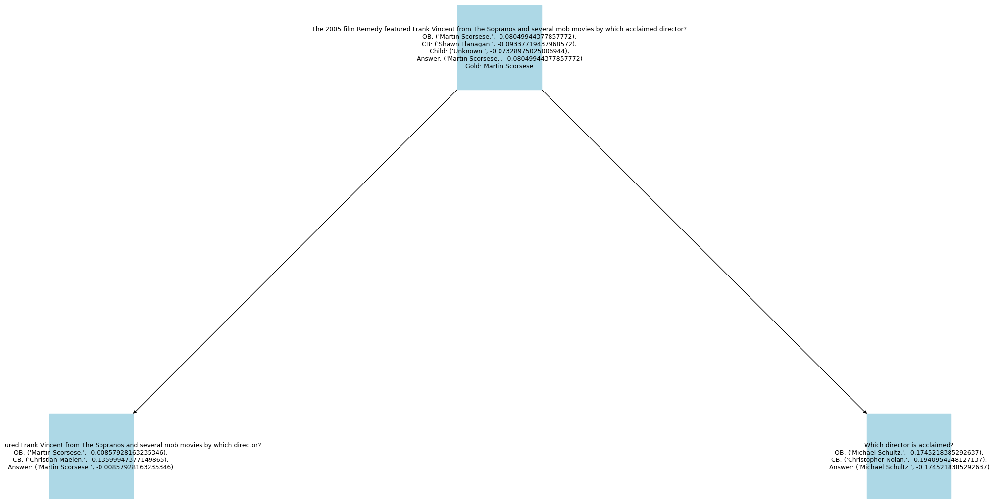

[["What is the city in which Bauerfield International Ariport is based out of?\nOB: ('Unknown.', -100),\nCB: ('Port Vila.', -0.08062747619704792),\nChild: ('Port Vila.', -0.07554848455475052),\nAnswer: ('Port Vila.', -0.07554848455475052)\nGold: Port Vila", "Where is Bauerfield International Ariport based out of?\nOB: ('Port Vila, Vanuatu.', -0.009045441869693333),\nCB: ('Port Vila.', -0.1352459658770561),\nAnswer: ('Port Vila, Vanuatu.', -0.009045441869693333)"], ["What is the city in which Bauerfield International Ariport is based out of?\nOB: ('Unknown.', -100),\nCB: ('Port Vila.', -0.08062747619704792),\nChild: ('Port Vila.', -0.07554848455475052),\nAnswer: ('Port Vila.', -0.07554848455475052)\nGold: Port Vila", "What is the city of <1>?\nOB: ('capital.', -0.15382387769751715),\nCB: ('capital.', -0.19625772791716142),\nAnswer: ('capital.', -0.15382387769751715)"]]


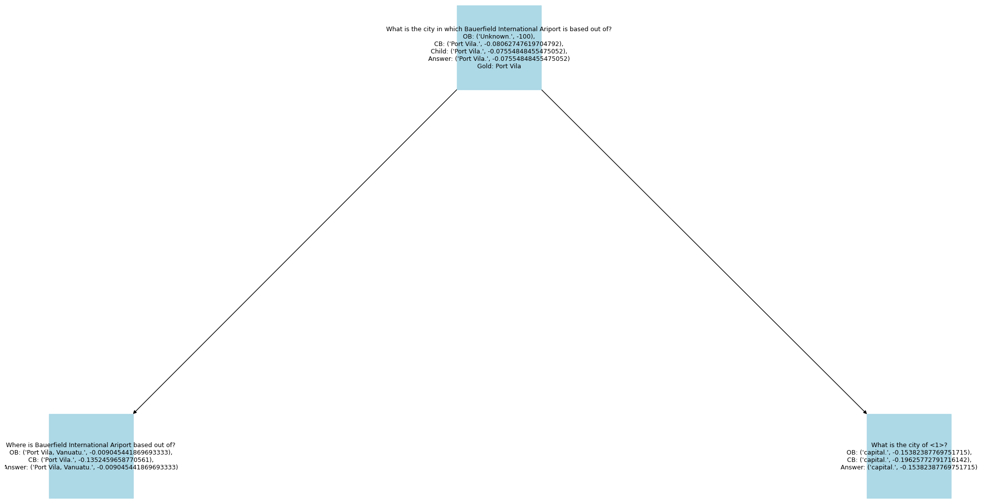

[["What is the name of the movie that stars Katrina Bowden and was directed by Sean Anders?\nOB: ('Sex Drive.', -0.02897147571247353),\nCB: ('The Killing of John Lennon.', -0.09160037267688238),\nChild: ('Unknown.', -0.06406648816823196),\nAnswer: ('Sex Drive.', -0.02897147571247353)\nGold: Sex Drive", "What is the name of the movie that stars Katrina Bowden?\nOB: ('Hard Sell.', -0.08542654777091453),\nCB: ('Tucker & Dale vs Evil.', -0.0878451214254543),\nAnswer: ('Hard Sell.', -0.08542654777091453)"], ["What is the name of the movie that stars Katrina Bowden and was directed by Sean Anders?\nOB: ('Sex Drive.', -0.02897147571247353),\nCB: ('The Killing of John Lennon.', -0.09160037267688238),\nChild: ('Unknown.', -0.06406648816823196),\nAnswer: ('Sex Drive.', -0.02897147571247353)\nGold: Sex Drive", "Who directed the movie that stars Katrina Bowden and was directed by <1>?\nOB: ('Sean Nalaboff.', -0.05031569978759272),\nCB: ('Sean Nalaboff.', -0.03750294881982786),\nAnswer: ('Sean Nala

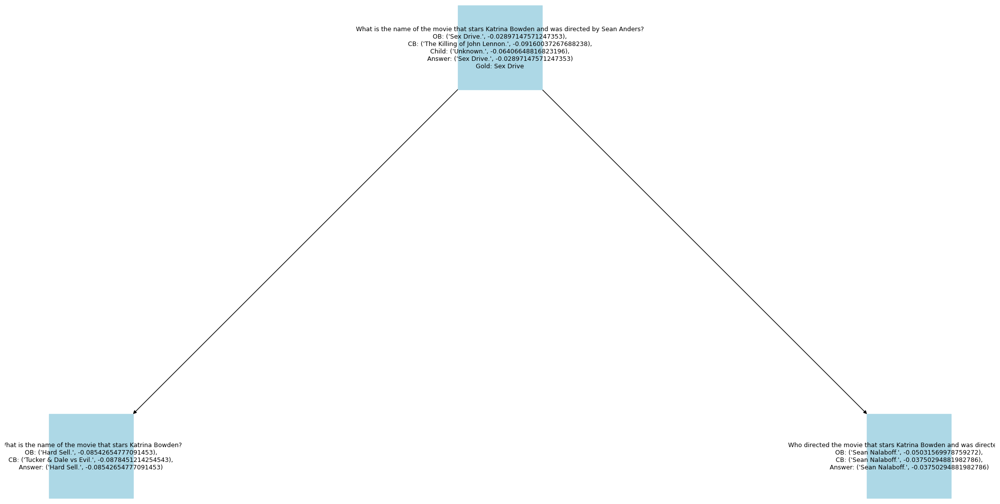

[["Based on a True Story... is an album by which country music star, with the single My Eyes?\nOB: ('Blake Shelton.', -0.039760544066898565),\nCB: ('Blake Shelton.', -0.1342394967588026),\nChild: ('Blake Shelton.', -0.08329737968200925),\nAnswer: ('Blake Shelton.', -0.039760544066898565)\nGold: Blake Shelton", "Which country music star has an album Based on a True Story...?\nOB: ('Blake Shelton.', -0.053481247135242216),\nCB: ('Blake Shelton.', -0.03404353733265056),\nAnswer: ('Blake Shelton.', -0.03404353733265056)"], ["Based on a True Story... is an album by which country music star, with the single My Eyes?\nOB: ('Blake Shelton.', -0.039760544066898565),\nCB: ('Blake Shelton.', -0.1342394967588026),\nChild: ('Blake Shelton.', -0.08329737968200925),\nAnswer: ('Blake Shelton.', -0.039760544066898565)\nGold: Blake Shelton", 'Which single is on the album Based on a True Story... by <1>?\nOB: ("Doin\' What She Likes.", -0.10581635970962477),\nCB: (\'God Gave Me You.\', -0.087622103135281

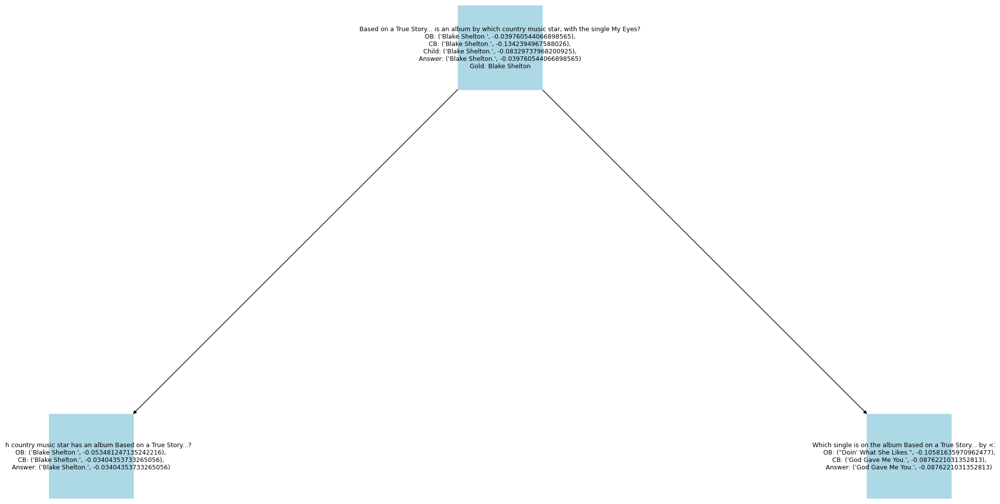

[["How large of the area is the nature reserve south of Seacroft Esplanade?\nOB: ('Unknown.', -0.0856979910549987),\nCB: ('5 hectares.', -0.1553930579894717),\nChild: ('4.3 km2.', -0.04878260448176856),\nAnswer: ('4.3 km2.', -0.04878260448176856)\nGold: 4.3 km2", "Which nature reserve is south of Seacroft Esplanade?\nOB: ('Gibraltar Point.', -0.01360304390546667),\nCB: ('Humberstone Local Nature Reserve.', -0.12330422903870471),\nAnswer: ('Gibraltar Point.', -0.01360304390546667)"], ["How large of the area is the nature reserve south of Seacroft Esplanade?\nOB: ('Unknown.', -0.0856979910549987),\nCB: ('5 hectares.', -0.1553930579894717),\nChild: ('4.3 km2.', -0.04878260448176856),\nAnswer: ('4.3 km2.', -0.04878260448176856)\nGold: 4.3 km2", "How large of the area is <1>?\nOB: ('4.3 km2.', -0.07590552601104295),\nCB: ('1.5 square kilometers.', -0.2785475375118058),\nAnswer: ('4.3 km2.', -0.07590552601104295)"]]


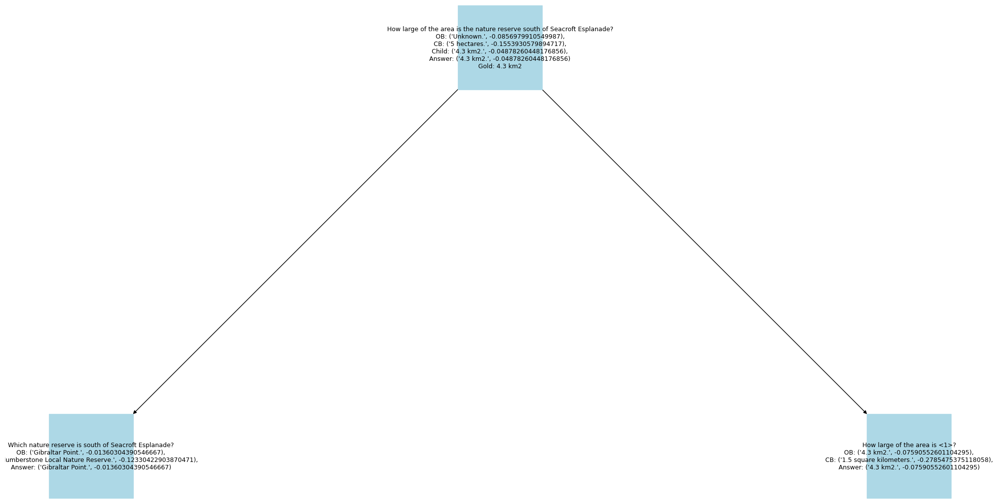

[["Luke Rockhold defeated the MMA fighter who was the first to earn a win against which champion in the UFC?\nOB: ('Luke Rockhold.', -0.16965587202027332),\nCB: ('Royce Gracie.', -0.131870209782267),\nChild: ('Anderson Silva.', -0.06823785261876382),\nAnswer: ('Anderson Silva.', -0.06823785261876382)\nGold: Anderson Silva", 'Who was the first to earn a win against which champion in the UFC?\nOB: (\'Michael Bisping.\', -0.0760838899910143),\nCB: ("Please provide the question you\'d like me to answer, and I\'ll respond in the same format.", -100),\nAnswer: (\'Michael Bisping.\', -0.0760838899910143)'], ["Luke Rockhold defeated the MMA fighter who was the first to earn a win against which champion in the UFC?\nOB: ('Luke Rockhold.', -0.16965587202027332),\nCB: ('Royce Gracie.', -0.131870209782267),\nChild: ('Anderson Silva.', -0.06823785261876382),\nAnswer: ('Anderson Silva.', -0.06823785261876382)\nGold: Anderson Silva", "Luke Rockhold defeated the MMA fighter who was <1>?\nOB: ('no.', -

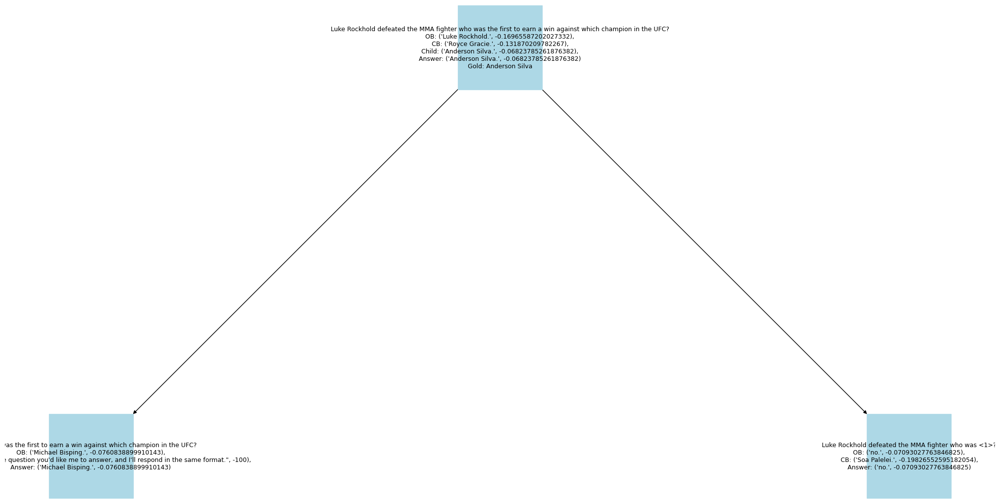

[["Which genus's family comes first alphabetically, Crepis or Isatis?\nOB: ('Crepis.', -0.06680034295863332),\nCB: ('Brassicaceae.', -0.1251906346497537),\nChild: ('Crepis.', -0.042293041906779266),\nAnswer: ('Crepis.', -0.042293041906779266)\nGold: Crepis", "What is the family of Crepis?\nOB: ('Asteraceae.', -0.03011548546351111),\nCB: ('Asteraceae.', -0.22564804550099551),\nAnswer: ('Asteraceae.', -0.03011548546351111)"], ["Which genus's family comes first alphabetically, Crepis or Isatis?\nOB: ('Crepis.', -0.06680034295863332),\nCB: ('Brassicaceae.', -0.1251906346497537),\nChild: ('Crepis.', -0.042293041906779266),\nAnswer: ('Crepis.', -0.042293041906779266)\nGold: Crepis", "What is the family of Isatis?\nOB: ('Brassicaceae.', -0.009140539178667001),\nCB: ('Brassicaceae.', -0.12766310689307808),\nAnswer: ('Brassicaceae.', -0.009140539178667001)"], ["Which genus's family comes first alphabetically, Crepis or Isatis?\nOB: ('Crepis.', -0.06680034295863332),\nCB: ('Brassicaceae.', -0.12

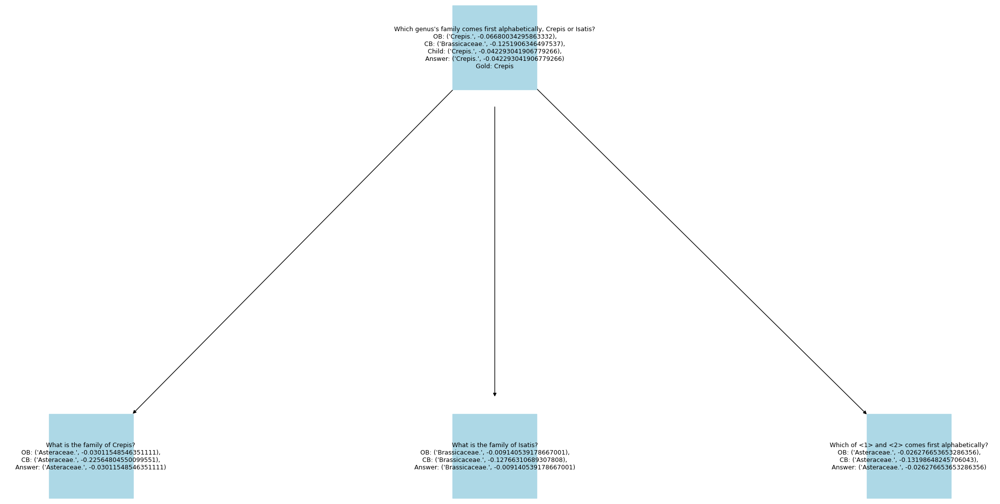

[['C. Bernard Jackson founded the center that started the career of which actor, who played the part of Marty Castillo in "Miami Vice"?\nOB: (\'Edward James Olmos.\', -0.09636108300151176),\nCB: (\'Saundra Santiago.\', -0.04117063817110999),\nChild: (\'Edward James Olmos.\', -0.018481325314784646),\nAnswer: (\'Edward James Olmos.\', -0.018481325314784646)\nGold: Edward James Olmos', "C. Bernard Jackson founded the center that started the career of which actor?\nOB: ('Forest Whitaker.', -0.015091980539988335),\nCB: ('Ossie Davis.', -0.0239557573809475),\nAnswer: ('Forest Whitaker.', -0.015091980539988335)"], ['C. Bernard Jackson founded the center that started the career of which actor, who played the part of Marty Castillo in "Miami Vice"?\nOB: (\'Edward James Olmos.\', -0.09636108300151176),\nCB: (\'Saundra Santiago.\', -0.04117063817110999),\nChild: (\'Edward James Olmos.\', -0.018481325314784646),\nAnswer: (\'Edward James Olmos.\', -0.018481325314784646)\nGold: Edward James Olmos', 

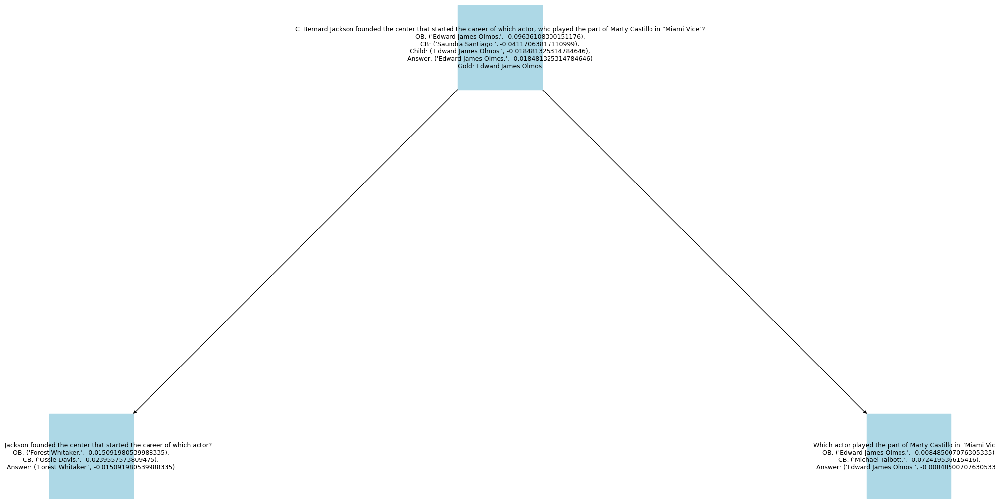

[["Stephen susco wrote a movie produced by which american film actor?\nOB: ('Sam Raimi.', -0.07507493546066349),\nCB: ('Scott Rudin.', -0.16395187424569568),\nChild: ('Jason Blum.', -0.07538654697885418),\nAnswer: ('Sam Raimi.', -0.07507493546066349)\nGold: Sam Raimi", "Who is the american film actor that produced the movie written by Stephen susco?\nOB: ('Sam Raimi.', -0.1409860408945716),\nCB: ('Jason Blum.', -0.07468061452680849),\nAnswer: ('Jason Blum.', -0.07468061452680849)"], ["Stephen susco wrote a movie produced by which american film actor?\nOB: ('Sam Raimi.', -0.07507493546066349),\nCB: ('Scott Rudin.', -0.16395187424569568),\nChild: ('Jason Blum.', -0.07538654697885418),\nAnswer: ('Sam Raimi.', -0.07507493546066349)\nGold: Sam Raimi", "Which movie was written by Stephen susco?\nOB: ('Beyond the Reach.', -0.06468259432319427),\nCB: ('Unfriended.', -0.04828180666710461),\nAnswer: ('Unfriended.', -0.04828180666710461)"]]


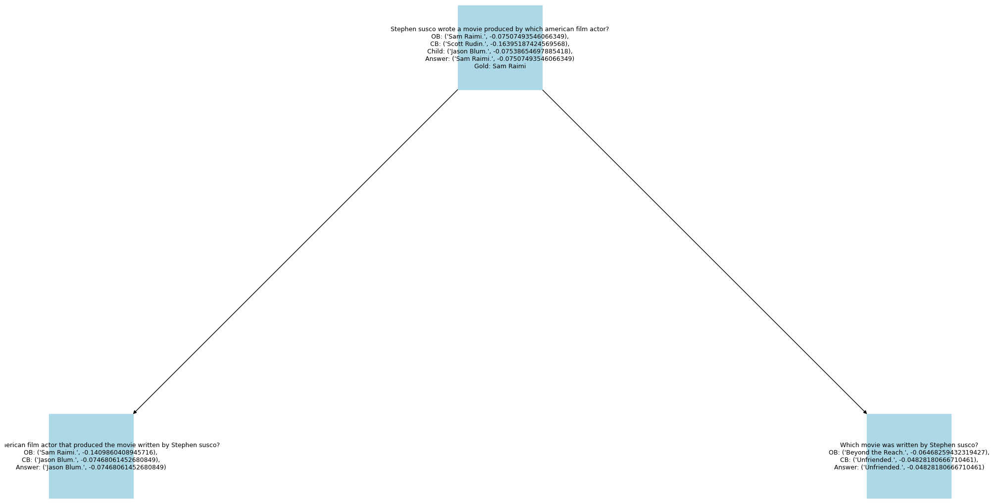

[["Who starred in My Dog Skip and Malcolm in the Middle?\nOB: ('Frankie Muniz.', -0.10378259511372237),\nCB: ('Frankie Muniz.', -0.07152444490297999),\nChild: ('Frankie Muniz.', -0.07128221040894266),\nAnswer: ('Frankie Muniz.', -0.07128221040894266)\nGold: Frankie Muniz", "Who starred in My Dog Skip?\nOB: ('Frankie Muniz.', -0.18448599717623002),\nCB: ('Frankie Muniz.', -0.13302701051808555),\nAnswer: ('Frankie Muniz.', -0.13302701051808555)"], ["Who starred in My Dog Skip and Malcolm in the Middle?\nOB: ('Frankie Muniz.', -0.10378259511372237),\nCB: ('Frankie Muniz.', -0.07152444490297999),\nChild: ('Frankie Muniz.', -0.07128221040894266),\nAnswer: ('Frankie Muniz.', -0.07128221040894266)\nGold: Frankie Muniz", "Who starred in Malcolm in the Middle?\nOB: ('Unknown.', -0.17120720984225554),\nCB: ('Frankie Muniz, Bryan Cranston, Jane Kaczmarek, Christopher Kennedy Masterson, and Erik Per Sullivan.', -0.10042098407773353),\nAnswer: ('Frankie Muniz, Bryan Cranston, Jane Kaczmarek, Christ

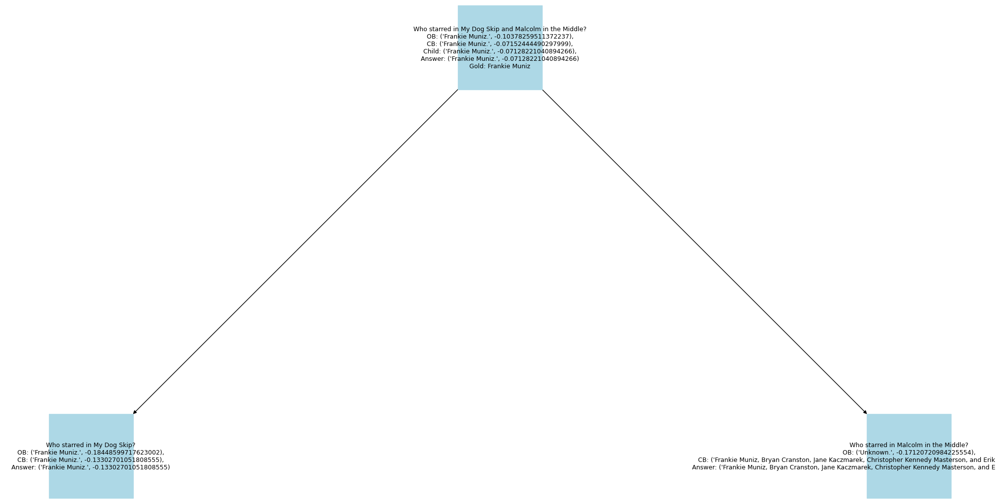

[["In the 1962 German Grand Prix, a racer came second. What did this racer found?\nOB: ('Unknown.', -100),\nCB: ('the McLaren team.', -0.1700422139861626),\nChild: ('Surtees Racing Organisation team.', -0.047881281084444435),\nAnswer: ('Surtees Racing Organisation team.', -0.047881281084444435)\nGold: Surtees Racing Organisation team", "Who came second in the 1962 German Grand Prix?\nOB: ('John Surtees.', -0.10302807217667001),\nCB: ('John Surtees.', -0.09859238381921025),\nAnswer: ('John Surtees.', -0.09859238381921025)"], ["In the 1962 German Grand Prix, a racer came second. What did this racer found?\nOB: ('Unknown.', -100),\nCB: ('the McLaren team.', -0.1700422139861626),\nChild: ('Surtees Racing Organisation team.', -0.047881281084444435),\nAnswer: ('Surtees Racing Organisation team.', -0.047881281084444435)\nGold: Surtees Racing Organisation team", "What did <1> found?\nOB: ('Surtees Racing Organisation team.', -0.023375663313744546),\nCB: ('Surtees Racing Team.', -0.267313361455

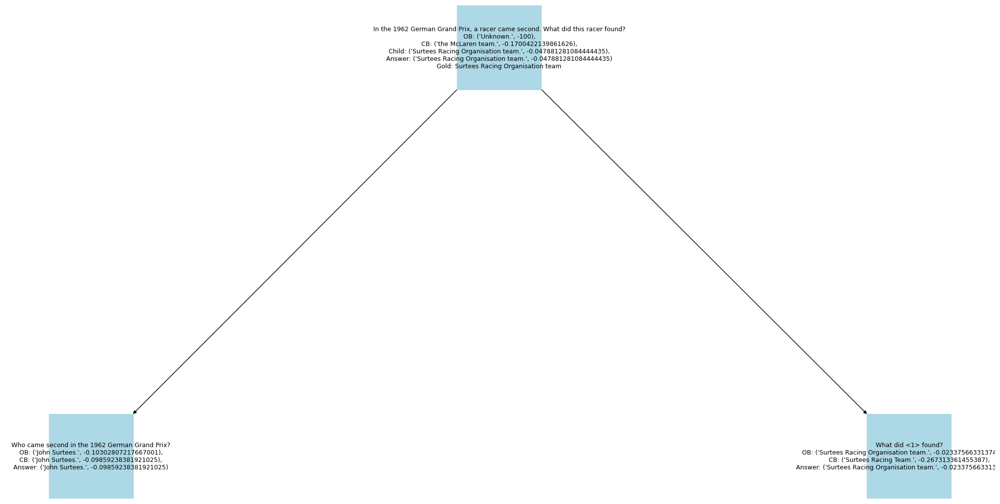

[["Chandgi Ram won a gold medal in 1970 in a continental multi-sport event held at which city ?\nOB: ('Unknown.', -0.16417711618289266),\nCB: ('Bangkok.', -0.08027610055516657),\nChild: ('Bangkok.', -0.04310069217613016),\nAnswer: ('Bangkok.', -0.04310069217613016)\nGold: Bangkok", "In which year did Chandgi Ram win a gold medal in a continental multi-sport event?\nOB: ('1970.', -0.03514386714062938),\nCB: ('1970.', -0.12396905066215679),\nAnswer: ('1970.', -0.03514386714062938)"], ["Chandgi Ram won a gold medal in 1970 in a continental multi-sport event held at which city ?\nOB: ('Unknown.', -0.16417711618289266),\nCB: ('Bangkok.', -0.08027610055516657),\nChild: ('Bangkok.', -0.04310069217613016),\nAnswer: ('Bangkok.', -0.04310069217613016)\nGold: Bangkok", "In which city was the continental multi-sport event held where Chandgi Ram won a gold medal in <1>?\nOB: ('Mexico City, Mexico.', -0.09241698920151825),\nCB: ('Bangkok.', -0.049595089763004654),\nAnswer: ('Bangkok.', -0.0495950897

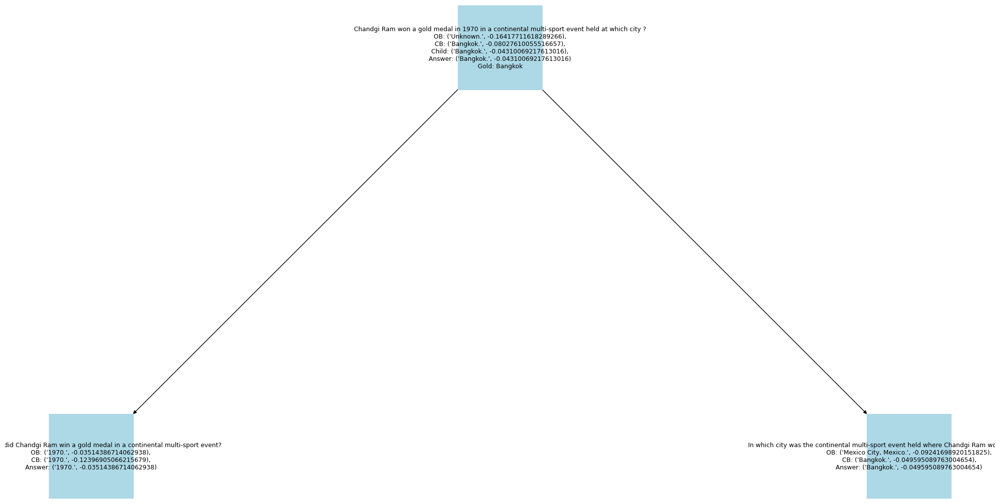

[["Which film was released first, Home on the Range or Pete's Dragon?\nOB: ('Home on the Range.', -0.02174894788693075),\nCB: ('Home on the Range.', -0.12132604718379356),\nChild: ('Home on the Range.', -0.06674836816232649),\nAnswer: ('Home on the Range.', -0.02174894788693075)\nGold: Home on the Range", "When was Home on the Range released?\nOB: ('Unknown.', -0.14586806675327474),\nCB: ('1995.', -0.1423218151814716),\nAnswer: ('1995.', -0.1423218151814716)"], ["Which film was released first, Home on the Range or Pete's Dragon?\nOB: ('Home on the Range.', -0.02174894788693075),\nCB: ('Home on the Range.', -0.12132604718379356),\nChild: ('Home on the Range.', -0.06674836816232649),\nAnswer: ('Home on the Range.', -0.02174894788693075)\nGold: Home on the Range", "When was Pete's Dragon released?\nOB: ('1977 or 2016.', -0.10082342347514918),\nCB: ('2016.', -0.08587187490565269),\nAnswer: ('2016.', -0.08587187490565269)"]]


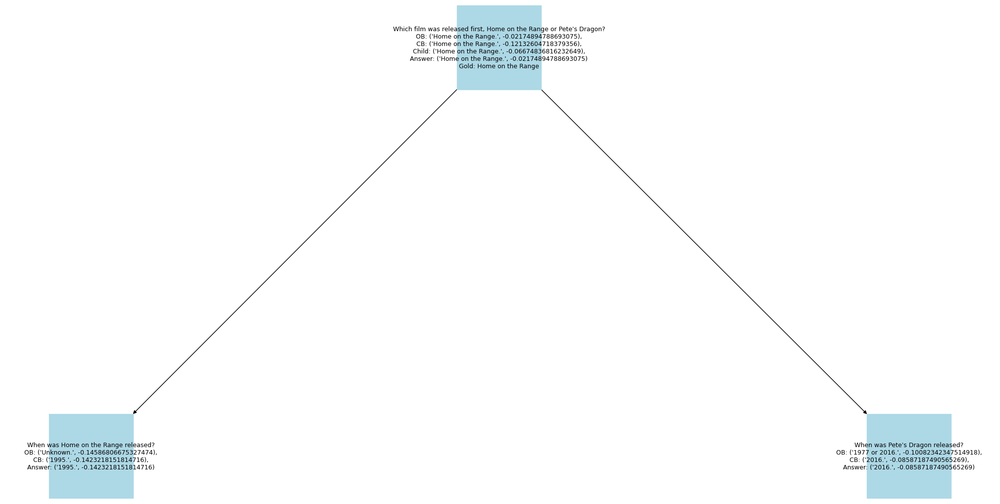

[["Who was born first, Umar Israilov or Ramzan Kadyrov?\nOB: ('Ramzan Kadyrov.', -0.03230385827361675),\nCB: ('Ramzan Kadyrov.', -0.0759278951645215),\nChild: ('Ramzan Kadyrov.', -0.0544941834431903),\nAnswer: ('Ramzan Kadyrov.', -0.03230385827361675)\nGold: Ramzan Kadyrov", "When was Umar Israilov born?\nOB: ('circa 1982.', -0.12371423423287428),\nCB: ('1976.', -0.18231290377588003),\nAnswer: ('circa 1982.', -0.12371423423287428)"], ["Who was born first, Umar Israilov or Ramzan Kadyrov?\nOB: ('Ramzan Kadyrov.', -0.03230385827361675),\nCB: ('Ramzan Kadyrov.', -0.0759278951645215),\nChild: ('Ramzan Kadyrov.', -0.0544941834431903),\nAnswer: ('Ramzan Kadyrov.', -0.03230385827361675)\nGold: Ramzan Kadyrov", "When was Ramzan Kadyrov born?\nOB: ('5 October 1976.', -0.007480255730401333),\nCB: ('October 5, 1976.', -0.08848037996721224),\nAnswer: ('5 October 1976.', -0.007480255730401333)"]]


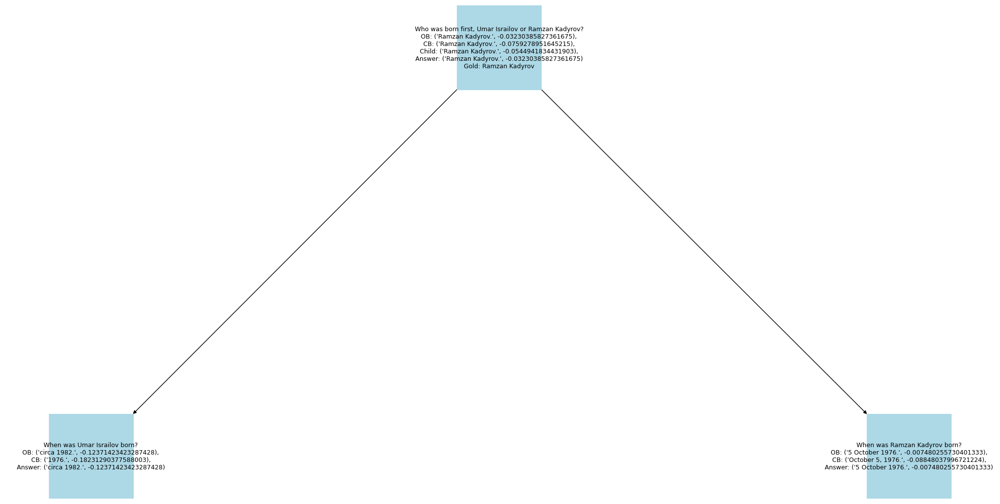

[["Emily Beecham is best known for her role in a televsion series whose second season premiered on what date?\nOB: ('September 22, 2003.', -0.10047244506920773),\nCB: ('March 19, 2017.', -0.017356663173555133),\nChild: ('March 19, 2017.', -0.02851971700948808),\nAnswer: ('March 19, 2017.', -0.017356663173555133)\nGold: March 19, 2017", 'Emily Beecham is best known for her role in which televsion series?\nOB: (\'"Into the Badlands".\', -0.025883038832100948),\nCB: (\'Furious Earth.\', -0.2831008107689672),\nAnswer: (\'"Into the Badlands".\', -0.025883038832100948)'], ["Emily Beecham is best known for her role in a televsion series whose second season premiered on what date?\nOB: ('September 22, 2003.', -0.10047244506920773),\nCB: ('March 19, 2017.', -0.017356663173555133),\nChild: ('March 19, 2017.', -0.02851971700948808),\nAnswer: ('March 19, 2017.', -0.017356663173555133)\nGold: March 19, 2017", "When did the second season of <1> premiere?\nOB: ('March 19, 2017.', -0.008001059258289),

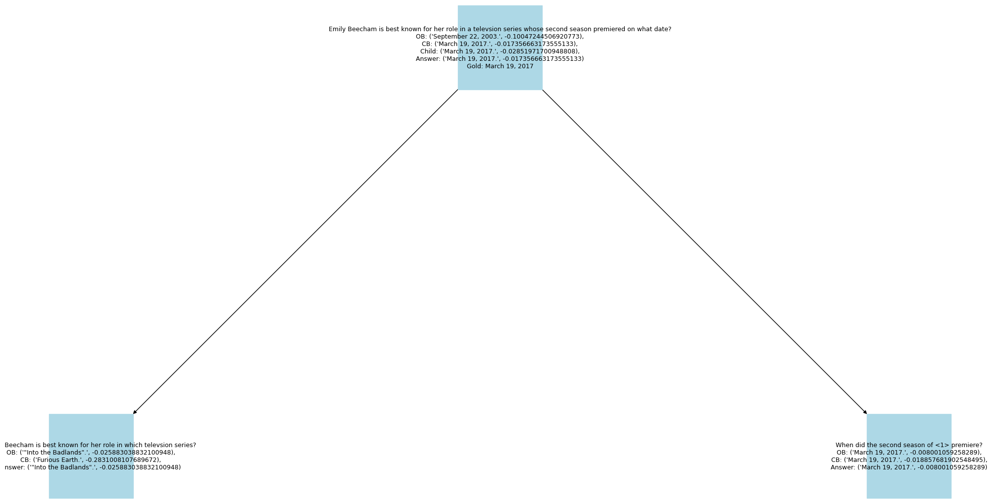

[["What was the capital of India when the Taj Mahal was commissioned?\nOB: ('Unknown.', -0.12313840299603106),\nCB: ('Agra.', -0.03694458934471387),\nChild: ('New Delhi.', -0.08566644433187533),\nAnswer: ('Agra.', -0.03694458934471387)\nGold: Agra", "What was the capital of India?\nOB: ('Unknown.', -0.15215148246735574),\nCB: ('New Delhi.', -0.091896623716375),\nAnswer: ('New Delhi.', -0.091896623716375)"], ["What was the capital of India when the Taj Mahal was commissioned?\nOB: ('Unknown.', -0.12313840299603106),\nCB: ('Agra.', -0.03694458934471387),\nChild: ('New Delhi.', -0.08566644433187533),\nAnswer: ('Agra.', -0.03694458934471387)\nGold: Agra", "When was the Taj Mahal commissioned?\nOB: ('Unknown.', -0.188059835683667),\nCB: ('1632.', -0.04351979172634676),\nAnswer: ('1632.', -0.04351979172634676)"], ["What was the capital of India when the Taj Mahal was commissioned?\nOB: ('Unknown.', -0.12313840299603106),\nCB: ('Agra.', -0.03694458934471387),\nChild: ('New Delhi.', -0.0856664

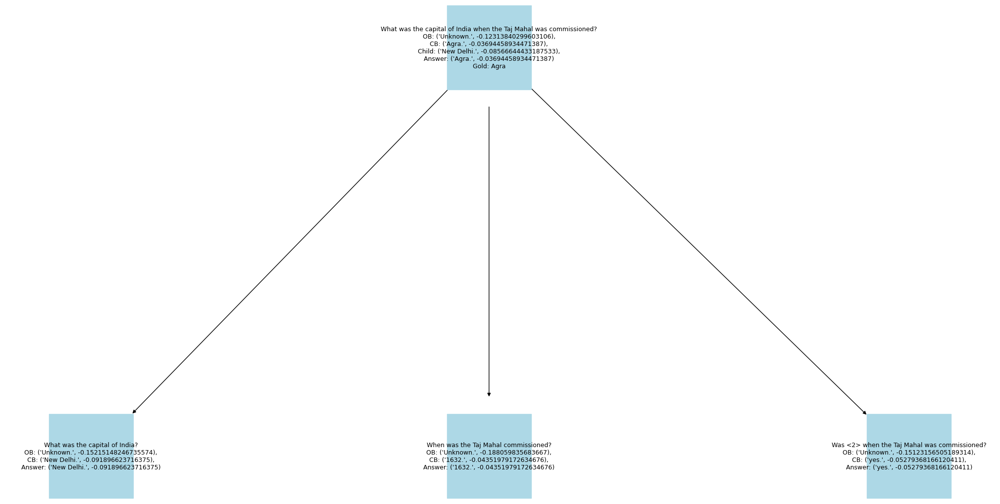

[["Forest Hill, Texas is a suburb of which fifth-largest city in the state?\nOB: ('Fort Worth.', -0.0023392936088925003),\nCB: ('Fort Worth.', -0.05589633076312407),\nChild: ('Unknown.', -0.05790958571110147),\nAnswer: ('Fort Worth.', -0.0023392936088925003)\nGold: Fort Worth", "Forest Hill, Texas is a suburb of which city in the state?\nOB: ('Fort Worth.', -0.057326631890697866),\nCB: ('Fort Worth.', -0.08735123102321057),\nAnswer: ('Fort Worth.', -0.057326631890697866)"], ["Forest Hill, Texas is a suburb of which fifth-largest city in the state?\nOB: ('Fort Worth.', -0.0023392936088925003),\nCB: ('Fort Worth.', -0.05589633076312407),\nChild: ('Unknown.', -0.05790958571110147),\nAnswer: ('Fort Worth.', -0.0023392936088925003)\nGold: Fort Worth", 'Which city in the state is the fifth-largest?\nOB: (\'Ujjain.\', -0.06809869588011666),\nCB: ("Please provide the question, and I\'ll answer it in the same format.", -100),\nAnswer: (\'Ujjain.\', -0.06809869588011666)']]


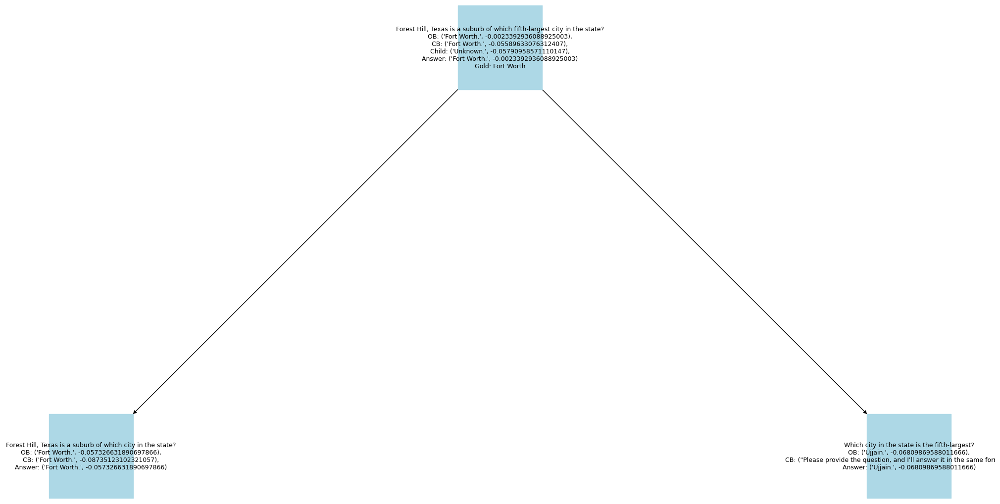

[["Which genus has the most number of species, Myrsine or Styrax?\nOB: ('Unknown.', -0.15260811638368277),\nCB: ('Myrsine.', -0.1272476559466547),\nChild: ('Myrsine.', -0.08767833810053845),\nAnswer: ('Myrsine.', -0.08767833810053845)\nGold: Myrsine", "How many species are in the genus Myrsine?\nOB: ('200.', -0.11200752042411181),\nCB: ('40.', -0.15724457331788),\nAnswer: ('200.', -0.11200752042411181)"], ["Which genus has the most number of species, Myrsine or Styrax?\nOB: ('Unknown.', -0.15260811638368277),\nCB: ('Myrsine.', -0.1272476559466547),\nChild: ('Myrsine.', -0.08767833810053845),\nAnswer: ('Myrsine.', -0.08767833810053845)\nGold: Myrsine", "How many species are in the genus Styrax?\nOB: ('at least 5.', -0.0790603112291614),\nCB: ('175.', -0.1425350936178762),\nAnswer: ('at least 5.', -0.0790603112291614)"]]


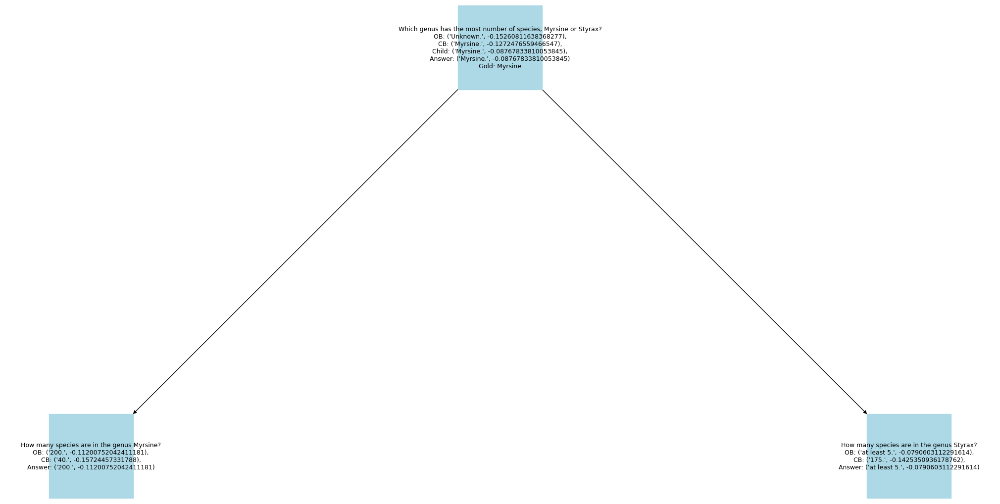

[["Rock Springs is a collection of short stories by an author born in what year?\nOB: ('1944.', -0.03738614634847272),\nCB: ('1944.', -0.06429854825609364),\nChild: ('1944.', -0.08619056529380545),\nAnswer: ('1944.', -0.03738614634847272)\nGold: 1944", "Who is the author of Rock Springs?\nOB: ('Unknown.', -100),\nCB: ('Richard Ford.', -0.18988338594053208),\nAnswer: ('Richard Ford.', -0.18988338594053208)"], ["Rock Springs is a collection of short stories by an author born in what year?\nOB: ('1944.', -0.03738614634847272),\nCB: ('1944.', -0.06429854825609364),\nChild: ('1944.', -0.08619056529380545),\nAnswer: ('1944.', -0.03738614634847272)\nGold: 1944", "In what year was <1> born?\nOB: ('1944.', -0.054199603196601116),\nCB: ('1913.', -0.028221235166107195),\nAnswer: ('1913.', -0.028221235166107195)"]]


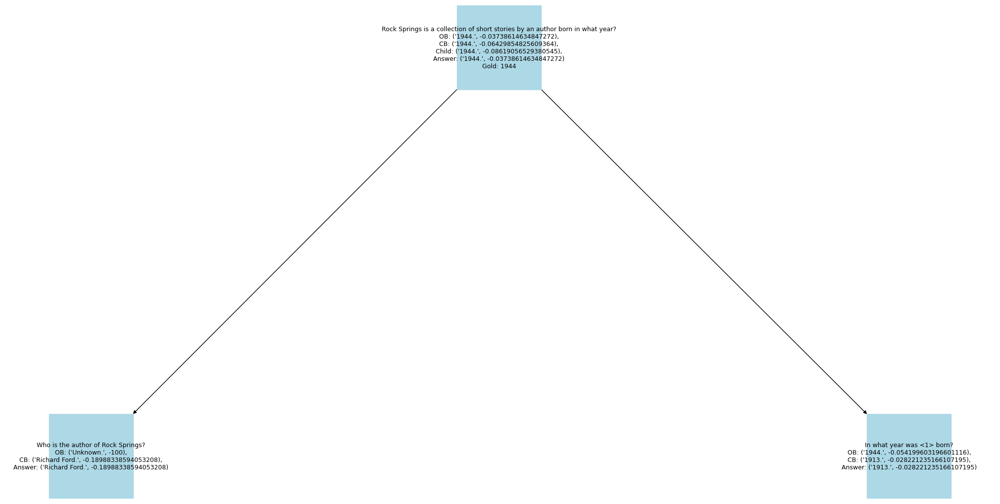

[["Which tennis player is older out of John Peers and Simone Bolelli?\nOB: ('Unknown.', -0.11245104227586282),\nCB: ('Simone Bolelli.', -0.10503724276418856),\nChild: ('Simone Bolelli.', -0.03418359860429334),\nAnswer: ('Simone Bolelli.', -0.03418359860429334)\nGold: Simone Bolelli", "When was John Peers born?\nOB: ('25 July 1988.', -0.02726595219565076),\nCB: ('24 April 1887.', -0.18313123904290873),\nAnswer: ('25 July 1988.', -0.02726595219565076)"], ["Which tennis player is older out of John Peers and Simone Bolelli?\nOB: ('Unknown.', -0.11245104227586282),\nCB: ('Simone Bolelli.', -0.10503724276418856),\nChild: ('Simone Bolelli.', -0.03418359860429334),\nAnswer: ('Simone Bolelli.', -0.03418359860429334)\nGold: Simone Bolelli", "When was Simone Bolelli born?\nOB: ('8 October 1985.', -0.031057047880645335),\nCB: ('April 8, 1956.', -0.22224421574544645),\nAnswer: ('8 October 1985.', -0.031057047880645335)"]]


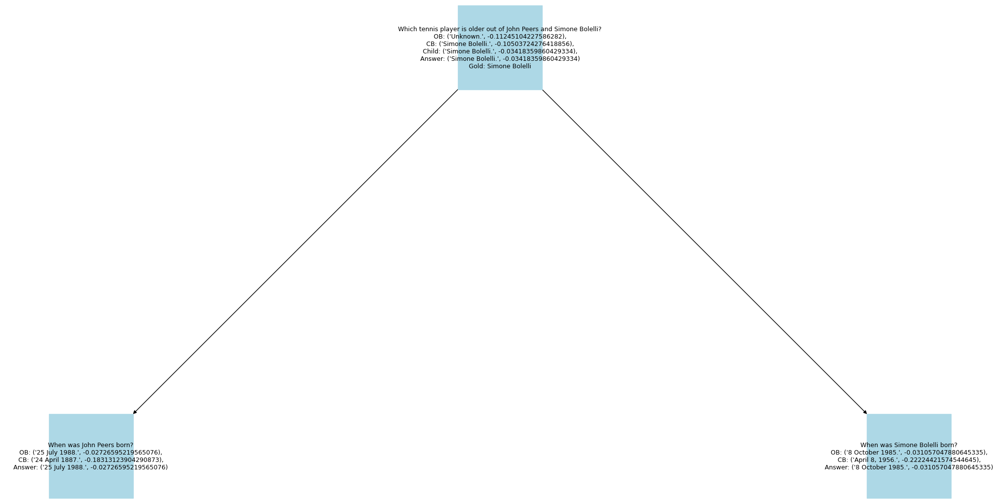

[["Don Holmes played for the football club that is based in what eastern suburb of Perth?\nOB: ('Bassendean.', -0.023267130560739997),\nCB: ('Fremantle.', -0.10921653806926965),\nChild: ('Bassendean.', -0.07290703445570218),\nAnswer: ('Bassendean.', -0.023267130560739997)\nGold: Bassendean", "Which football club did Don Holmes play for?\nOB: ('Swan Districts and West Coast.', -0.04929428808318237),\nCB: ('Bradford City.', -0.23123948630080005),\nAnswer: ('Swan Districts and West Coast.', -0.04929428808318237)"], ["Don Holmes played for the football club that is based in what eastern suburb of Perth?\nOB: ('Bassendean.', -0.023267130560739997),\nCB: ('Fremantle.', -0.10921653806926965),\nChild: ('Bassendean.', -0.07290703445570218),\nAnswer: ('Bassendean.', -0.023267130560739997)\nGold: Bassendean", "What eastern suburb of Perth is <1> based in?\nOB: ('Bassendean.', -0.09965919881899409),\nCB: ('Bassendean.', -0.195987868379154),\nAnswer: ('Bassendean.', -0.09965919881899409)"]]


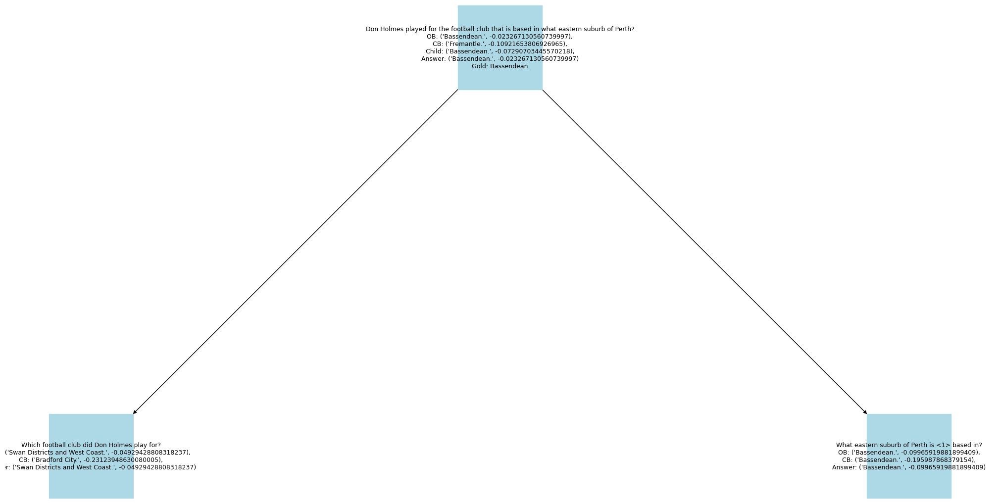

[["In what country did Gildo Siopaes win a bronze medal for bobsledding in the 1964 Winter Olympics?\nOB: ('Austria.', -0.0038236591962789277),\nCB: ('Austria.', -0.07325465219371473),\nChild: ('Brazil.', -0.08811280171988087),\nAnswer: ('Austria.', -0.0038236591962789277)\nGold: Austria", "Which country did Gildo Siopaes win a bronze medal for bobsledding in?\nOB: ('Unknown.', -100),\nCB: ('Brazil.', -0.16453583662164764),\nAnswer: ('Brazil.', -0.16453583662164764)"], ["In what country did Gildo Siopaes win a bronze medal for bobsledding in the 1964 Winter Olympics?\nOB: ('Austria.', -0.0038236591962789277),\nCB: ('Austria.', -0.07325465219371473),\nChild: ('Brazil.', -0.08811280171988087),\nAnswer: ('Austria.', -0.0038236591962789277)\nGold: Austria", "In <1>, Gildo Siopaes won a bronze medal in the 1964 Winter Olympics?\nOB: ('yes.', -0.02030642954657607),\nCB: ('no.', -0.13086536623939618),\nAnswer: ('yes.', -0.02030642954657607)"]]


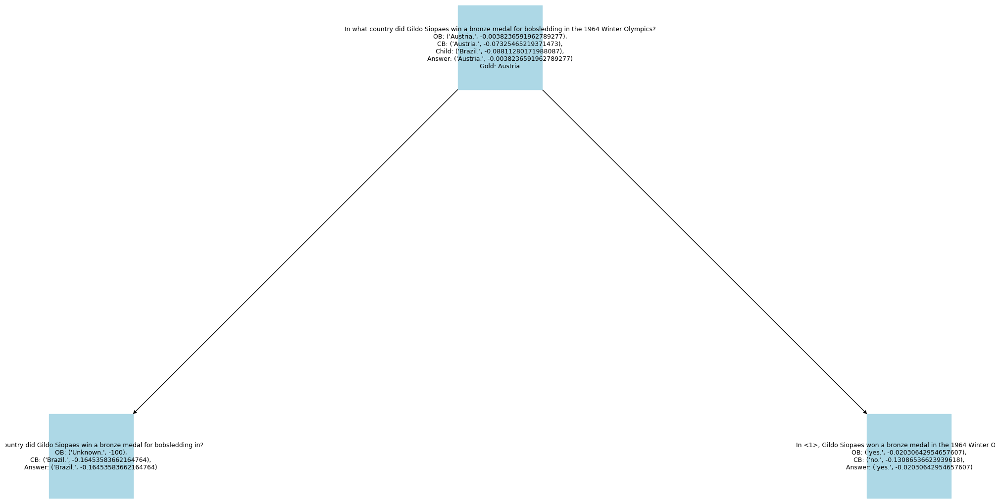

[['Lost!" is a song by a British rock band formed in what year?\nOB: (\'Unknown.\', -100),\nCB: (\'1996.\', -0.06938077058647349),\nChild: (\'1996.\', -0.08450075399880157),\nAnswer: (\'1996.\', -0.06938077058647349)\nGold: 1996', 'Which British rock band has a song called "Lost!"?\nOB: (\'Unknown.\', -0.17843020657757816),\nCB: (\'Coldplay.\', -0.10104487531031998),\nAnswer: (\'Coldplay.\', -0.10104487531031998)'], ['Lost!" is a song by a British rock band formed in what year?\nOB: (\'Unknown.\', -100),\nCB: (\'1996.\', -0.06938077058647349),\nChild: (\'1996.\', -0.08450075399880157),\nAnswer: (\'1996.\', -0.06938077058647349)\nGold: 1996', "In what year was <1> formed?\nOB: ('1996.', -0.08918778093953333),\nCB: ('1996.', -0.07456142979603186),\nAnswer: ('1996.', -0.07456142979603186)"]]


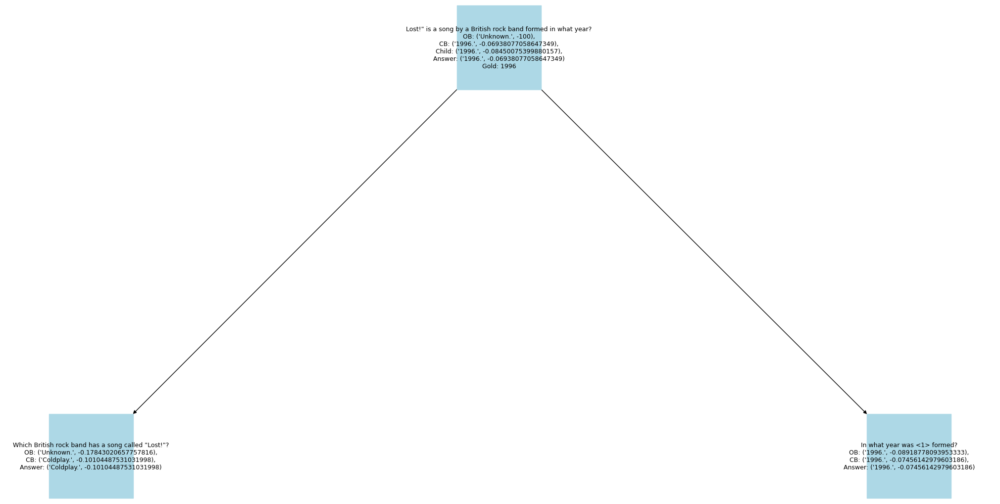

[["Which sport has been played at the BayArena in Leverkusen, Germany, since 1958?\nOB: ('Football.', -0.033929979805827994),\nCB: ('football.', -0.15983461935536827),\nChild: ('Football.', -0.06391093016164051),\nAnswer: ('Football.', -0.033929979805827994)\nGold: football", "Which arena in Leverkusen, Germany, has had a sport played since 1958?\nOB: ('BayArena.', -0.03289636015433333),\nCB: ('BayArena.', -0.08387430113379965),\nAnswer: ('BayArena.', -0.03289636015433333)"], ["Which sport has been played at the BayArena in Leverkusen, Germany, since 1958?\nOB: ('Football.', -0.033929979805827994),\nCB: ('football.', -0.15983461935536827),\nChild: ('Football.', -0.06391093016164051),\nAnswer: ('Football.', -0.033929979805827994)\nGold: football", "What sport has been played at <1>?\nOB: ('Football.', -0.0694849789199675),\nCB: ('handball and basketball.', -0.11777459227996566),\nAnswer: ('Football.', -0.0694849789199675)"]]


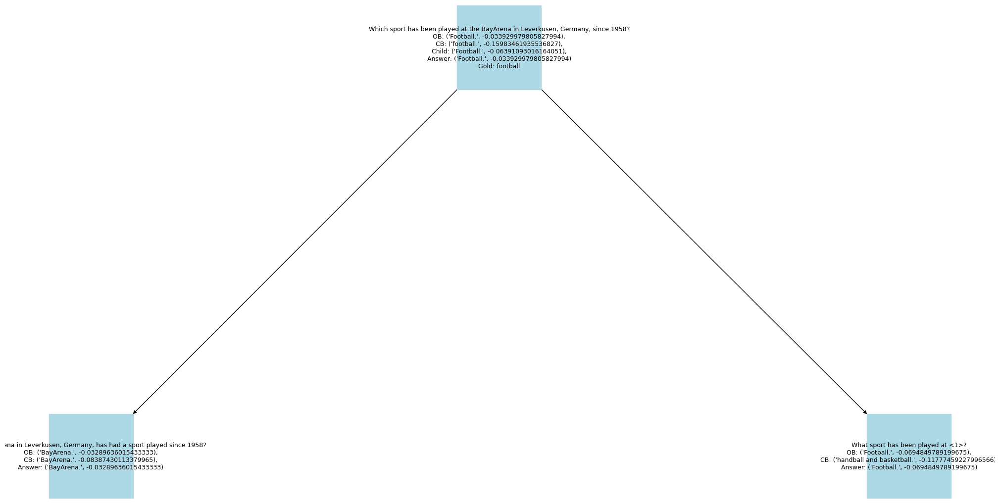

[["Was Pocahontas made before Born in China?\nOB: ('Unknown.', -0.162568407721588),\nCB: ('yes.', -0.06913765037029604),\nChild: ('yes.', -0.06344942772498484),\nAnswer: ('yes.', -0.06344942772498484)\nGold: yes", "When was Pocahontas made?\nOB: ('Unknown.', -0.2928935963062144),\nCB: ('1995.', -0.17887263712053872),\nAnswer: ('1995.', -0.17887263712053872)"], ["Was Pocahontas made before Born in China?\nOB: ('Unknown.', -0.162568407721588),\nCB: ('yes.', -0.06913765037029604),\nChild: ('yes.', -0.06344942772498484),\nAnswer: ('yes.', -0.06344942772498484)\nGold: yes", "When was Born in China made?\nOB: ('2016.', -0.04711886491536904),\nCB: ('2007.', -0.0958364250505276),\nAnswer: ('2016.', -0.04711886491536904)"]]


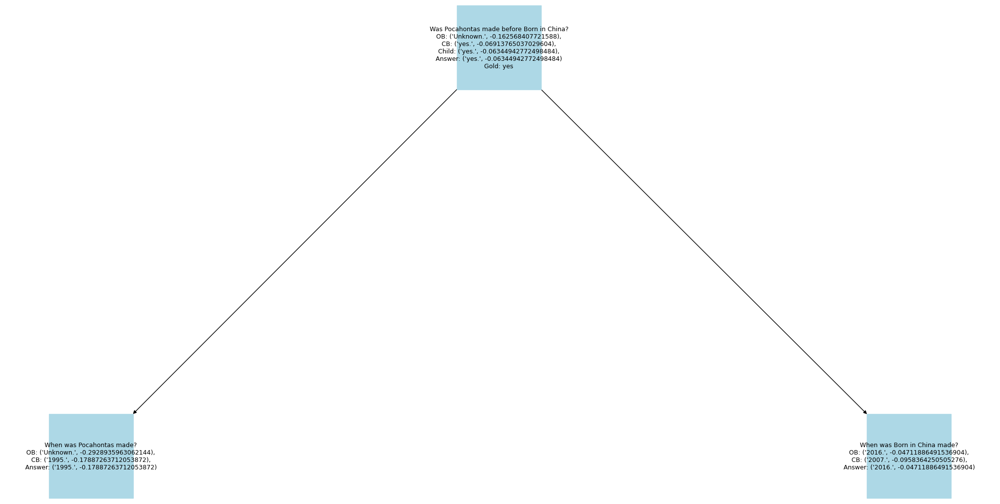

[["Where is the American Hockey League, that Dan Frawley played in, located?\nOB: ('Unknown.', -0.15521406347343167),\nCB: ('United States and Canada.', -0.114980628052987),\nChild: ('Unknown.', -25.052779638277997),\nAnswer: ('United States and Canada.', -0.114980628052987)\nGold: United States and Canada", "Which league did Dan Frawley play in?\nOB: ('rugby league.', -0.022567641139073998),\nCB: ('Victorian Football League.', -0.1991553045443976),\nAnswer: ('rugby league.', -0.022567641139073998)"], ["Where is the American Hockey League, that Dan Frawley played in, located?\nOB: ('Unknown.', -0.15521406347343167),\nCB: ('United States and Canada.', -0.114980628052987),\nChild: ('Unknown.', -25.052779638277997),\nAnswer: ('United States and Canada.', -0.114980628052987)\nGold: United States and Canada", "Where is <1>?\nOB: ('England.', -0.10157621819488832),\nCB: ('the UK, Australia, New Zealand, and Papua New Guinea.', -0.14990107778120462),\nAnswer: ('England.', -0.10157621819488832

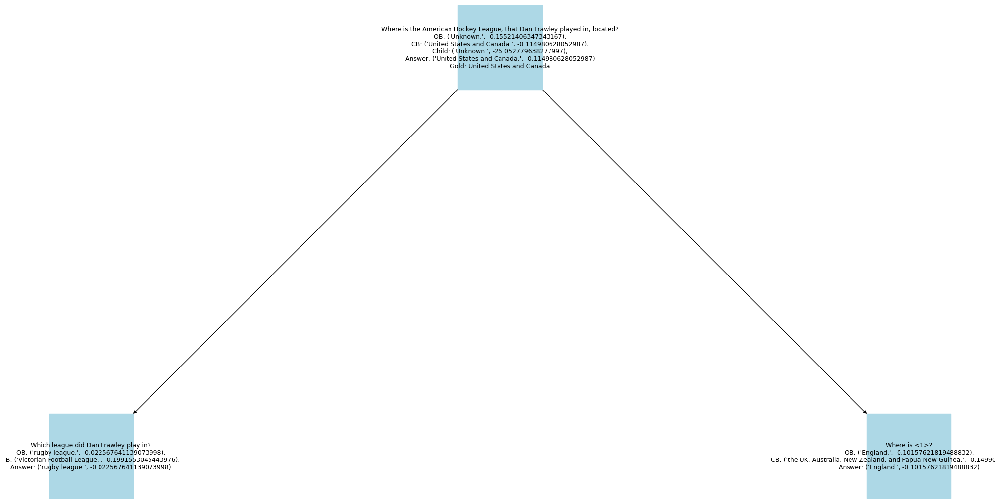

[["This team which is moving from Oakland, California to Las Vegas Nevada with share its stadium with what college?\nOB: ('Unknown.', -0.03712570515169958),\nCB: ('University of Nevada, Las Vegas.', -0.05132412227118114),\nChild: ('UNLV.', -0.06531896422998007),\nAnswer: ('University of Nevada, Las Vegas.', -0.05132412227118114)\nGold: University of Nevada, Las Vegas", "Which team is moving from Oakland, California to Las Vegas Nevada?\nOB: ('Oakland Raiders.', -0.024887959660687332),\nCB: ('the Oakland Raiders.', -0.09819642208662689),\nAnswer: ('Oakland Raiders.', -0.024887959660687332)"], ["This team which is moving from Oakland, California to Las Vegas Nevada with share its stadium with what college?\nOB: ('Unknown.', -0.03712570515169958),\nCB: ('University of Nevada, Las Vegas.', -0.05132412227118114),\nChild: ('UNLV.', -0.06531896422998007),\nAnswer: ('University of Nevada, Las Vegas.', -0.05132412227118114)\nGold: University of Nevada, Las Vegas", "With which college will <1> s

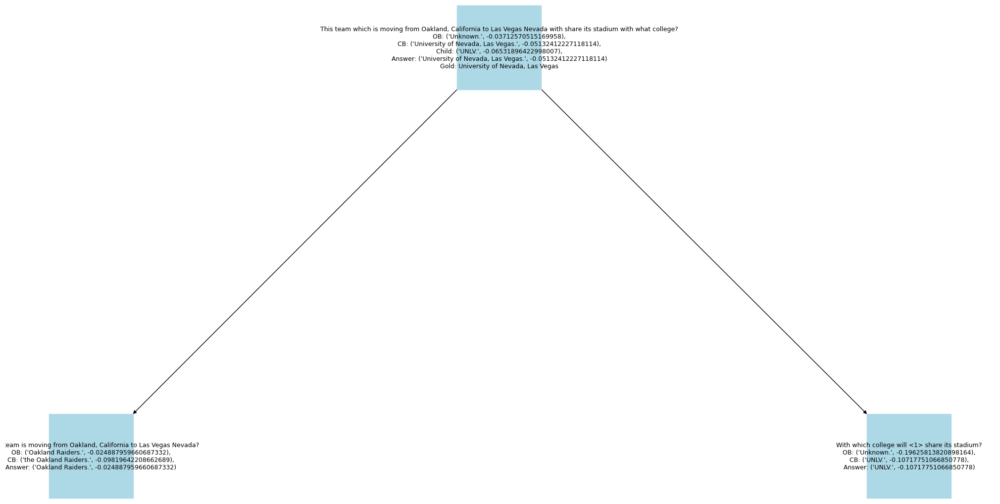

[["Are both Forman Christian College and Purbanchal University public schools?\nOB: ('No.', -0.02821306737184818),\nCB: ('no.', -0.07826021241244567),\nChild: ('no.', -0.04984080948022428),\nAnswer: ('No.', -0.02821306737184818)\nGold: no", "Is Forman Christian College a public school?\nOB: ('no.', -0.042658279360019154),\nCB: ('no.', -0.09227849542598876),\nAnswer: ('no.', -0.042658279360019154)"], ["Are both Forman Christian College and Purbanchal University public schools?\nOB: ('No.', -0.02821306737184818),\nCB: ('no.', -0.07826021241244567),\nChild: ('no.', -0.04984080948022428),\nAnswer: ('No.', -0.02821306737184818)\nGold: no", "Is Purbanchal University a public school?\nOB: ('yes.', -0.05399153865162619),\nCB: ('yes.', -0.16213626652871524),\nAnswer: ('yes.', -0.05399153865162619)"]]


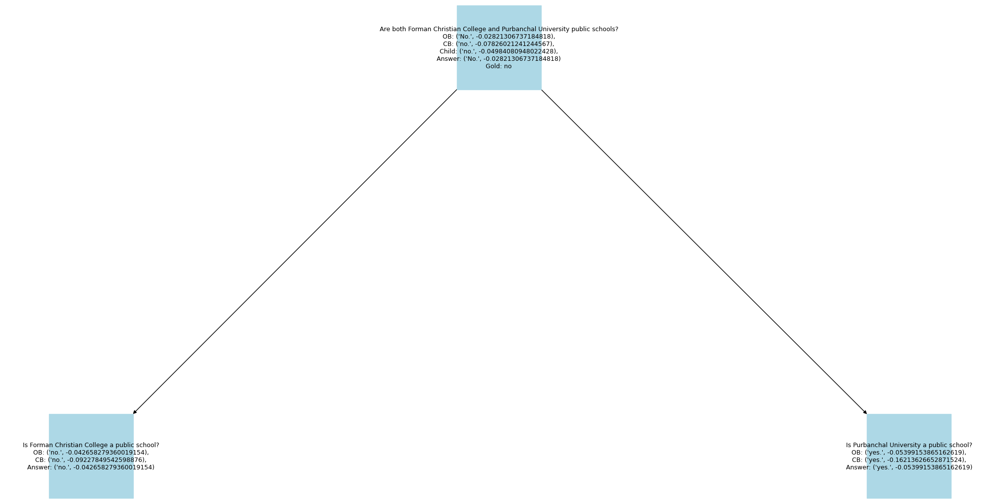

[["When was the  Argentine former footballer which  Dutch manager Ronald Koeman replaced in  2014–15 Southampton F.C. season born?\nOB: ('Unknown.', -0.08319769532067083),\nCB: ('7 December 1990.', -0.08438686443769129),\nChild: ('2 March 1972.', -0.04083676912766922),\nAnswer: ('2 March 1972.', -0.04083676912766922)\nGold: 2 March 1972", "Which Argentine former footballer did Dutch manager Ronald Koeman replace in 2014–15 Southampton F.C. season?\nOB: ('Mauricio Pochettino.', -0.025296988849709393),\nCB: ('Mauricio Pochettino.', -0.08696857716350681),\nAnswer: ('Mauricio Pochettino.', -0.025296988849709393)"], ["When was the  Argentine former footballer which  Dutch manager Ronald Koeman replaced in  2014–15 Southampton F.C. season born?\nOB: ('Unknown.', -0.08319769532067083),\nCB: ('7 December 1990.', -0.08438686443769129),\nChild: ('2 March 1972.', -0.04083676912766922),\nAnswer: ('2 March 1972.', -0.04083676912766922)\nGold: 2 March 1972", "When was <1> born?\nOB: ('2 March 1972.'

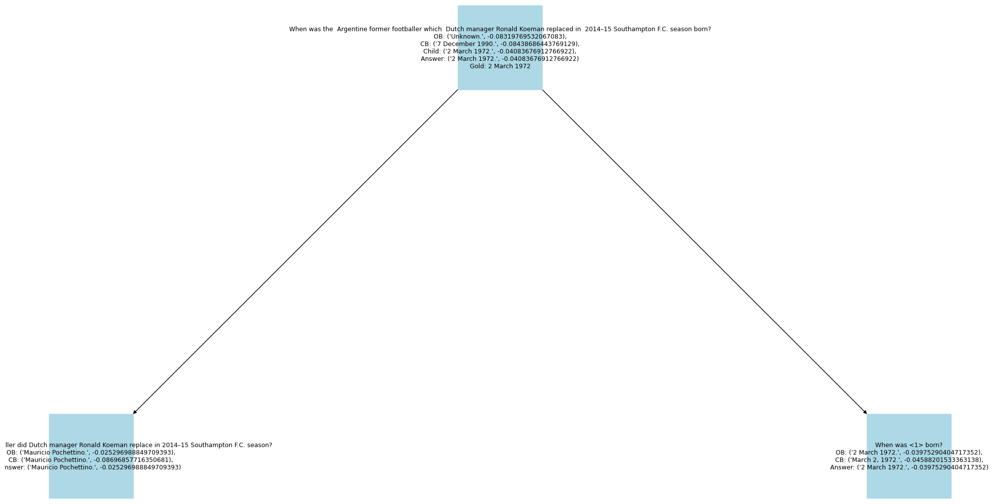

[["Were Paul Éluard and Georges Bataille from the same country?\nOB: ('Yes.', -0.026919620006285234),\nCB: ('yes.', -0.12218307381037762),\nChild: ('yes.', -0.033772945553734515),\nAnswer: ('Yes.', -0.026919620006285234)\nGold: yes", "What country was Paul Éluard from?\nOB: ('France.', -0.0023146271812625),\nCB: ('France.', -0.07474963411899875),\nAnswer: ('France.', -0.0023146271812625)"], ["Were Paul Éluard and Georges Bataille from the same country?\nOB: ('Yes.', -0.026919620006285234),\nCB: ('yes.', -0.12218307381037762),\nChild: ('yes.', -0.033772945553734515),\nAnswer: ('Yes.', -0.026919620006285234)\nGold: yes", "What country was Georges Bataille from?\nOB: ('France.', -0.007657885750940769),\nCB: ('France.', -0.0974600615636165),\nAnswer: ('France.', -0.007657885750940769)"]]


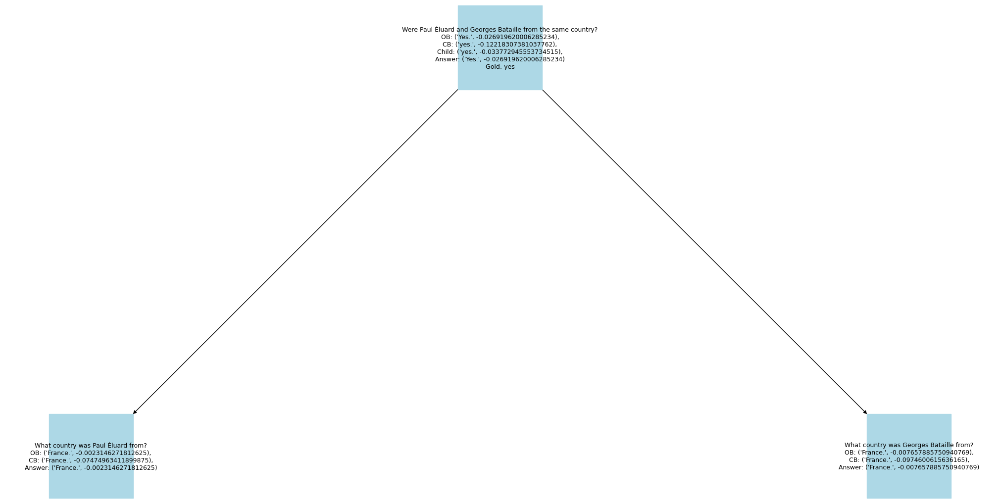

[["Which is bigger, Griffon Bruxellois or English Mastiff?\nOB: ('English Mastiff.', -0.015492049662135772),\nCB: ('English Mastiff.', -0.08246249416190872),\nChild: ('English Mastiff.', -0.05046105096062431),\nAnswer: ('English Mastiff.', -0.015492049662135772)\nGold: English Mastiff", "What is the size of Griffon Bruxellois?\nOB: ('toy.', -0.00986232941169643),\nCB: ('28-32 cm (11-12.5 in) in height and 25-30 kg (55-66 lbs) in weight.', -0.11424945272055251),\nAnswer: ('toy.', -0.00986232941169643)"], ["Which is bigger, Griffon Bruxellois or English Mastiff?\nOB: ('English Mastiff.', -0.015492049662135772),\nCB: ('English Mastiff.', -0.08246249416190872),\nChild: ('English Mastiff.', -0.05046105096062431),\nAnswer: ('English Mastiff.', -0.015492049662135772)\nGold: English Mastiff", "What is the size of English Mastiff?\nOB: ('extremely large.', -0.03253698390012834),\nCB: ('130-230 pounds, 23-30 inches.', -0.1669643071149905),\nAnswer: ('extremely large.', -0.03253698390012834)"]]


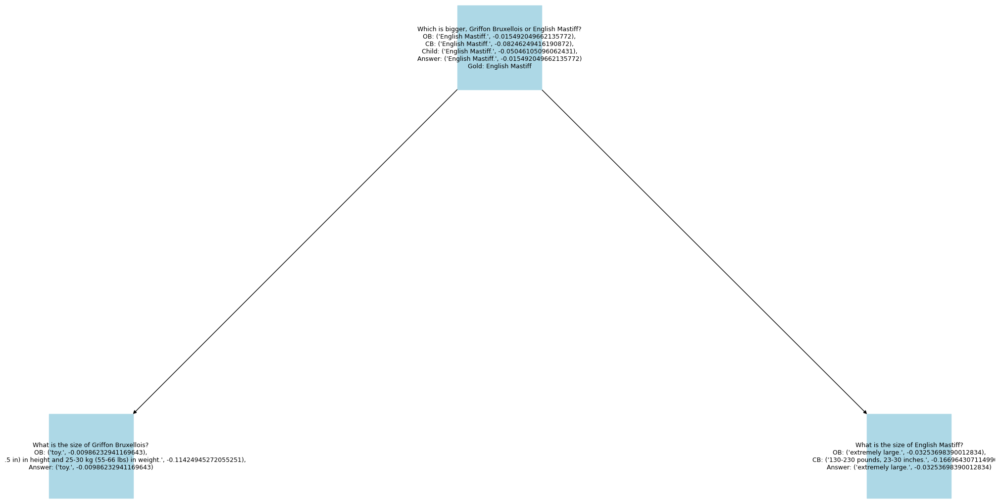

[["Firstar Center was the name for two buildings before the company changed its name to match which company based in Minneapolis?\nOB: ('U.S. Bancorp.', -0.022468895713503995),\nCB: ('U.S. Bank.', -0.1250498619057998),\nChild: ('US Bancorp.', -0.09365384908824612),\nAnswer: ('U.S. Bancorp.', -0.022468895713503995)\nGold: U.S. Bancorp", "What company had Firstar Center as the name for two buildings before it changed its name?\nOB: ('Firstar Corporation.', -0.022301212402357384),\nCB: ('US Bancorp.', -0.0673553072632775),\nAnswer: ('Firstar Corporation.', -0.022301212402357384)"], ["Firstar Center was the name for two buildings before the company changed its name to match which company based in Minneapolis?\nOB: ('U.S. Bancorp.', -0.022468895713503995),\nCB: ('U.S. Bank.', -0.1250498619057998),\nChild: ('US Bancorp.', -0.09365384908824612),\nAnswer: ('U.S. Bancorp.', -0.022468895713503995)\nGold: U.S. Bancorp", "The company changed its name to match which company based in Minneapolis?\nO

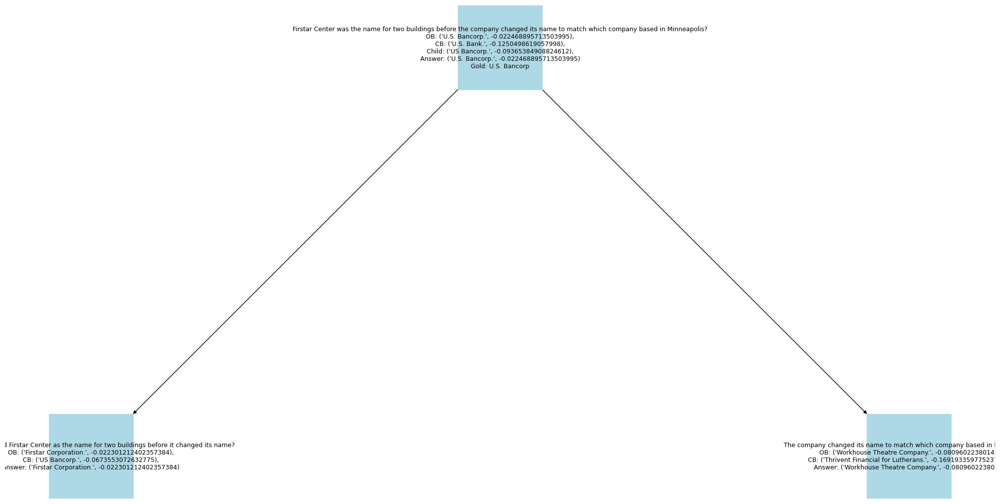

[["Which current CBS NBA analyst played for the PORTLAND TRAILBLazers along with former UNLV teammate Stacey Augmon?\nOB: ('Greg Anthony.', -0.007567882583273159),\nCB: ('Greg Anthony.', -0.03848242314105),\nChild: ('Greg Anthony.', -0.08130284029444082),\nAnswer: ('Greg Anthony.', -0.007567882583273159)\nGold: Greg Anthony", "Which current CBS NBA analyst played for the PORTLAND TRAILBLazers?\nOB: ('Michael Holton.', -0.1328752977423276),\nCB: ('Greg Anthony.', -0.12547304380757907),\nAnswer: ('Greg Anthony.', -0.12547304380757907)"], ["Which current CBS NBA analyst played for the PORTLAND TRAILBLazers along with former UNLV teammate Stacey Augmon?\nOB: ('Greg Anthony.', -0.007567882583273159),\nCB: ('Greg Anthony.', -0.03848242314105),\nChild: ('Greg Anthony.', -0.08130284029444082),\nAnswer: ('Greg Anthony.', -0.007567882583273159)\nGold: Greg Anthony", "Which current CBS NBA analyst played with Stacey Augmon?\nOB: ('Unknown.', -100),\nCB: ('Greg Anthony.', -0.079608384735276),\nAns

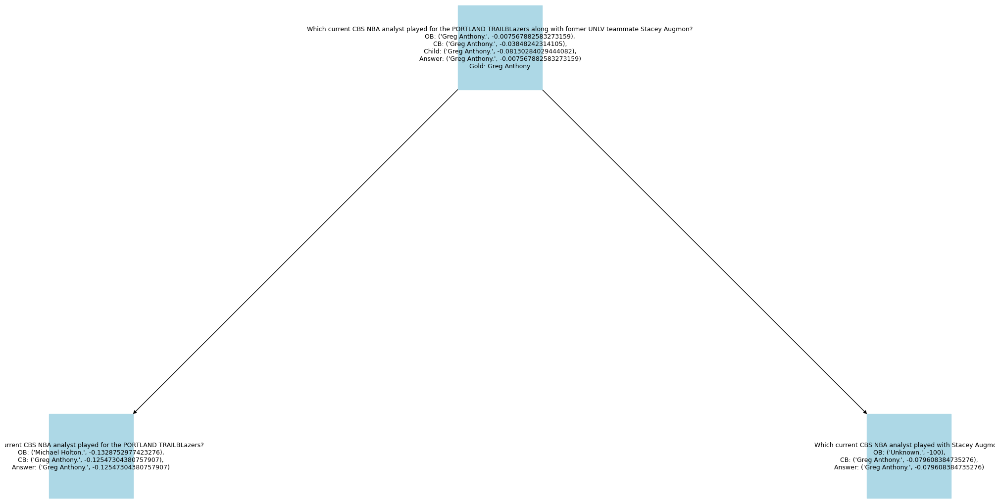

[["What was the company that was co-owned by the person who Abbe error was named after?\nOB: ('Unknown.', -100),\nCB: ('Carl Zeiss AG.', -0.13444435627656026),\nChild: ('Carl Zeiss AG.', -0.08184595387966438),\nAnswer: ('Carl Zeiss AG.', -0.08184595387966438)\nGold: Carl Zeiss AG", "Who was Abbe error named after?\nOB: ('Ernst Abbe.', -0.056376684795760905),\nCB: ('Ernst Abbe.', -0.21921162297598376),\nAnswer: ('Ernst Abbe.', -0.056376684795760905)"], ["What was the company that was co-owned by the person who Abbe error was named after?\nOB: ('Unknown.', -100),\nCB: ('Carl Zeiss AG.', -0.13444435627656026),\nChild: ('Carl Zeiss AG.', -0.08184595387966438),\nAnswer: ('Carl Zeiss AG.', -0.08184595387966438)\nGold: Carl Zeiss AG", "What was the company that was co-owned by <1>?\nOB: ('Carl Zeiss AG.', -0.016326419681248754),\nCB: ('Carl Zeiss AG.', -0.11924845942228335),\nAnswer: ('Carl Zeiss AG.', -0.016326419681248754)"]]


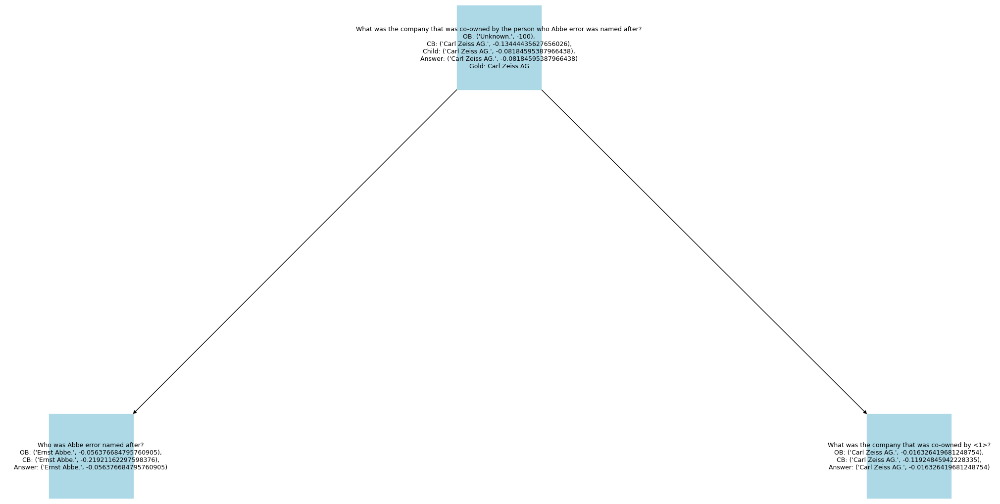

[['what air force based named in honor of Carl Benjamin "Ben" Eielson is located 26 miles southeast of Fairbanks, Alaska?\nOB: (\'Eielson Air Force Base.\', -0.012299846443606922),\nCB: (\'Eielson Air Force Base.\', -0.008410808530581189),\nChild: (\'Eielson Air Force Base.\', -0.04045003099601066),\nAnswer: (\'Eielson Air Force Base.\', -0.008410808530581189)\nGold: Eielson Air Force Base', 'What air force base is named in honor of Carl Benjamin "Ben" Eielson?\nOB: (\'Eielson Air Force Base.\', -0.0757067493423675),\nCB: (\'Eielson Air Force Base.\', -0.026800370220443497),\nAnswer: (\'Eielson Air Force Base.\', -0.026800370220443497)'], ['what air force based named in honor of Carl Benjamin "Ben" Eielson is located 26 miles southeast of Fairbanks, Alaska?\nOB: (\'Eielson Air Force Base.\', -0.012299846443606922),\nCB: (\'Eielson Air Force Base.\', -0.008410808530581189),\nChild: (\'Eielson Air Force Base.\', -0.04045003099601066),\nAnswer: (\'Eielson Air Force Base.\', -0.00841080853

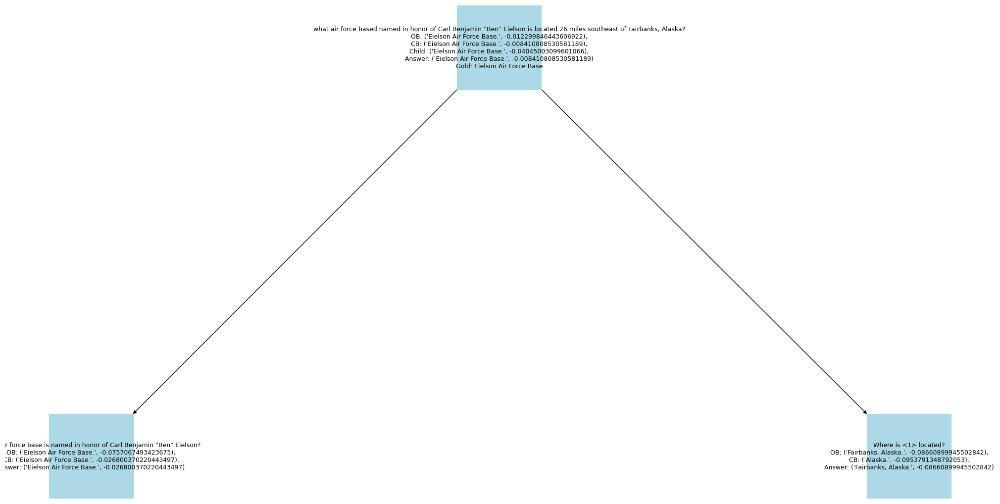

[["What term is the current chairman of Prince William County serving?\nOB: ('fourth term.', -0.08499666017965962),\nCB: ('first term.', -0.1258228075567758),\nChild: ('fourth term.', -0.03253754694015786),\nAnswer: ('fourth term.', -0.03253754694015786)\nGold: fourth term", "Who is the current chairman of Prince William County?\nOB: ('Corey A. Stewart.', -0.0719676026145723),\nCB: ('Corey Stewart.', -0.19779904344533497),\nAnswer: ('Corey A. Stewart.', -0.0719676026145723)"], ["What term is the current chairman of Prince William County serving?\nOB: ('fourth term.', -0.08499666017965962),\nCB: ('first term.', -0.1258228075567758),\nChild: ('fourth term.', -0.03253754694015786),\nAnswer: ('fourth term.', -0.03253754694015786)\nGold: fourth term", "What term is <1> serving?\nOB: ('fourth term as At-Large Chairman of the Board of Supervisors of Prince William County, Virginia.', -0.013900182193342495),\nCB: ('Commissioner of the Bureau of the Fiscal Service.', -0.13311294648128166),\nAns

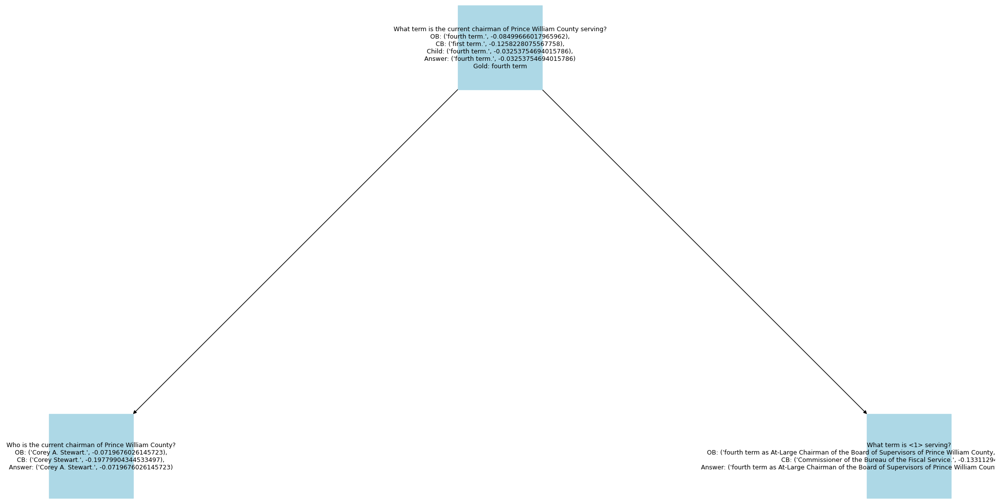

[["Who was born first, Antonin Artaud or  Elizabeth Taylor?\nOB: ('Unknown.', -100),\nCB: ('Antonin Artaud.', -0.022088734866068334),\nChild: ('Antonin Artaud.', -0.028284216689790403),\nAnswer: ('Antonin Artaud.', -0.022088734866068334)\nGold: Antonin Artaud", "When was Antonin Artaud born?\nOB: ('4 September 1896.', -0.008504338715086877),\nCB: ('4 September 1896.', -0.10474708702484213),\nAnswer: ('4 September 1896.', -0.008504338715086877)"], ["Who was born first, Antonin Artaud or  Elizabeth Taylor?\nOB: ('Unknown.', -100),\nCB: ('Antonin Artaud.', -0.022088734866068334),\nChild: ('Antonin Artaud.', -0.028284216689790403),\nAnswer: ('Antonin Artaud.', -0.022088734866068334)\nGold: Antonin Artaud", "When was Elizabeth Taylor born?\nOB: ('February 27, 1932.', -0.056428102358913074),\nCB: ('February 27, 1932.', -0.10111961876466924),\nAnswer: ('February 27, 1932.', -0.056428102358913074)"]]


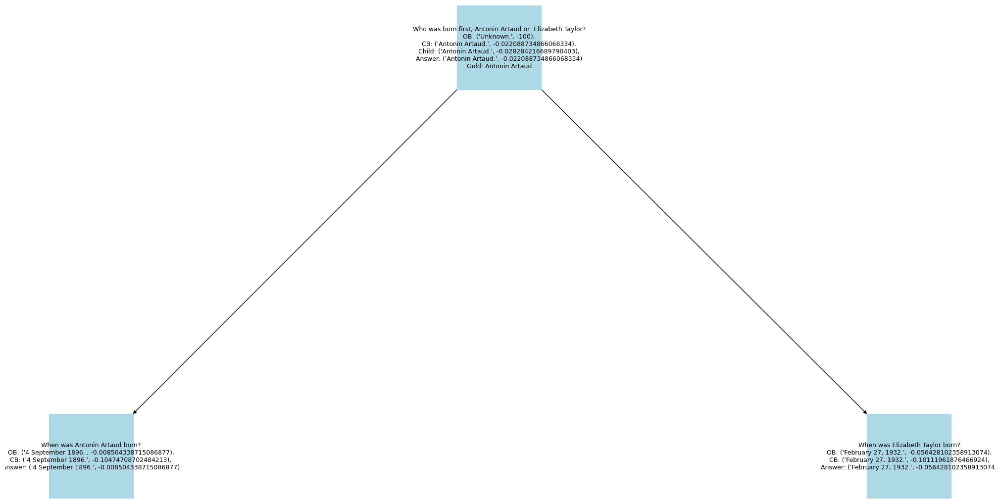

[["Toby Scott worked with which American singer born on May 24, 1941?\nOB: ('Unknown.', -0.17645614924549302),\nCB: ('Bob Dylan.', -0.07830128568446207),\nChild: ('Bob Dylan.', -0.039855775611498445),\nAnswer: ('Bob Dylan.', -0.039855775611498445)\nGold: Bob Dylan", "Which American singer was born on May 24, 1941?\nOB: ('Unknown.', -0.02523132025385656),\nCB: ('Bob Dylan.', -0.074661360829255),\nAnswer: ('Bob Dylan.', -0.074661360829255)"], ["Toby Scott worked with which American singer born on May 24, 1941?\nOB: ('Unknown.', -0.17645614924549302),\nCB: ('Bob Dylan.', -0.07830128568446207),\nChild: ('Bob Dylan.', -0.039855775611498445),\nAnswer: ('Bob Dylan.', -0.039855775611498445)\nGold: Bob Dylan", "Toby Scott worked with <1>?\nOB: ('yes.', -0.04499030125534954),\nCB: ('Toby Scott is a musician and producer. He worked with various artists, including Bob Dylan. Therefore, the answer is: yes.', -100),\nAnswer: ('yes.', -0.04499030125534954)"]]


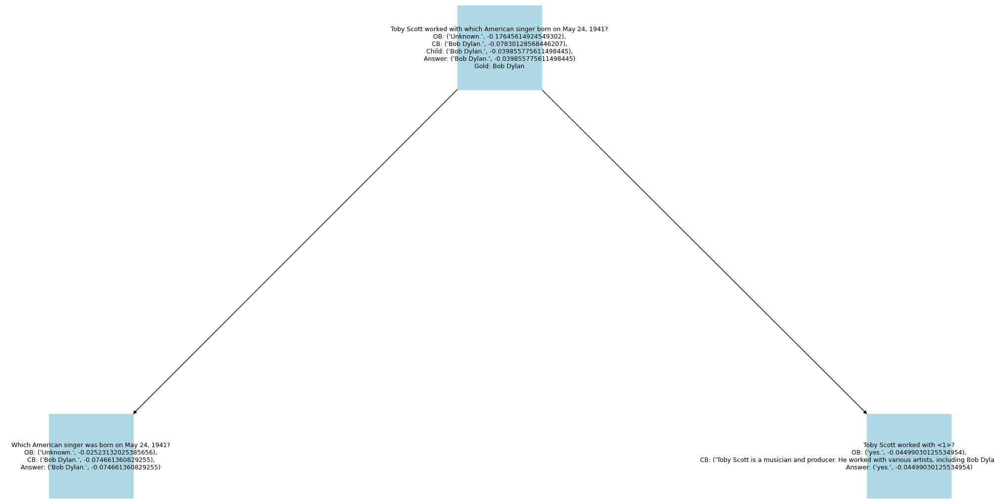

[["Church of All Saints, Doddinghurst is part of the state church led by which person?\nOB: ('the Archbishop of Canterbury.', -0.013988861039276787),\nCB: ('the Archbishop of Canterbury.', -0.02795690929609758),\nChild: ('The Archbishop of Canterbury.', -0.05261515896457687),\nAnswer: ('the Archbishop of Canterbury.', -0.013988861039276787)\nGold: Archbishop of Canterbury", "Which state church does Church of All Saints, Doddinghurst belong to?\nOB: ('Church of England.', -0.03809251508306059),\nCB: ('Church of England.', -0.12038488519784872),\nAnswer: ('Church of England.', -0.03809251508306059)"], ["Church of All Saints, Doddinghurst is part of the state church led by which person?\nOB: ('the Archbishop of Canterbury.', -0.013988861039276787),\nCB: ('the Archbishop of Canterbury.', -0.02795690929609758),\nChild: ('The Archbishop of Canterbury.', -0.05261515896457687),\nAnswer: ('the Archbishop of Canterbury.', -0.013988861039276787)\nGold: Archbishop of Canterbury", "Who leads <1>?\n

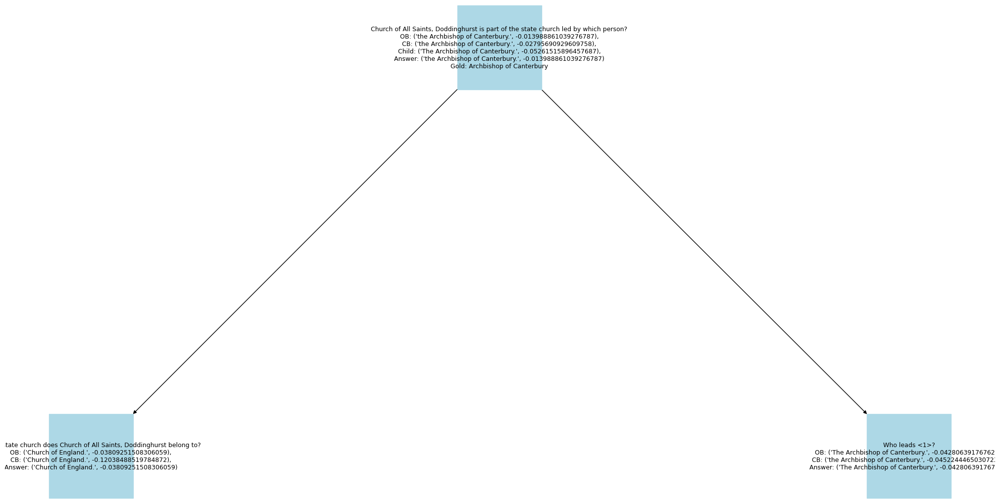

[["What ingredient is in both Cosmopolitan and Cuba Libre?\nOB: ('Lime.', -0.07238001482832428),\nCB: ('lime juice.', -0.07879318066112002),\nChild: ('lime.', -0.07146499051249203),\nAnswer: ('lime.', -0.07146499051249203)\nGold: lime", "What ingredients are in Cosmopolitan?\nOB: ('Unknown.', -0.18121696956578717),\nCB: ('vodka, triple sec, cranberry juice, and lime juice.', -0.06831184835220863),\nAnswer: ('vodka, triple sec, cranberry juice, and lime juice.', -0.06831184835220863)"], ["What ingredient is in both Cosmopolitan and Cuba Libre?\nOB: ('Lime.', -0.07238001482832428),\nCB: ('lime juice.', -0.07879318066112002),\nChild: ('lime.', -0.07146499051249203),\nAnswer: ('lime.', -0.07146499051249203)\nGold: lime", "What ingredients are in Cuba Libre?\nOB: ('cola, lime, and dark or light rum.', -0.07654476864421686),\nCB: ('rum and cola.', -0.07770277622669695),\nAnswer: ('cola, lime, and dark or light rum.', -0.07654476864421686)"], ["What ingredient is in both Cosmopolitan and Cuba

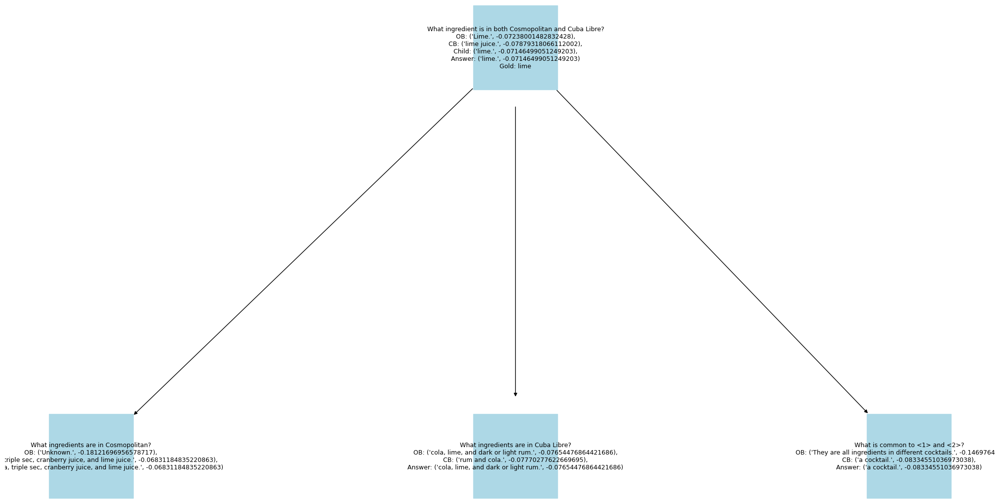

[["The winner of the the London Riders' Championship in 1953 scored how many points in the 1952 Individual Speedway World Championship?\nOB: ('Unknown.', -100),\nCB: ('14.', -0.03352437528148936),\nChild: ('14.', -0.03600321799532445),\nAnswer: ('14.', -0.03352437528148936)\nGold: 14", "Who won the London Riders' Championship in 1953?\nOB: ('Jack Young.', -0.09386686495187598),\nCB: ('Freddie Williams.', -0.2286403427387537),\nAnswer: ('Jack Young.', -0.09386686495187598)"], ["The winner of the the London Riders' Championship in 1953 scored how many points in the 1952 Individual Speedway World Championship?\nOB: ('Unknown.', -100),\nCB: ('14.', -0.03352437528148936),\nChild: ('14.', -0.03600321799532445),\nAnswer: ('14.', -0.03352437528148936)\nGold: 14", "How many points did <1> score in the 1952 Individual Speedway World Championship?\nOB: ('14.', -0.02941298484743312),\nCB: ('14.', -0.11886380605115311),\nAnswer: ('14.', -0.02941298484743312)"]]


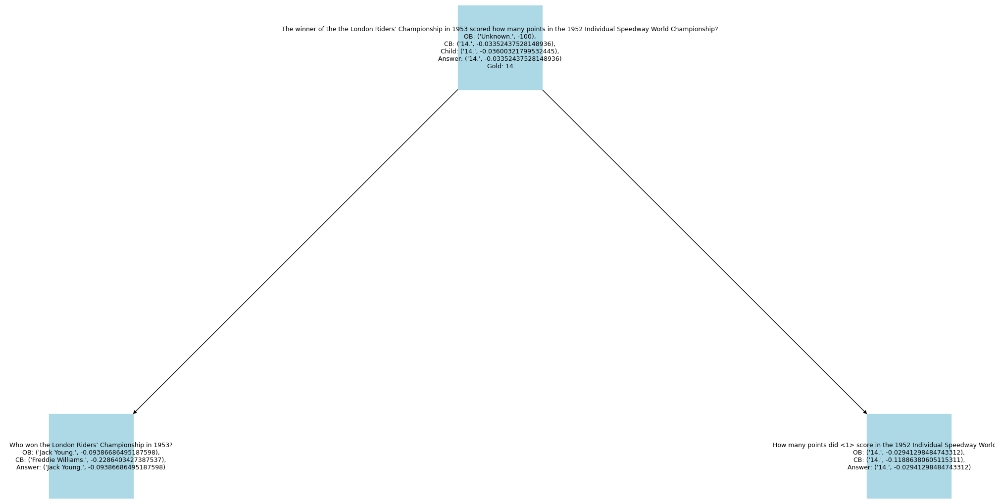

In [467]:
for parent_index in correct_answers_indices:
    create_graph_to_problem(parent_index)